# Comprehensive Radar Systems and Signal Processing Guide

## Introduction

Radar (Radio Detection and Ranging) is a fundamental technology that uses electromagnetic waves to detect, track, and characterize objects. This comprehensive guide covers:
- Radar fundamentals and physics
- System architecture and components
- Signal processing techniques
- Applications across various domains
- Hardware implementations
- Signal processing algorithms
- Data-driven and machine learning approaches

---

# 1. Radar Applications

Radar technology has a wide range of applications across various fields. Here are some notable examples:

1. Aviation: Radar is used for air traffic control, weather monitoring, and collision avoidance systems in aircraft. It helps pilots navigate safely, especially in poor visibility conditions.
2. Maritime: Ships use radar for navigation, collision avoidance, and detecting other vessels and obstacles at sea. It is also used in port management and coastal surveillance.
3. Military: Radar is extensively used in defense for detecting and tracking enemy aircraft, missiles, and ships. It is also used in missile guidance systems and battlefield surveillance.
4. Weather Forecasting: Meteorologists use radar to monitor weather patterns, track storms, and predict severe weather events like hurricanes and tornadoes. Doppler radar is particularly useful for measuring wind speeds and detecting precipitation.
5. Automotive: Radar is used in advanced driver-assistance systems (ADAS) for features like adaptive cruise control, collision avoidance, and parking assistance. It helps improve vehicle safety and automation.
6. Geology and Archaeology: Ground-penetrating radar (GPR) is used to detect and map subsurface structures, such as buried artifacts, geological formations, and underground utilities.
7. Space Exploration: Radar is used in space missions to map the surface of planets, moons, and asteroids. It helps in studying the topography and composition of celestial bodies.

These are just a few examples of how radar technology is applied in various fields. Its ability to detect and track objects makes it an invaluable tool in many industries.

---

## 1.1 Radar Fundamentals - Theory

### 1.1.1 Basic Principles

**Radar Range Equation** - The fundamental relationship for radar detection:

$$P_r = \frac{P_t G_t G_r \lambda^2 \sigma}{(4\pi)^3 R^4 L}$$

Where:
- $P_r$ = Received power
- $P_t$ = Transmitted power
- $G_t, G_r$ = Transmit and receive antenna gains
- $\lambda$ = Wavelength
- $\sigma$ = Radar cross-section (RCS) of target
- $R$ = Range to target
- $L$ = System losses

**Key Parameters**:

1. **Range**: Distance to target from transmitter
   - Formula: $R = \frac{ct}{2}$
   - where $c$ = speed of light, $t$ = round-trip delay

2. **Doppler Shift**: Frequency change due to target motion
   - Formula: $f_d = \frac{2v_r f_c}{c}$
   - where $v_r$ = radial velocity, $f_c$ = carrier frequency

3. **Resolution**:
   - Range resolution: $\Delta R = \frac{c}{2B}$ (where $B$ = bandwidth)
   - Doppler resolution: $\Delta f_d = \frac{1}{T}$ (where $T$ = integration time)

### 1.1.2 Signal Propagation and Wave Physics

1. **Electromagnetic Wave Propagation**:
   - Radar operates in free space following Maxwell's equations
   - Path loss: $L = 20\log_{10}\left(\frac{4\pi R}{\lambda}\right)$ dB
   - Multipath propagation affects received signals

2. **Radar Cross Section (RCS)**:
   - Measures how detectable a target is: $\sigma = 4\pi R^2 |S_{scattered}|^2 / |S_{incident}|^2$
   - Depends on target size, shape, material, and frequency
   - Stealth techniques minimize RCS

3. **Antenna Radiation Pattern**:
   - Beamwidth: Angular width of main lobe (typically -3dB points)
   - Sidelobe levels: Unwanted radiation in other directions
   - Gain: Directivity improvement over isotropic radiator

RADAR FUNDAMENTALS - PYTHON EXAMPLES

1. RADAR RANGE EQUATION AND DETECTION
--------------------------------------------------------------------------------
Transmitter: Pt = 40 dBW (10000.00 W)
Frequency: 10.0 GHz, Wavelength: 0.0300 m
Antenna gains: Gt = 20 dB, Gr = 20 dB
Target RCS: 10 m²

Range Analysis:
Range (km)      Received Power (dBm)      Received Power (W)       
-----------------------------------------------------------------
10              -103.44                   4.53e-14                 
50              -131.40                   7.25e-17                 
100             -143.44                   4.53e-18                 
200             -155.48                   2.83e-19                 
500             -171.40                   7.25e-21                 

2. DOPPLER SHIFT AND VELOCITY ESTIMATION
--------------------------------------------------------------------------------
Carrier frequency: 10.0 GHz

Velocity (m/s)       Velocity (km/h)      Doppler Freq (Hz)    D

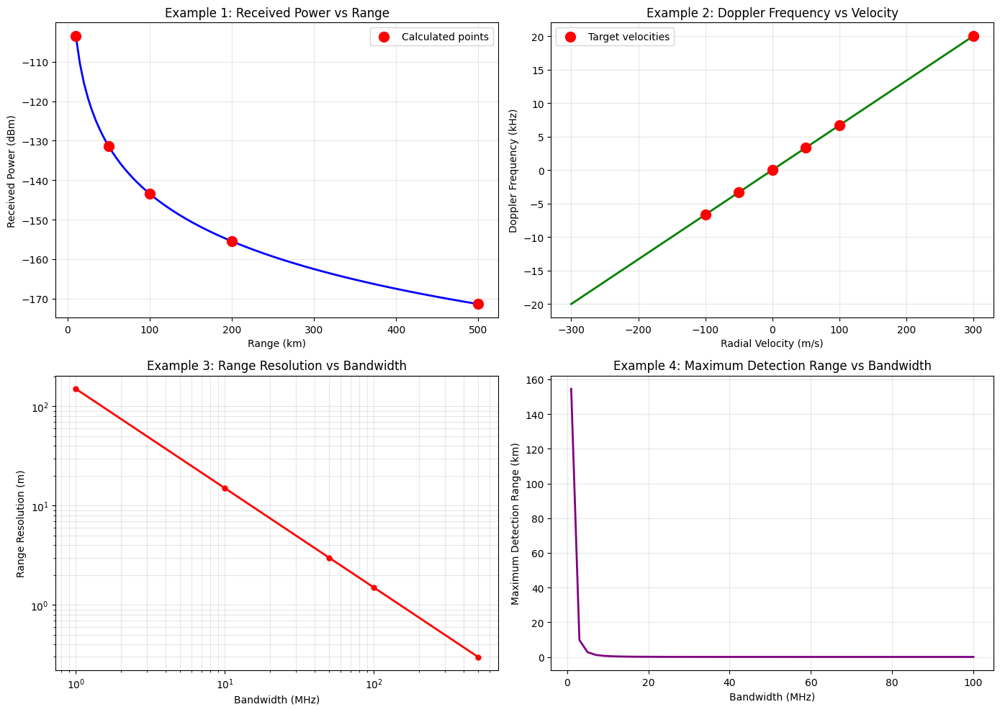


Fundamentals examples complete! Figures saved.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, constants

# Radar Constants and Helper Functions
c = constants.c  # Speed of light (m/s)
print("=" * 80)
print("RADAR FUNDAMENTALS - PYTHON EXAMPLES")
print("=" * 80)

# ============================================================================
# EXAMPLE 1: Radar Range Equation and Detection
# ============================================================================
print("\n1. RADAR RANGE EQUATION AND DETECTION")
print("-" * 80)

def radar_range_equation(Pt, Gt, Gr, wavelength, sigma, R, L=1):
    """
    Calculate received power using radar range equation.
    
    Parameters:
    - Pt: Transmitted power (W)
    - Gt: Transmit gain (linear)
    - Gr: Receive gain (linear)
    - wavelength: Wavelength (m)
    - sigma: RCS (m²)
    - R: Range (m)
    - L: System losses (linear)
    
    Returns: Pr (Received power in W)
    """
    numerator = Pt * Gt * Gr * wavelength**2 * sigma
    denominator = (4 * np.pi)**3 * R**4 * L
    Pr = numerator / denominator
    return Pr

# Radar parameters
Pt_dBW = 40  # Transmitted power in dBW
Pt = 10**(Pt_dBW / 10)  # Convert to watts
fc = 10e9  # 10 GHz carrier frequency
wavelength = c / fc
Gt = 20  # Transmit gain in dB (100x linear)
Gr = 20  # Receive gain in dB (100x linear)
Gt_lin = 10**(Gt/10)  # Convert to linear
Gr_lin = 10**(Gr/10)
sigma = 10  # RCS in m² (typical fighter jet)
L = 1  # Assume no losses

# Calculate received power at various ranges
ranges = np.array([10e3, 50e3, 100e3, 200e3, 500e3])  # 10-500 km
received_powers_W = []
received_powers_dBm = []

print(f"Transmitter: Pt = {Pt_dBW} dBW ({Pt:.2f} W)")
print(f"Frequency: {fc/1e9:.1f} GHz, Wavelength: {wavelength:.4f} m")
print(f"Antenna gains: Gt = {Gt} dB, Gr = {Gr} dB")
print(f"Target RCS: {sigma} m²\n")
print("Range Analysis:")
print(f"{'Range (km)':<15} {'Received Power (dBm)':<25} {'Received Power (W)':<25}")
print("-" * 65)

for R in ranges:
    Pr = radar_range_equation(Pt, Gt_lin, Gr_lin, wavelength, sigma, R, L)
    Pr_dBm = 10 * np.log10(Pr * 1000)  # Convert W to dBm
    received_powers_W.append(Pr)
    received_powers_dBm.append(Pr_dBm)
    print(f"{R/1e3:<15.0f} {Pr_dBm:<25.2f} {Pr:<25.2e}")

# ============================================================================
# EXAMPLE 2: Doppler Shift and Velocity Estimation
# ============================================================================
print("\n2. DOPPLER SHIFT AND VELOCITY ESTIMATION")
print("-" * 80)

def doppler_frequency(velocity, fc, c):
    """
    Calculate Doppler frequency shift.
    
    fd = 2 * v_radial * fc / c
    """
    return 2 * velocity * fc / c

def velocity_from_doppler(fd, fc, c):
    """
    Estimate velocity from Doppler frequency.
    """
    return fd * c / (2 * fc)

# Target velocities
target_velocities = np.array([-100, -50, 0, 50, 100, 300])  # m/s

print(f"Carrier frequency: {fc/1e9:.1f} GHz")
print(f"\n{'Velocity (m/s)':<20} {'Velocity (km/h)':<20} {'Doppler Freq (Hz)':<20} {'Doppler Freq (kHz)':<20}")
print("-" * 80)

for v in target_velocities:
    fd = doppler_frequency(v, fc, c)
    fd_kHz = fd / 1000
    v_kmh = v * 3.6
    print(f"{v:<20.1f} {v_kmh:<20.1f} {fd:<20.1f} {fd_kHz:<20.3f}")

# ============================================================================
# EXAMPLE 3: Range Resolution and Bandwidth
# ============================================================================
print("\n3. RANGE RESOLUTION AND BANDWIDTH")
print("-" * 80)

def range_resolution(bandwidth):
    """Range resolution = c / (2 * B)"""
    return c / (2 * bandwidth)

bandwidths = np.array([1e6, 10e6, 50e6, 100e6, 500e6])  # 1 MHz to 500 MHz
print(f"{'Bandwidth (MHz)':<20} {'Range Resolution (m)':<25}")
print("-" * 45)
for B in bandwidths:
    delta_R = range_resolution(B)
    print(f"{B/1e6:<20.1f} {delta_R:<25.2f}")

# ============================================================================
# EXAMPLE 4: Visualization - Range vs Received Power
# ============================================================================
print("\n4. VISUALIZATION")

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Received power vs range
ranges_continuous = np.linspace(10e3, 500e3, 100)
Pr_continuous = []
for R in ranges_continuous:
    Pr = radar_range_equation(Pt, Gt_lin, Gr_lin, wavelength, sigma, R, L)
    Pr_continuous.append(10 * np.log10(Pr * 1000))

axes[0, 0].plot(ranges_continuous/1e3, Pr_continuous, 'b-', linewidth=2)
axes[0, 0].scatter(ranges/1e3, received_powers_dBm, c='red', s=100, zorder=5, label='Calculated points')
axes[0, 0].set_xlabel('Range (km)')
axes[0, 0].set_ylabel('Received Power (dBm)')
axes[0, 0].set_title('Example 1: Received Power vs Range')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].legend()

# Plot 2: Doppler frequency vs velocity
velocities_continuous = np.linspace(-300, 300, 100)
doppler_continuous = doppler_frequency(velocities_continuous, fc, c)

axes[0, 1].plot(velocities_continuous, doppler_continuous/1000, 'g-', linewidth=2)
axes[0, 1].scatter(target_velocities, doppler_frequency(target_velocities, fc, c)/1000, 
                   c='red', s=100, zorder=5, label='Target velocities')
axes[0, 1].set_xlabel('Radial Velocity (m/s)')
axes[0, 1].set_ylabel('Doppler Frequency (kHz)')
axes[0, 1].set_title('Example 2: Doppler Frequency vs Velocity')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].legend()

# Plot 3: Range resolution vs bandwidth
axes[1, 0].loglog(bandwidths/1e6, [range_resolution(B) for B in bandwidths], 'r.-', linewidth=2, markersize=10)
axes[1, 0].set_xlabel('Bandwidth (MHz)')
axes[1, 0].set_ylabel('Range Resolution (m)')
axes[1, 0].set_title('Example 3: Range Resolution vs Bandwidth')
axes[1, 0].grid(True, alpha=0.3, which='both')

# Plot 4: Radar range performance
SNR_threshold_dB = -10  # Minimum SNR for detection
noise_figure_dB = 3
receiver_noise_dB = -174 + 10*np.log10(1e6) + noise_figure_dB  # dBm/MHz

max_ranges = []
bandwidths_plot = np.linspace(1e6, 100e6, 50)
for B in bandwidths_plot:
    # Noise power
    P_noise = 10**(receiver_noise_dB / 10 + 10*np.log10(B/1e6))
    P_noise_mW = P_noise / 1000
    SNR_threshold = 10**(SNR_threshold_dB / 10)
    P_min_signal = P_noise_mW * SNR_threshold / 1000
    
    # Solve range from radar equation
    max_range = (Pt * Gt_lin * Gr_lin * wavelength**2 * sigma / 
                 (P_min_signal * (4*np.pi)**3 * L))**(1/4)
    max_ranges.append(max_range / 1000)  # Convert to km

axes[1, 1].plot(bandwidths_plot/1e6, max_ranges, 'purple', linewidth=2)
axes[1, 1].set_xlabel('Bandwidth (MHz)')
axes[1, 1].set_ylabel('Maximum Detection Range (km)')
axes[1, 1].set_title('Example 4: Maximum Detection Range vs Bandwidth')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('radar_fundamentals.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nFundamentals examples complete! Figures saved.")

## Radar in Agriculture

Radar technology has some fascinating applications in agriculture. Here are a few ways radar is being used to enhance farming practices:
1. Crop Monitoring: Radar sensors can monitor crop growth and health by measuring the height and density of plants. This helps farmers make informed decisions about irrigation, fertilization, and pest control.
2. Soil Moisture Measurement: Radar can be used to measure soil moisture levels, which is crucial for efficient irrigation management. By knowing the exact moisture content, farmers can optimize water usage and improve crop yields.
3. Weather Monitoring: Radar is used to monitor weather conditions, such as rainfall and storms, which can impact agricultural activities. Accurate weather data helps farmers plan their fieldwork and protect crops from adverse weather.
4. Ground Clearance Monitoring: Radar sensors are used in agricultural machinery to monitor ground clearance and ensure optimal operation. This helps in preventing damage to crops and machinery.
5. Collision Avoidance: Radar technology is used in autonomous agricultural machinery to detect obstacles and avoid collisions. This enhances the safety and efficiency of farming operations.
6. Sprayer Boom Height Control: Radar sensors help in maintaining the optimal height of sprayer booms, ensuring even distribution of fertilizers and pesticides. This leads to better crop protection and reduced chemical usage.

These applications demonstrate how radar technology can significantly improve the efficiency and productivity of agricultural practices.

---

## 1.2 Radar Signal Processing Fundamentals - Theory

### 1.2.1 Pulse Compression

Pulse compression is one of the cornerstone techniques in modern radar systems. It allows radars to transmit long pulses (for high energy and detection range) while still achieving the fine range resolution normally associated with short pulses.

#### Motivation
- Long pulses → More transmitted energy → Better detection of weak targets.
- Short pulses → Better range resolution → Ability to distinguish closely spaced targets.
- Problem: You can’t have both simultaneously if you only vary pulse length.
- Solution: Pulse compression combines the energy advantage of long pulses with the resolution of short pulses.

#### Principle of Operation
Pulse compression works by modulating the transmitted pulse (in frequency or phase) and then applying a matched filter at the receiver to compress the energy in time.
- Transmit: A long pulse with modulation (e.g., chirp or phase coding).
- Receive: Apply a matched filter (correlator) that compresses the pulse into a narrow peak.
- Result: High energy + fine resolution.

#### Key Techniques
1. 	Linear Frequency Modulation (Chirp):
- Pulse frequency sweeps linearly across bandwidth $B$.
- After matched filtering, effective resolution is determined by $1/B$
.
- Widely used in radar and sonar.
2. 	Phase Coding:
- Pulse divided into sub-pulses with different phase shifts (e.g., Barker codes).
- Matched filter correlates with the code sequence.
- Provides good sidelobe suppression.

#### Mathematical Insight
- Range Resolution:
$\Delta R=\frac{c}{2B}$

- where $c$ is the speed of light, $B$ is the signal bandwidth.
- Compression Ratio (Processing Gain):
$G=\frac{T\cdot B}{1}$

- where $T$ is pulse duration.
- Large $T$ → more energy.
- Large $B$ → finer resolution.
- Their product defines how much compression is achieved.

#### Benefits
- High detection range (due to long pulse energy).
- Fine range resolution (due to large bandwidth).
- Better SNR after matched filtering.

#### Practical Considerations
- Sidelobes: Can mask weak targets near strong ones.
- Windowing & coding techniques are used to suppress sidelobes.
- Hardware limits: Bandwidth and phase stability constrain achievable compression.

**Matched Filter**:
- Maximizes SNR for a known signal
- Impulse response: $h(t) = s^*(T - t)$
- Output: $y(t) = \int_{-\infty}^{\infty} r(\tau) s^*(\tau - t) d\tau$

**Linear Frequency Modulation (LFM) Chirp**:
- Transmitted signal: $s(t) = A \cos(2\pi f_c t + \pi \frac{B}{T} t^2)$
- Bandwidth $B$ over duration $T$
- Pulse compression ratio: $\rho = B \times T$
- Compressed pulse width: $\tau_c = \frac{1}{B}$



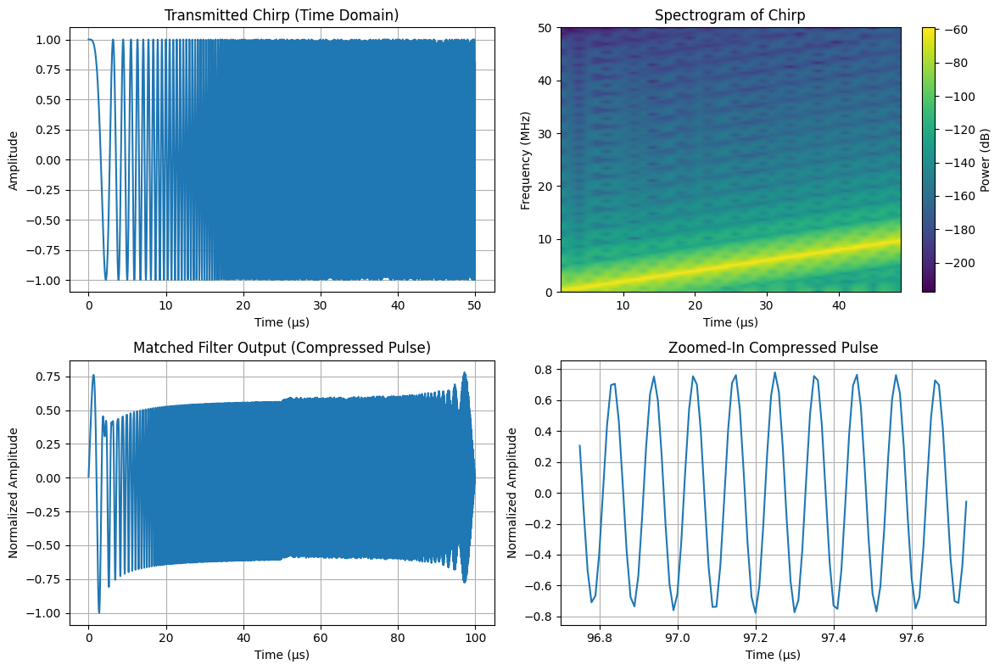

Theoretical range resolution: 15.00 meters


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import chirp, spectrogram, correlate

'''
1. 	Generates a chirp pulse (50 µs, 10 MHz bandwidth).
2. 	Plots the waveform in time domain.
3. 	Shows the spectrogram to visualize frequency sweep.
4. 	Applies matched filtering (correlation with time-reversed chirp).
5. 	Plots the compressed pulse and zooms in around the peak.
6. 	Prints theoretical range resolution (≈ 15 m for 10 MHz bandwidth).
'''
# -----------------------------
# Parameters
# -----------------------------
T = 50e-6            # Pulse duration (50 microseconds)
B = 10e6             # Bandwidth (10 MHz)
fs = 100e6           # Sampling frequency (100 MHz)
N = int(T * fs)      # Number of samples
t = np.arange(N) / fs

# -----------------------------
# Generate transmitted chirp
# -----------------------------
tx_chirp = chirp(t, f0=0, f1=B, t1=T, method='linear')

# -----------------------------
# Linear Frequency Modulation (LFM) Chirp
# -----------------------------
f0 = 0               # Start frequency
k = B / T            # Chirp rate (Hz/s)

# Explicit LFM definition
tx_chirp = np.cos(2 * np.pi * (f0 * t + 0.5 * k * t**2))

# -----------------------------
# Plot transmitted chirp
# -----------------------------
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.plot(t * 1e6, tx_chirp)
plt.title("Transmitted Chirp (Time Domain)")
plt.xlabel("Time (µs)")
plt.ylabel("Amplitude")
plt.grid(True)

# -----------------------------
# Spectrogram of chirp
# -----------------------------
f, tt, Sxx = spectrogram(tx_chirp, fs=fs, nperseg=256, noverlap=128)
plt.subplot(2, 2, 2)
plt.pcolormesh(tt * 1e6, f / 1e6, 10 * np.log10(Sxx), shading='gouraud')
plt.title("Spectrogram of Chirp")
plt.xlabel("Time (µs)")
plt.ylabel("Frequency (MHz)")
plt.colorbar(label="Power (dB)")

# -----------------------------
# Matched filtering (correlation)
# -----------------------------
matched_filter = tx_chirp[::-1]  # time-reversed conjugate
compressed = correlate(tx_chirp, matched_filter, mode='full')
compressed_time = np.arange(len(compressed)) / fs

# Normalize
compressed = compressed / np.max(np.abs(compressed))

# -----------------------------
# Plot compressed pulse
# -----------------------------
plt.subplot(2, 2, 3)
plt.plot(compressed_time * 1e6, compressed)
plt.title("Matched Filter Output (Compressed Pulse)")
plt.xlabel("Time (µs)")
plt.ylabel("Normalized Amplitude")
plt.grid(True)

# -----------------------------
# Zoomed-in view of compressed pulse
# -----------------------------
zoom_window = int(0.5e-6 * fs)  # 0.5 µs window around peak
peak_index = np.argmax(compressed)
zoom_range = slice(peak_index - zoom_window, peak_index + zoom_window)

plt.subplot(2, 2, 4)
plt.plot(compressed_time[zoom_range] * 1e6, compressed[zoom_range])
plt.title("Zoomed-In Compressed Pulse")
plt.xlabel("Time (µs)")
plt.ylabel("Normalized Amplitude")
plt.grid(True)

plt.tight_layout()
plt.show()

# -----------------------------
# Print theoretical resolution
# -----------------------------
c = 3e8  # speed of light
range_resolution = c / (2 * B)
print(f"Theoretical range resolution: {range_resolution:.2f} meters")

### 1.2.2 Doppler Processing

Doppler processing is the second major pillar of radar signal analysis (after pulse compression). While pulse compression improves range resolution, Doppler processing extracts velocity information from moving targets by exploiting the Doppler effect.

#### Motivation
- Range measurement comes from time delay of echoes.
- Velocity measurement comes from frequency shift due to target motion.
- Together, they allow radars to build a range–Doppler map that shows where targets are and how fast they move.

#### Principle of Operation
- A moving target causes a Doppler frequency shift in the returned signal:
$f_D=\frac{2v}{\lambda }$ 

- where $v$ is radial velocity, $\lambda$ is radar wavelength.
- By transmitting a pulse train (multiple pulses over time), the radar can measure phase changes between successive pulses.
- Applying a Fourier transform across pulses reveals Doppler frequencies → target velocities.

#### Processing Steps
1. 	Pulse Compression (per pulse): Achieve fine range resolution.
2. 	Collect multiple pulses (CPI – coherent processing interval): Build a sequence of echoes for each range bin.
3. 	Doppler FFT: Apply Fourier transform across pulses to extract Doppler frequencies.
4. 	Range–Doppler Map: 2D representation of target range vs. velocity.

#### Mathematical Insight
- Phase progression across pulses:
$\phi _n=2\pi f_DnT_r$ 

- where $T_r$ is pulse repetition interval (PRI).
- Velocity resolution:
$\Delta v=\frac{\lambda }{2NT_r}$

- where $N$ is number of pulses in CPI.
- Maximum unambiguous velocity:
$v_{max}=\frac{\lambda }{4T_r}$

#### Benefits
- Distinguishes moving targets from clutter (stationary returns).
- Provides velocity measurement in addition to range.
- Enables MTI (Moving Target Indication) and tracking radars.

#### Practical Considerations
- Ambiguity: High velocities may alias into wrong Doppler bins.
- Clutter suppression: Stationary clutter must be filtered out.
- Coherence: Requires stable oscillator and phase coherence across pulses.

**Coherent Integration**:
- Process $N$ pulses coherently to improve SNR
- Processing gain: $G = 10 \log_{10}(N)$ dB
- Doppler filter resolution: $\Delta f = \frac{1}{N \times T_{cpi}}$
- where $T_{cpi}$ = coherent processing interval

**Range-Doppler Processing**:
- 2D FFT: Range compression → Doppler processing
- Creates range-Doppler map for simultaneous range and velocity estimation



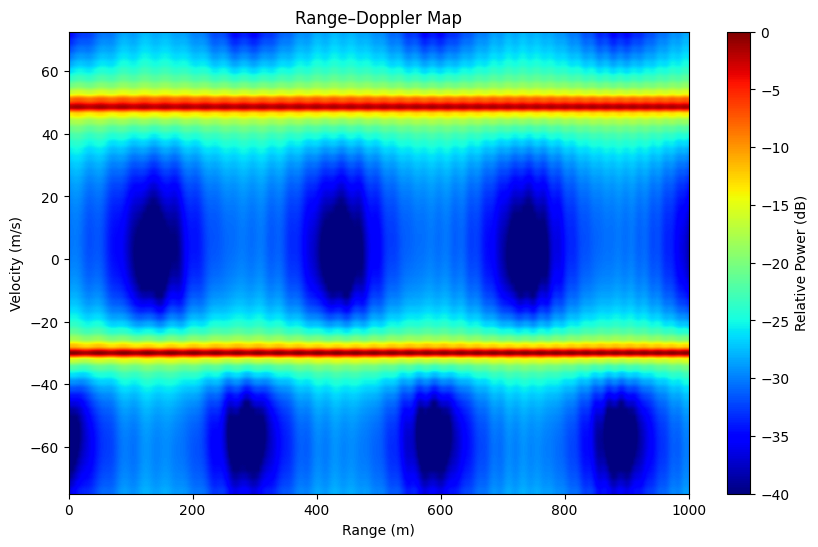

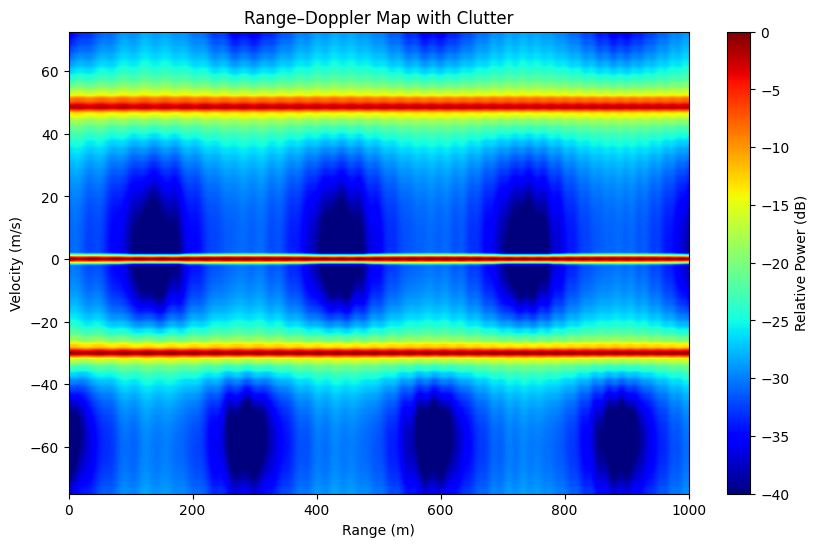

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate

# Radar parameters
c = 3e8
fc = 10e9
lambda_c = c / fc
T = 20e-6
B = 20e6
fs = 100e6
PRI = 100e-6
N_pulses = 64

N = int(T * fs)
t = np.arange(N) / fs
k = B / T

'''
Expected Output
- Two bright spots:
- At ~300 m, +50 m/s
- At ~450 m, -30 m/s
- Background suppressed to -40 dB.
- Range axis zoomed to 0-1000 m so you see the targets clearly.
'''
# Targets: closer ranges so they fit inside pulse
targets = [
    {"range": 300, "velocity": 50},   # 300 m, +50 m/s
    {"range": 450, "velocity": -30},  # 450 m, -30 m/s
]

# Generate received data
rx_data = np.zeros((N_pulses, N), dtype=complex)
tx_chirp = np.exp(1j * 2 * np.pi * (0 * t + 0.5 * k * t**2))

for p in range(N_pulses):
    pulse_echo = np.zeros(N, dtype=complex)
    for tgt in targets:
        tau = 2 * tgt["range"] / c
        delay_samples = int(tau * fs)
        if delay_samples < N:
            fd = 2 * tgt["velocity"] / lambda_c
            phase_shift = np.exp(1j * 2 * np.pi * fd * p * PRI)
            echo = np.zeros(N, dtype=complex)
            echo[delay_samples:] = tx_chirp[:N - delay_samples]
            pulse_echo += phase_shift * echo
    rx_data[p, :] = pulse_echo

# Matched filtering
matched_filter = np.conj(tx_chirp[::-1])
range_compressed = np.array([np.correlate(rx_data[p, :], matched_filter, mode='same')
                             for p in range(N_pulses)])

# Doppler FFT
doppler_processed = np.fft.fftshift(np.fft.fft(range_compressed, axis=0), axes=0)

# Range–Doppler map
ranges = np.arange(N) * c / (2 * fs)
velocities = np.fft.fftshift(np.fft.fftfreq(N_pulses, d=PRI)) * lambda_c / 2

rd_map = 20 * np.log10(np.abs(doppler_processed) + 1e-12)
rd_map -= np.max(rd_map)
rd_map = np.clip(rd_map, -40, 0)

plt.figure(figsize=(10, 6))
plt.imshow(rd_map,
           extent=[ranges[0], ranges[-1], velocities[0], velocities[-1]],
           aspect='auto', cmap='jet', origin='lower')
plt.colorbar(label="Relative Power (dB)")
plt.title("Range-Doppler Map")
plt.xlabel("Range (m)")
plt.ylabel("Velocity (m/s)")
plt.xlim(0, 1000)   # zoom to 0–1000 m
plt.show()


'''
Expected Output
- Bright clutter line at ~400 m, 0 m/s (stationary).
- Moving targets at ~300 m (+50 m/s) and ~450 m (-30 m/s).
- Doppler processing clearly separates moving targets from clutter, even though they overlap in range.
'''
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate

# Radar parameters
c = 3e8
fc = 10e9
lambda_c = c / fc
T = 20e-6
B = 20e6
fs = 100e6
PRI = 100e-6
N_pulses = 64

N = int(T * fs)
t = np.arange(N) / fs
k = B / T

# Targets: moving + clutter
targets = [
    {"range": 300, "velocity": 50},    # 300 m, +50 m/s
    {"range": 450, "velocity": -30},   # 450 m, -30 m/s
    {"range": 400, "velocity": 0},     # 400 m, stationary clutter
]

# Generate received data
rx_data = np.zeros((N_pulses, N), dtype=complex)
tx_chirp = np.exp(1j * 2 * np.pi * (0 * t + 0.5 * k * t**2))

for p in range(N_pulses):
    pulse_echo = np.zeros(N, dtype=complex)
    for tgt in targets:
        tau = 2 * tgt["range"] / c
        delay_samples = int(tau * fs)
        if delay_samples < N:
            fd = 2 * tgt["velocity"] / lambda_c
            phase_shift = np.exp(1j * 2 * np.pi * fd * p * PRI)
            echo = np.zeros(N, dtype=complex)
            echo[delay_samples:] = tx_chirp[:N - delay_samples]
            pulse_echo += phase_shift * echo
    rx_data[p, :] = pulse_echo

# Matched filtering
matched_filter = np.conj(tx_chirp[::-1])
range_compressed = np.array([np.correlate(rx_data[p, :], matched_filter, mode='same')
                             for p in range(N_pulses)])

# Doppler FFT
doppler_processed = np.fft.fftshift(np.fft.fft(range_compressed, axis=0), axes=0)

# Range–Doppler map
ranges = np.arange(N) * c / (2 * fs)
velocities = np.fft.fftshift(np.fft.fftfreq(N_pulses, d=PRI)) * lambda_c / 2

rd_map = 20 * np.log10(np.abs(doppler_processed) + 1e-12)
rd_map -= np.max(rd_map)
rd_map = np.clip(rd_map, -40, 0)

plt.figure(figsize=(10, 6))
plt.imshow(rd_map,
           extent=[ranges[0], ranges[-1], velocities[0], velocities[-1]],
           aspect='auto', cmap='jet', origin='lower')
plt.colorbar(label="Relative Power (dB)")
plt.title("Range-Doppler Map with Clutter")
plt.xlabel("Range (m)")
plt.ylabel("Velocity (m/s)")
plt.xlim(0, 1000)   # zoom to 0–1000 m
plt.show()

### 1.2.3 Clutter Suppression

#### Why Clutter Suppression Matters
- Stationary clutter is often much stronger than target echoes.
- Without suppression, moving targets near clutter may be invisible.
- Essential for air surveillance, weather radar, maritime radar, and any system operating in cluttered environments.

#### Principle of Operation
Clutter suppression exploits the fact that:
- Stationary objects → Doppler frequency ≈ 0 Hz.
- Moving objects → Doppler frequency ≠ 0 Hz.
By filtering out the zero-Doppler band, radar can suppress clutter while retaining moving targets.

#### Techniques
1. 	MTI (Moving Target Indicator) Filters
- Subtract consecutive pulses (2-pulse canceller).
- Stationary echoes cancel out; moving targets remain.
- Equivalent to a high-pass filter in Doppler domain.
- Limitation: blind speeds (certain velocities also cancel).
2. 	Pulse-Doppler Processing
- Perform FFT across pulses.
- Explicitly filter out the low-frequency Doppler bins (near 0 Hz).
- Provides range–Doppler map with clutter suppressed.
3. 	Adaptive Filtering (STAP – Space-Time Adaptive Processing)
- Uses antenna array + Doppler filtering.
- Learns clutter characteristics and adaptively cancels them.
- Very effective in airborne radars.
4. 	Clutter Maps
- Build a statistical model of clutter in each range bin.
- Subtract or threshold against expected clutter power.

#### Mathematical Insight
- 2-pulse canceller transfer function:
$H(z)=1-z^{-1}$
- Cancels DC (stationary clutter).
- Acts as a notch filter at 0 Doppler frequency.
- Blind speeds:
$v_b=\frac{n\lambda }{2T_r},\quad n=1,2,3,...$
- Certain velocities produce Doppler shifts that also cancel out.
→ Solution: use staggered PRIs or higher-order cancellers.

#### Benefits
- Strong suppression of stationary clutter.
- Moving targets become visible even near strong clutter.
- Improves detection probability in real-world environments.

#### Practical Considerations
- Blind speeds must be managed.
- Non-stationary clutter (e.g., sea waves, foliage) produces low but nonzero Doppler → harder to suppress.
- Adaptive methods are needed in complex environments.

**Moving Target Indication (MTI)**:
- Filters clutter (stationary/slow-moving objects)
- Cancellation ratio: $\eta = 20 \log_{10}(I_c / I_t)$ dB
- Transfer function (simple 2-pulse canceler): $H(z) = 1 - z^{-1}$

**Adaptive Processing**:
- Uses reference cells to estimate clutter statistics
- LMS (Least Mean Squares) algorithm: $w(n+1) = w(n) + \mu e(n) x(n)$
- MVDR (Minimum Variance Distortionless Response)

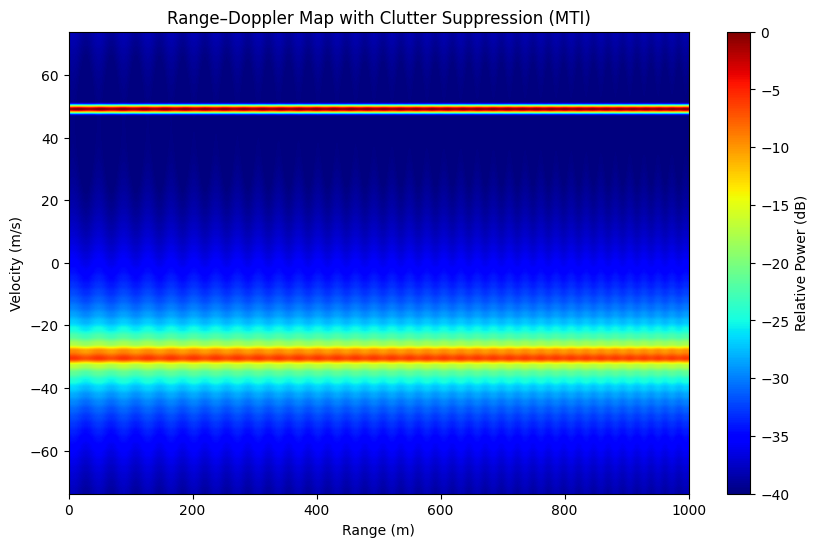

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate

# Radar parameters
c = 3e8
fc = 10e9
lambda_c = c / fc
T = 20e-6
B = 20e6
fs = 100e6
PRI = 100e-6
N_pulses = 64

N = int(T * fs)
t = np.arange(N) / fs
k = B / T

# Targets: moving + clutter
targets = [
    {"range": 300, "velocity": 50},    # 300 m, +50 m/s
    {"range": 450, "velocity": -30},   # 450 m, -30 m/s
    {"range": 400, "velocity": 0},     # 400 m, stationary clutter
]

'''
Expected Output
- The stationary clutter at 400m, 0m/s is suppressed.
- Only the moving targets at 300m (+50m/s) and 450m (-30m/s) remain visible.
- The Range-Doppler map is much cleaner, showing how MTI filtering enhances moving target detection.
'''
# Generate received data
rx_data = np.zeros((N_pulses, N), dtype=complex)
tx_chirp = np.exp(1j * 2 * np.pi * (0 * t + 0.5 * k * t**2))

for p in range(N_pulses):
    pulse_echo = np.zeros(N, dtype=complex)
    for tgt in targets:
        tau = 2 * tgt["range"] / c
        delay_samples = int(tau * fs)
        if delay_samples < N:
            fd = 2 * tgt["velocity"] / lambda_c
            phase_shift = np.exp(1j * 2 * np.pi * fd * p * PRI)
            echo = np.zeros(N, dtype=complex)
            echo[delay_samples:] = tx_chirp[:N - delay_samples]
            pulse_echo += phase_shift * echo
    rx_data[p, :] = pulse_echo

# Matched filtering
matched_filter = np.conj(tx_chirp[::-1])
range_compressed = np.array([np.correlate(rx_data[p, :], matched_filter, mode='same')
                             for p in range(N_pulses)])

# -----------------------------
# MTI clutter suppression: subtract consecutive pulses
# -----------------------------
mti_filtered = range_compressed[1:, :] - range_compressed[:-1, :]

# Doppler FFT
doppler_processed = np.fft.fftshift(np.fft.fft(mti_filtered, axis=0), axes=0)

# Range–Doppler map
ranges = np.arange(N) * c / (2 * fs)
velocities = np.fft.fftshift(np.fft.fftfreq(mti_filtered.shape[0], d=PRI)) * lambda_c / 2

rd_map = 20 * np.log10(np.abs(doppler_processed) + 1e-12)
rd_map -= np.max(rd_map)
rd_map = np.clip(rd_map, -40, 0)

plt.figure(figsize=(10, 6))
plt.imshow(rd_map,
           extent=[ranges[0], ranges[-1], velocities[0], velocities[-1]],
           aspect='auto', cmap='jet', origin='lower')
plt.colorbar(label="Relative Power (dB)")
plt.title("Range–Doppler Map with Clutter Suppression (MTI)")
plt.xlabel("Range (m)")
plt.ylabel("Velocity (m/s)")
plt.xlim(0, 1000)   # zoom to 0–1000 m
plt.show()


RADAR SIGNAL PROCESSING - PYTHON EXAMPLES

1. LFM CHIRP AND PULSE COMPRESSION (MATCHED FILTERING)
--------------------------------------------------------------------------------
Chirp parameters:
  Duration: 10.0 μs
  Bandwidth: 100.0 MHz
  Sampling rate: 50.0 MHz
  Samples: 500
  Compression ratio: 1000:1
  Range resolution: 1.50 m

Matched filter output:
  Peak 1 at ~498m
  Peak 2 at ~999m


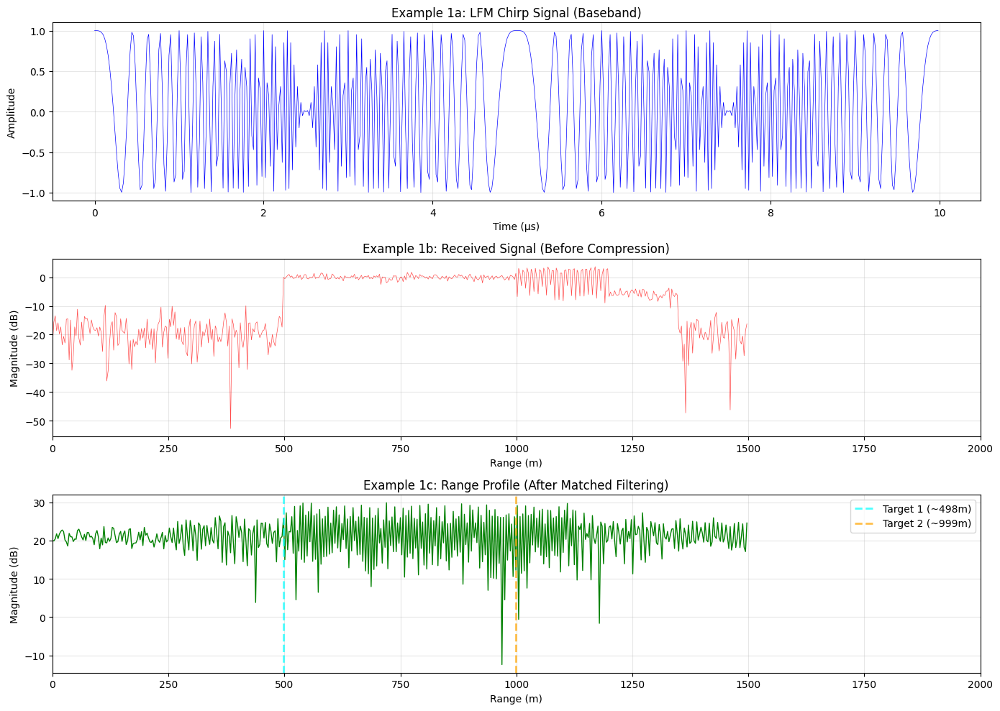


2. COHERENT DOPPLER PROCESSING
--------------------------------------------------------------------------------
Doppler processing parameters:
  PRF: 5000 Hz
  Number of pulses: 32
  CPI (coherent integration time): 6.40 ms
  Doppler resolution: 156.25 Hz
  Processing gain: 15.05 dB

Target velocity: 100 m/s
Doppler frequency: 6666.7 Hz (6.667 kHz)

Doppler processing result:
  Detected Doppler frequency: 1718.8 Hz
  True Doppler frequency: 6666.7 Hz
  Error: 4947.9 Hz


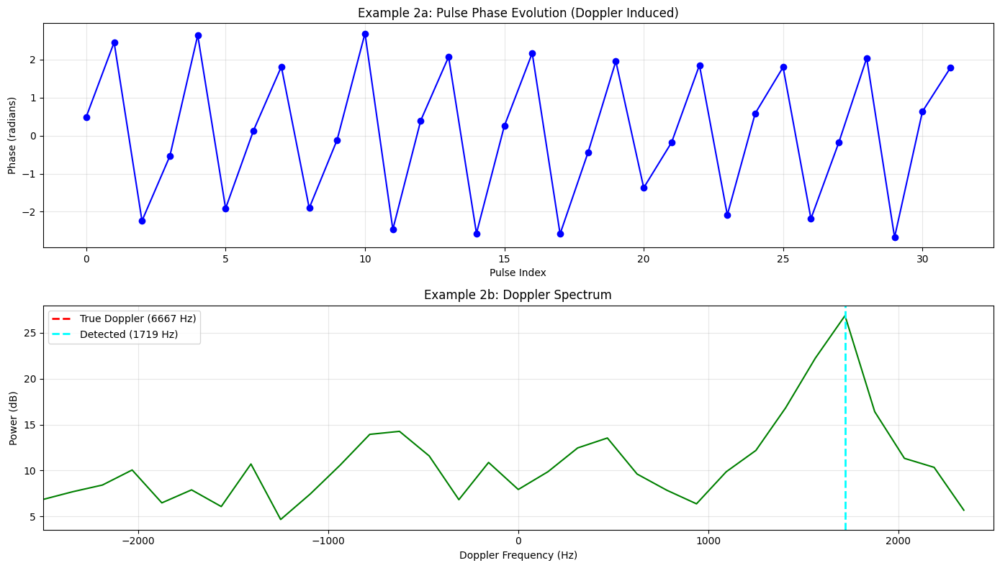


Signal processing examples complete!


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, fft

print("\n" + "=" * 80)
print("RADAR SIGNAL PROCESSING - PYTHON EXAMPLES")
print("=" * 80)

# ============================================================================
# EXAMPLE 1: LFM CHIRP AND MATCHED FILTERING
# ============================================================================
print("\n1. LFM CHIRP AND PULSE COMPRESSION (MATCHED FILTERING)")
print("-" * 80)

# Parameters
fs = 50e6  # Sampling frequency (50 MHz)
fc = 10e9  # Carrier frequency (10 GHz)
c = 3e8    # Speed of light
T_chirp = 10e-6  # Chirp duration (10 μs)
B = 100e6  # Bandwidth (100 MHz)
N_samples = int(fs * T_chirp)

print(f"Chirp parameters:")
print(f"  Duration: {T_chirp*1e6:.1f} μs")
print(f"  Bandwidth: {B/1e6:.1f} MHz")
print(f"  Sampling rate: {fs/1e6:.1f} MHz")
print(f"  Samples: {N_samples}")
print(f"  Compression ratio: {B * T_chirp:.0f}:1")
print(f"  Range resolution: {c / (2*B):.2f} m")

# Generate LFM chirp (baseband)
t = np.arange(N_samples) / fs
k = B / T_chirp  # Chirp rate
phase = 2 * np.pi * (k/2 * t**2)  # Quadratic phase (baseband)
chirp_baseband = np.cos(phase) + 1j * np.sin(phase)

# Generate received signal (simulated targets)
received = np.zeros(N_samples, dtype=complex)

# Target 1: Range = 500m, RCS = 1.0
delay1 = 2 * 500 / c
idx1 = int(delay1 * fs)
if idx1 < N_samples:
    received[idx1:idx1+N_samples-idx1-100] += 1.0 * chirp_baseband[:N_samples-idx1-100]

# Target 2: Range = 1000m, RCS = 0.5
delay2 = 2 * 1000 / c
idx2 = int(delay2 * fs)
if idx2 < N_samples:
    received[idx2:idx2+N_samples-idx2-50] += 0.5 * chirp_baseband[:N_samples-idx2-50]

# Add noise
SNR_dB = 15
noise_power = np.mean(np.abs(received)**2) / (10**(SNR_dB/10))
noise = np.sqrt(noise_power/2) * (np.random.randn(N_samples) + 1j * np.random.randn(N_samples))
received_noisy = received + noise

# Matched filter
matched_filter = np.conj(chirp_baseband[::-1])
compressed = np.correlate(received_noisy, matched_filter, mode='same')

# Convert to range
ranges = np.arange(N_samples) * c / (2 * fs)

print(f"\nMatched filter output:")
print(f"  Peak 1 at ~{ranges[idx1]:.0f}m")
print(f"  Peak 2 at ~{ranges[idx2]:.0f}m")

# Plot
fig, axes = plt.subplots(3, 1, figsize=(14, 10))

# Plot 1: Chirp signal
axes[0].plot(t*1e6, np.real(chirp_baseband), 'b-', linewidth=0.5)
axes[0].set_xlabel('Time (μs)')
axes[0].set_ylabel('Amplitude')
axes[0].set_title('Example 1a: LFM Chirp Signal (Baseband)')
axes[0].grid(True, alpha=0.3)

# Plot 2: Received signal (before compression)
axes[1].plot(ranges, 20*np.log10(np.abs(received_noisy)+1e-6), 'r-', linewidth=0.5, alpha=0.7)
axes[1].set_xlabel('Range (m)')
axes[1].set_ylabel('Magnitude (dB)')
axes[1].set_title('Example 1b: Received Signal (Before Compression)')
axes[1].grid(True, alpha=0.3)
axes[1].set_xlim([0, 2000])

# Plot 3: Compressed signal (after matched filtering)
axes[2].plot(ranges, 20*np.log10(np.abs(compressed)+1e-6), 'g-', linewidth=1)
axes[2].axvline(ranges[idx1], color='cyan', linestyle='--', linewidth=2, alpha=0.7, label=f'Target 1 (~{ranges[idx1]:.0f}m)')
axes[2].axvline(ranges[idx2], color='orange', linestyle='--', linewidth=2, alpha=0.7, label=f'Target 2 (~{ranges[idx2]:.0f}m)')
axes[2].set_xlabel('Range (m)')
axes[2].set_ylabel('Magnitude (dB)')
axes[2].set_title('Example 1c: Range Profile (After Matched Filtering)')
axes[2].grid(True, alpha=0.3)
axes[2].set_xlim([0, 2000])
axes[2].legend()

plt.tight_layout()
plt.savefig('signal_processing_1.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# EXAMPLE 2: COHERENT DOPPLER PROCESSING
# ============================================================================
print("\n2. COHERENT DOPPLER PROCESSING")
print("-" * 80)

# Parameters
PRF = 5000  # Pulse repetition frequency (Hz)
num_pulses = 32  # Number of coherent pulses
T_cpi = num_pulses / PRF  # Coherent processing interval

print(f"Doppler processing parameters:")
print(f"  PRF: {PRF} Hz")
print(f"  Number of pulses: {num_pulses}")
print(f"  CPI (coherent integration time): {T_cpi*1e3:.2f} ms")
print(f"  Doppler resolution: {1/T_cpi:.2f} Hz")
print(f"  Processing gain: {10*np.log10(num_pulses):.2f} dB")

# Generate pulse train with Doppler
fc_doppler = 10e9
c = 3e8
target_velocity = 100  # m/s
doppler_freq = 2 * target_velocity * fc_doppler / c

print(f"\nTarget velocity: {target_velocity} m/s")
print(f"Doppler frequency: {doppler_freq:.1f} Hz ({doppler_freq/1000:.3f} kHz)")

pulse_train = []
for pulse_idx in range(num_pulses):
    # Phase rotation due to Doppler
    phase_doppler = 2 * np.pi * doppler_freq * pulse_idx / PRF
    pulse = np.exp(1j * phase_doppler)
    pulse_train.append(pulse)

pulse_train = np.array(pulse_train)

# Add noise
SNR_dB = 5
signal_power = 1.0
noise_power = signal_power / (10**(SNR_dB/10))
noise = np.sqrt(noise_power/2) * (np.random.randn(num_pulses) + 1j * np.random.randn(num_pulses))
received_pulse_train = pulse_train + noise

# Doppler FFT
doppler_fft = np.fft.fft(received_pulse_train)
doppler_fft = np.fft.fftshift(doppler_fft)
doppler_frequencies = np.fft.fftfreq(num_pulses, 1/PRF)
doppler_frequencies = np.fft.fftshift(doppler_frequencies)

print(f"\nDoppler processing result:")
peak_idx = np.argmax(np.abs(doppler_fft))
peak_freq = doppler_frequencies[peak_idx]
print(f"  Detected Doppler frequency: {peak_freq:.1f} Hz")
print(f"  True Doppler frequency: {doppler_freq:.1f} Hz")
print(f"  Error: {abs(peak_freq - doppler_freq):.1f} Hz")

# Plot
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# Plot 1: Pulse phase evolution
axes[0].plot(np.arange(num_pulses), np.angle(received_pulse_train), 'bo-', linewidth=1.5, markersize=6)
axes[0].set_xlabel('Pulse Index')
axes[0].set_ylabel('Phase (radians)')
axes[0].set_title('Example 2a: Pulse Phase Evolution (Doppler Induced)')
axes[0].grid(True, alpha=0.3)

# Plot 2: Doppler spectrum
axes[1].plot(doppler_frequencies, 10*np.log10(np.abs(doppler_fft)**2+1e-6), 'g-', linewidth=1.5)
axes[1].axvline(doppler_freq, color='red', linestyle='--', linewidth=2, label=f'True Doppler ({doppler_freq:.0f} Hz)')
axes[1].axvline(peak_freq, color='cyan', linestyle='--', linewidth=2, label=f'Detected ({peak_freq:.0f} Hz)')
axes[1].set_xlabel('Doppler Frequency (Hz)')
axes[1].set_ylabel('Power (dB)')
axes[1].set_title('Example 2b: Doppler Spectrum')
axes[1].grid(True, alpha=0.3)
axes[1].legend()
axes[1].set_xlim([-PRF/2, PRF/2])

plt.tight_layout()
plt.savefig('signal_processing_2.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nSignal processing examples complete!")

## Radar in Medical
Radar technology has some exciting applications in the medical field. Here are a few notable examples:
1. Vital Signs Monitoring: Radar sensors, especially mmWave sensors, can monitor vital signs like heart rate and breathing rate without physical contact. This non-intrusive method is particularly useful for continuous monitoring of patients, especially the elderly.
2. Fall Detection: Radar technology can accurately detect falls, which is crucial for elderly care. It can differentiate between normal activities and falls, providing timely alerts to caregivers.
3. Medical Imaging: Ultra-Wideband (UWB) radar is used in medical imaging to create detailed images of internal organs. It is particularly useful in cardiology, pneumology, and obstetrics for non-invasive imaging.
4. Patient Monitoring: Biomedical radar can monitor patient movements and activities, providing valuable data for healthcare providers. This technology is beneficial in hospitals and home care settings.
5. Sleep Monitoring: Radar sensors can monitor sleep patterns and detect sleep disorders. This application is valuable for diagnosing and treating conditions like sleep apnea.

These applications demonstrate how radar technology can enhance patient care and improve medical diagnostics.

## Radar Freq Application
Radar systems operate across different frequency bands, each with unique properties that influence their performance, range, and resolution. Here's a brief overview of some common radar frequency bands and their applications:

1. HF (3-30 MHz): Used in coastal radar systems and over-the-horizon (OTH) radar for very long-range detection.
2. VHF (30-300 MHz): Applied retrospectively to early radar systems.
3. UHF (300-1000 MHz): Utilized in ground-penetrating radar and very long-range radar systems.
4. L Band (1-2 GHz): Employed in long-range air traffic control and surveillance.
5. S Band (2-4 GHz): Used in terminal air traffic control, long-range weather, and marine radar.
6. C Band (4-8 GHz): Commonly used in satellite transponders and weather radar.
7. X Band (8-12 GHz): Utilized in missile guidance, marine and weather radar, and ground surveillance.
8. Ku Band (12-18 GHz): Used for high-resolution mapping and satellite altimetry.
9. K Band (18-27 GHz): Employed by meteorologists to detect clouds and by police for speed detection.
10. Ka Band (27-40 GHz): Used for mapping, short-range radar, and airport surveillance.
11. mmWave (40-300 GHz): Applied in various radar applications, including automotive radar and high-resolution meteorological observation.

Understanding these frequency bands helps radar engineers design systems that maximize performance based on environmental conditions and application needs.

## Ultra-Wideband (UWB) radar
Ultra-Wideband (UWB) radar is a fascinating technology that uses very low energy levels for short-range, high-bandwidth communications over a wide portion of the radio spectrum. Here are some key points about UWB radar:

1. High Precision: UWB radar can provide extremely precise location tracking, often down to just a few centimeters. This makes it ideal for applications requiring high accuracy.
2. Low Power Consumption: UWB technology operates with very low power, making it suitable for battery-operated devices and applications where energy efficiency is crucial.
3. Wide Bandwidth: UWB radar transmits information across a wide bandwidth (greater than 500 MHz), allowing for the transmission of a large amount of signal energy without interfering with conventional narrowband systems.
4. Applications: UWB radar is used in various fields, including medical imaging, automotive safety systems, indoor positioning, and communication systems. It is also used in smartphones for precise location tracking and secure communication3.
5. Non-Cooperative Radar Imaging: UWB radar has traditional applications in non-cooperative radar imaging, where it can detect and image objects without requiring cooperation from the target.

UWB radar's ability to provide high precision and low power consumption makes it a versatile and valuable technology in many industries.

# Radar signal processing
Radar signal processing is a fascinating field that involves the analysis and interpretation of radar signals to detect, track, and identify objects. Here are some key concepts and techniques in radar signal processing:

1. Radar Basics: Radar stands for Radio Detection and Ranging. It works by transmitting electromagnetic waves and analyzing the echoes that return from objects. This helps determine the distance, speed, and characteristics of the objects.
2. Pulse Compression: This technique improves the resolution and range of radar systems by modulating the transmitted pulse and then compressing the received signal. It allows for better target detection and identification.
3. Doppler Processing: Doppler radar measures the change in frequency of the returned signal caused by the relative motion between the radar and the target. This helps in determining the target's velocity and distinguishing between moving and stationary objects.
4. Clutter Suppression: Clutter refers to unwanted echoes from objects like buildings, trees, or the ground. Techniques like Moving Target Indication (MTI) and adaptive filtering are used to suppress clutter and enhance target detection.
5. Synthetic Aperture Radar (SAR): SAR is a technique used to create high-resolution images of the ground or other surfaces. It involves moving the radar antenna along a path and combining the received signals to form a detailed image.
6. Adaptive Signal Processing: This involves using algorithms to adaptively filter and process radar signals in real-time. It helps in improving the detection and tracking of targets in complex environments.

## Algorithm
- MUSIC (MUltiple SIgnal Classification)
   - Key Features: High-resolution, subspace-based method, accurate frequency estimation, and direction finding.
   - Advantages: Can resolve closely spaced signals, robust to noise, and provides high accuracy.
   - Disadvantages: Computationally intensive, requires knowledge of the number of sources, and sensitive to model errors.
- ESPRIT (Estimation of Signal Parameters via Rotational Invariance Techniques)
   - Key Features: Subspace-based method, similar to MUSIC, but uses rotational invariance properties.
   - Advantages: Computationally efficient, does not require spectral search, and provides high-resolution estimates.
   - Disadvantages: Requires knowledge of the number of sources, sensitive to model errors, and less robust to noise compared to MUSIC.
- Capon (Minimum Variance Distortionless Response)
   - Key Features: Beamforming-based method, minimizes output power while maintaining a distortionless response in the desired direction.
   - Advantages: High resolution, robust to noise, and does not require knowledge of the number of sources.
   - Disadvantages: Computationally intensive, sensitive to array calibration errors, and may suffer from signal cancellation.
- Bartlett (Conventional Beamforming)
   - Key Features: Simple beamforming method, uses a delay-and-sum approach.
   - Advantages: Easy to implement, computationally efficient, and robust to noise.
   - Disadvantages: Low resolution, cannot resolve closely spaced signals, and performance degrades with increasing noise.
- Root-MUSIC
   - Key Features: Variant of MUSIC, uses polynomial rooting to estimate signal parameters.
   - Advantages: Computationally efficient, provides high-resolution estimates, and robust to noise.
   - Disadvantages: Requires knowledge of the number of sources, sensitive to model errors, and less intuitive compared to MUSIC.

- Summary
   - MUSIC: High resolution, accurate, but computationally intensive.
   - ESPRIT: Efficient, high resolution, but sensitive to model errors.
   - Capon: Robust, high resolution, but computationally intensive.
   - Bartlett: Simple, efficient, but low resolution.
   - Root-MUSIC: Efficient, high resolution, but less intuitive.

---

## 2.1 Direction of Arrival (DOA) Estimation - Theory

### 2.1.1 Beamforming Fundamentals
Beamforming is one of the most powerful techniques in radar and array signal processing. It allows us to steer and shape the radar beam electronically without physically moving the antenna, enabling radars to focus energy in specific directions and suppress interference from others.

#### Motivation
- Traditional radars use mechanically steered antennas → slow, bulky, limited agility.
- Beamforming with antenna arrays → fast, flexible, can track multiple targets simultaneously.
- Improves directional gain, interference rejection, and spatial resolution.

#### Principle of Operation
Beamforming exploits the fact that signals arriving at different antennas in an array have phase differences depending on the direction of arrival (DOA). By adjusting the weights (amplitude and phase) applied to each antenna element, we can constructively combine signals from a desired direction and destructively cancel signals from others.
- Transmit beamforming: Adjust antenna phases so transmitted waves add constructively in desired direction.
- Receive beamforming: Apply digital weights to received signals to maximize SNR for a chosen direction.

#### Mathematical Insight
For a uniform linear array (ULA) of  elements spaced by :
- Signal from direction $\theta$ arrives with phase shift:
$\phi =\frac{2\pi d\sin \theta }{\lambda }$ 

- Beamformer output:
$y(t)=\mathbf{w^{\mathnormal{H}}x}(t)$

- where $\mathbf{x}(t)$ is the vector of received signals, and  is the weight vector.
- Steering vector:
$\mathbf{a}(\theta )=\left[ \begin{matrix}1&e^{-j\phi }&e^{-j2\phi }&\dots &e^{-j(M-1)\phi }\end{matrix}\right] ^T$

Choosing $\mathbf{w}=\mathbf{a}(\theta )$ steers the beam to angle $\theta$.

#### Types of Beamforming
1. 	Conventional (Delay-and-Sum): Simple steering using phase shifts.
2. 	Adaptive Beamforming (MVDR, LMS): Dynamically adjusts weights to maximize SNR and suppress interference.
3. 	Digital Beamforming: Uses DSP/FPGA to form multiple beams simultaneously.
4. 	MIMO Radar Beamforming: Exploits multiple transmit/receive channels for diversity and resolution.

#### Benefits
- Electronic steering → no mechanical movement needed.
- Multiple beams → track several targets at once.
- Interference suppression → reject jammers/clutter.
- Higher gain → improved detection range.

#### Practical Considerations
- Requires phase coherence across array elements.
- Grating lobes appear if spacing $d>\lambda /2$.
- Hardware complexity increases with number of elements.

**Uniform Linear Array (ULA)**:
- Steering vector: $\mathbf{a}(\theta) = [1, e^{j\psi}, e^{j2\psi}, \ldots, e^{j(M-1)\psi}]^T$
- where $\psi = 2\pi d \sin(\theta) / \lambda$, $d$ = element spacing, $\theta$ = angle

**Beamformer Output**:
- $y(t) = \mathbf{w}^H \mathbf{x}(t)$
- where $\mathbf{w}$ = weight vector, $\mathbf{x}(t)$ = received signal vector

**Conventional (Bartlett) Beamformer**:
- Weights: $\mathbf{w} = \mathbf{a}(\theta_0) / M$
- Beampattern: $B(\theta) = \left| \mathbf{w}^H \mathbf{a}(\theta) \right|^2$



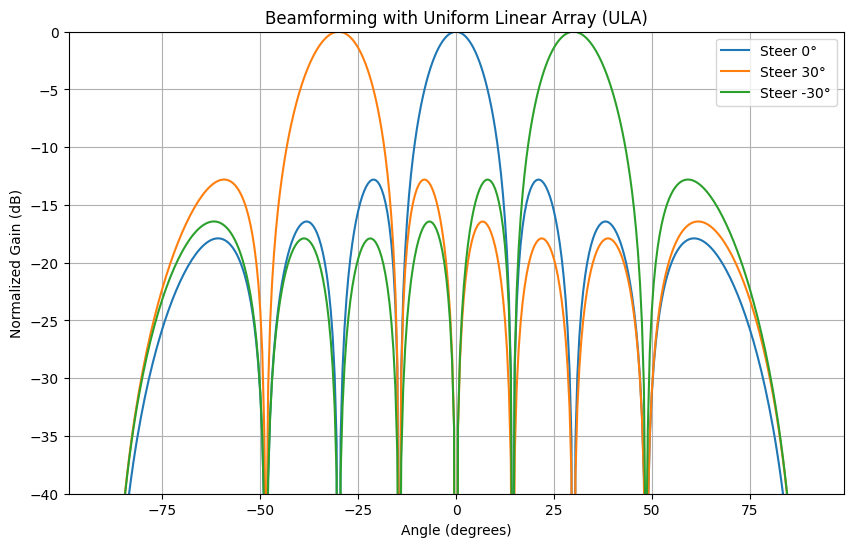

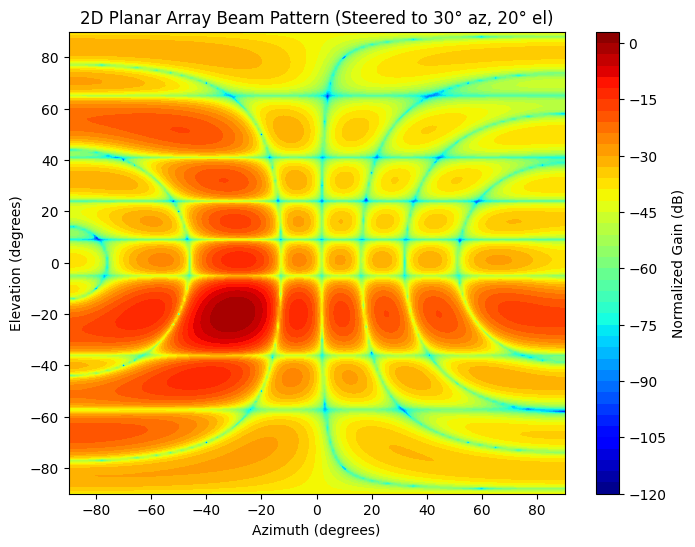

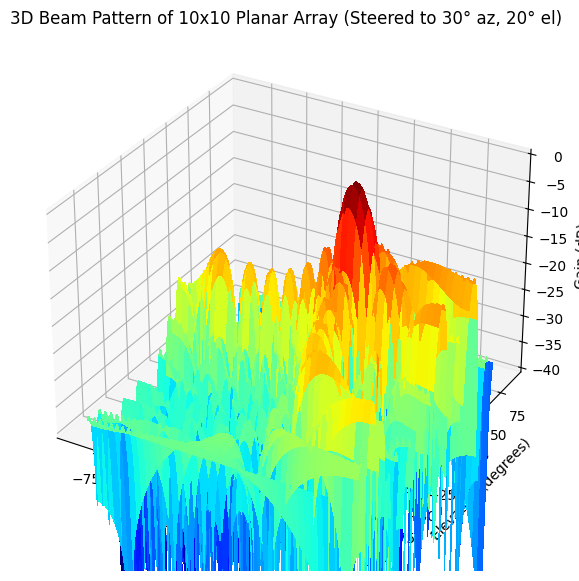

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

'''
Expected Output
- Three curves showing the array radiation pattern when steering to 0°, +30°, and –30°.
- The main lobe shifts to the desired angle, while sidelobes remain.
- Gain is normalized to 0 dB at the peak, with sidelobes suppressed.
'''
# -----------------------------
# Array Parameters
# -----------------------------
M = 8                 # Number of antenna elements
d = 0.5               # Element spacing in wavelengths (λ)
angles = np.linspace(-90, 90, 361)  # Scan angles in degrees

# Function to compute array factor
def array_factor(M, d, steer_angle):
    # Steering vector
    theta = np.deg2rad(angles)
    steer = np.deg2rad(steer_angle)
    k = 2 * np.pi  # normalized wavenumber (since spacing in λ)
    
    # Phase shift for steering
    phase_shift = np.exp(1j * k * d * np.arange(M) * np.sin(steer))
    
    # Array response
    AF = []
    for th in theta:
        response = np.sum(np.exp(1j * k * d * np.arange(M) * np.sin(th)) * phase_shift)
        AF.append(np.abs(response))
    AF = np.array(AF)
    AF /= np.max(AF)  # normalize
    return AF

# -----------------------------
# Plot beam patterns for different steering angles
# -----------------------------
plt.figure(figsize=(10, 6))
for steer_angle in [0, 30, -30]:
    AF = array_factor(M, d, steer_angle)
    plt.plot(angles, 20*np.log10(AF+1e-6), label=f"Steer {steer_angle}°")

plt.title("Beamforming with Uniform Linear Array (ULA)")
plt.xlabel("Angle (degrees)")
plt.ylabel("Normalized Gain (dB)")
plt.ylim(-40, 0)
plt.grid(True)
plt.legend()
plt.show()


'''
Expected Output
- A 2D contour plot showing the beam pattern in azimuth–elevation space.
- The main lobe is steered to 30° azimuth, 20° elevation.
- Sidelobes appear around the main lobe, but the peak is clearly focused at the steered direction.
'''
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Array Parameters
# -----------------------------
Nx = 8   # Number of elements along x-axis
Ny = 8   # Number of elements along y-axis
d = 0.5  # Element spacing in wavelengths (λ)

# Angle grid
az = np.linspace(-90, 90, 181)   # Azimuth angles
el = np.linspace(-90, 90, 181)   # Elevation angles
AZ, EL = np.meshgrid(az, el)

# Steering direction (azimuth, elevation)
steer_az = 30   # degrees
steer_el = 20   # degrees

# -----------------------------
# Compute Array Factor
# -----------------------------
def planar_array_factor(Nx, Ny, d, steer_az, steer_el, AZ, EL):
    k = 2 * np.pi  # normalized wavenumber (spacing in λ)
    steer_az_rad = np.deg2rad(steer_az)
    steer_el_rad = np.deg2rad(steer_el)

    # Steering vector phase shifts
    phase_x = np.exp(1j * k * d * np.arange(Nx) * np.sin(steer_az_rad) * np.cos(steer_el_rad))
    phase_y = np.exp(1j * k * d * np.arange(Ny) * np.sin(steer_el_rad))

    AF = np.zeros_like(AZ, dtype=complex)

    for ix in range(Nx):
        for iy in range(Ny):
            AF += np.exp(1j * k * d * (ix * np.sin(np.deg2rad(AZ)) * np.cos(np.deg2rad(EL)) +
                                       iy * np.sin(np.deg2rad(EL)))) * phase_x[ix] * phase_y[iy]

    AF = np.abs(AF)
    AF /= np.max(AF)  # normalize
    return AF

AF = planar_array_factor(Nx, Ny, d, steer_az, steer_el, AZ, EL)

# -----------------------------
# Plot Beam Pattern
# -----------------------------
plt.figure(figsize=(8, 6))
plt.contourf(AZ, EL, 20*np.log10(AF+1e-6), levels=40, cmap='jet')
plt.colorbar(label="Normalized Gain (dB)")
plt.title(f"2D Planar Array Beam Pattern (Steered to {steer_az}° az, {steer_el}° el)")
plt.xlabel("Azimuth (degrees)")
plt.ylabel("Elevation (degrees)")
plt.show()


'''
Expected Output
- A 3D surface plot of gain (in dB) vs. azimuth and elevation.
- The main lobe is clearly visible at 30° azimuth, 20° elevation.
- Sidelobes appear around the main lobe, suppressed relative to the peak.
- Gain normalized to 0 dB at the peak, clipped at –40 dB for clarity.
'''
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# -----------------------------
# Array Parameters
# -----------------------------
Nx = 10   # Number of elements along x-axis
Ny = 10   # Number of elements along y-axis
d = 0.5   # Element spacing in wavelengths (λ)

# Angle grid
az = np.linspace(-90, 90, 181)   # Azimuth angles
el = np.linspace(-90, 90, 181)   # Elevation angles
AZ, EL = np.meshgrid(az, el)

# Steering direction (azimuth, elevation)
steer_az = 30   # degrees
steer_el = 20   # degrees

# -----------------------------
# Compute Array Factor
# -----------------------------
def planar_array_factor(Nx, Ny, d, steer_az, steer_el, AZ, EL):
    k = 2 * np.pi  # normalized wavenumber (spacing in λ)
    steer_az_rad = np.deg2rad(steer_az)
    steer_el_rad = np.deg2rad(steer_el)

    AF = np.zeros_like(AZ, dtype=complex)

    for ix in range(Nx):
        for iy in range(Ny):
            AF += np.exp(1j * k * d * (
                ix * (np.sin(np.deg2rad(AZ)) * np.cos(np.deg2rad(EL)) - np.sin(steer_az_rad) * np.cos(steer_el_rad)) +
                iy * (np.sin(np.deg2rad(EL)) - np.sin(steer_el_rad))
            ))

    AF = np.abs(AF)
    AF /= np.max(AF)  # normalize
    return AF

AF = planar_array_factor(Nx, Ny, d, steer_az, steer_el, AZ, EL)

# -----------------------------
# 3D Surface Plot
# -----------------------------
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Convert to dB
AF_dB = 20 * np.log10(AF + 1e-6)

# Plot surface
ax.plot_surface(AZ, EL, AF_dB, cmap='jet', linewidth=0, antialiased=False)

ax.set_title(f"3D Beam Pattern of {Nx}x{Ny} Planar Array (Steered to {steer_az}° az, {steer_el}° el)")
ax.set_xlabel("Azimuth (degrees)")
ax.set_ylabel("Elevation (degrees)")
ax.set_zlabel("Gain (dB)")
ax.set_zlim(-40, 0)  # dynamic range

plt.show()

### 2.1.2 Subspace-Based Methods

#### MUSIC (Multiple Signal Classification):
Multiple Signal Classification (MUSIC) is a high-resolution algorithm used in array signal processing to estimate the Direction of Arrival (DOA) of multiple signals impinging on an antenna array. It’s widely applied in radar, sonar, wireless communications, and acoustics.

##### Motivation
- Conventional beamforming (like Bartlett or Capon) has limited resolution.
- MUSIC exploits the structure of the signal and noise subspaces to achieve super-resolution, allowing it to distinguish signals arriving from closely spaced angles.

##### Principle of Operation
1. 	Array Model
- Assume $M$ sensors receive $K$ narrowband signals from directions $- \theta _1,\theta _2,\dots ,\theta _K$.
- Received signal vector:
$\mathbf{x}(t)=\mathbf{As}(t)+\mathbf{n}(t)$

- where $A$ is the steering matrix, $\mathbf{s}(t)$ are source signals, and $\mathbf{n}(t)$ is noise.
2. 	Covariance Matrix
- Estimate covariance:
$R_x=E[\mathbf{x}(t)\mathbf{x^{\mathnormal{H}}}(t)]$

3. 	Eigen-Decomposition
- Decompose $R_x$ into eigenvalues/eigenvectors.
- Signal subspace: spanned by eigenvectors corresponding to large eigenvalues.
- Noise subspace: spanned by eigenvectors corresponding to small eigenvalues.
4. 	MUSIC Spectrum
- For a candidate angle $\theta$, compute steering vector $\mathbf{a}(\theta )$.
- MUSIC pseudo-spectrum:
$P_{MUSIC}(\theta )=\frac{1}{\mathbf{a^{\mathnormal{H}}}(\theta )\, E_nE_n^H\, \mathbf{a}(\theta )}$

- $E_n$: matrix of eigenvectors spanning the noise subspace
- $E_nE_n^H$: projection operator onto the noise subspace
- Peaks in  indicate DOAs.

##### Benefits
- Super-resolution: Can resolve signals closer than the classical Rayleigh limit.
- Robust to noise: Exploits orthogonality between signal and noise subspaces.
- Widely used: Radar, sonar, wireless channel estimation, microphone arrays.

##### Practical Considerations
- Requires number of sources  to be known or estimated.
- Performance depends on SNR and number of snapshots.
- Computationally intensive (eigen-decomposition).

1. Compute received signal covariance: $\mathbf{R} = E[\mathbf{x}(t)\mathbf{x}^H(t)]$
2. Eigenvalue decomposition: $\mathbf{R} = \mathbf{U} \boldsymbol{\Lambda} \mathbf{U}^H$
3. Separate into signal and noise subspaces
4. MUSIC spectrum: $P_{MUSIC}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \mathbf{U}_N \mathbf{U}_N^H \mathbf{a}(\theta)}$
5. Find peaks for DOA estimates

**Advantages**: High resolution, accurate frequency estimation
**Disadvantages**: Computationally intensive, requires knowledge of number of sources



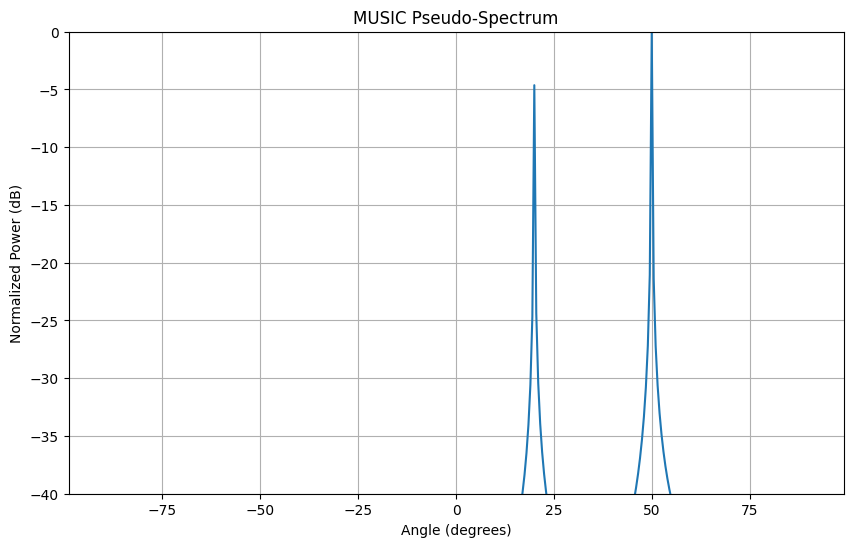

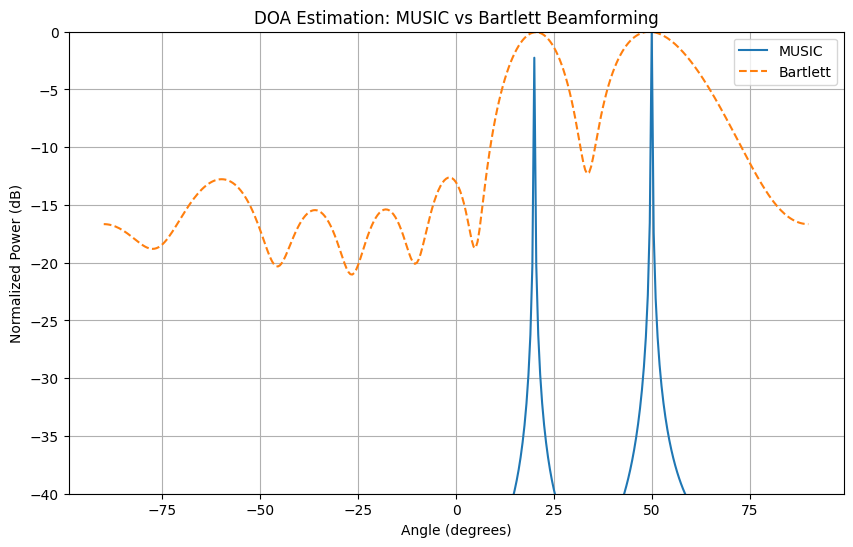

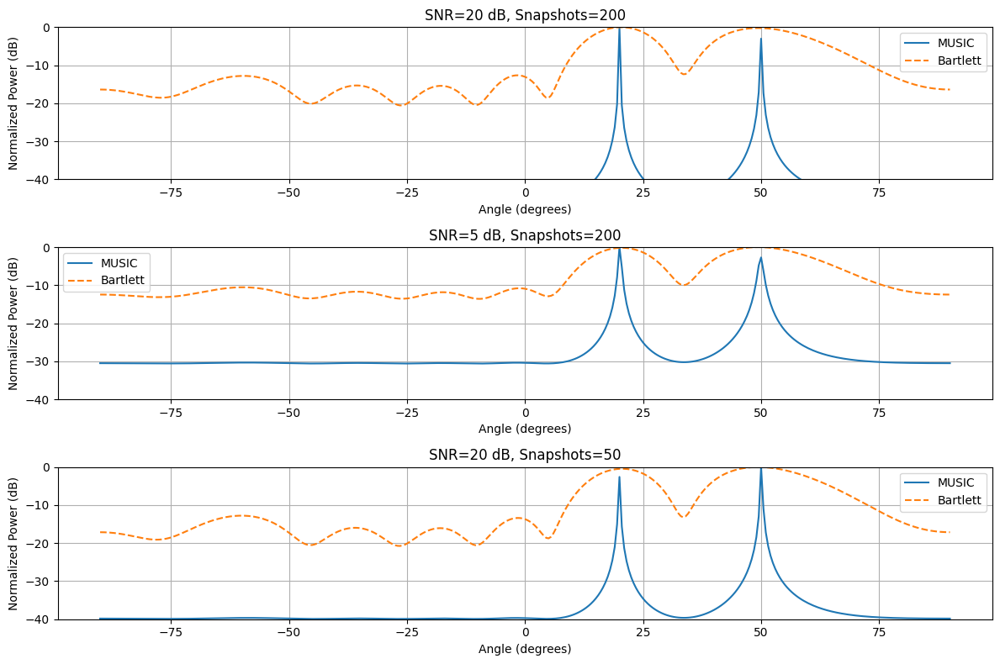

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Array and Signal Parameters
# -----------------------------
M = 8                  # Number of sensors in ULA
d = 0.5                # Spacing in wavelengths (λ/2)
angles_true = [20, 50] # True DOAs in degrees
K = len(angles_true)   # Number of sources
snapshots = 200        # Number of time samples
SNR = 20               # Signal-to-noise ratio in dB

'''
Expected Output
- A spectrum plot from –90° to +90°.
- Sharp peaks at the true DOAs (20° and 50°).
- Background suppressed, showing MUSIC’s super‑resolution compared to conventional beamforming.
'''
# -----------------------------
# Steering Vector Function
# -----------------------------
def steering_vector(M, d, angle_deg):
    angle = np.deg2rad(angle_deg)
    return np.exp(-1j * 2 * np.pi * d * np.arange(M) * np.sin(angle))

# -----------------------------
# Generate Signals
# -----------------------------
signals = np.random.randn(K, snapshots) + 1j*np.random.randn(K, snapshots)
A = np.array([steering_vector(M, d, ang) for ang in angles_true]).T
X = A @ signals

# Add noise
noise = (np.random.randn(M, snapshots) + 1j*np.random.randn(M, snapshots)) \
        * 10**(-SNR/20)
X += noise

# -----------------------------
# Covariance Matrix
# -----------------------------
R = (X @ X.conj().T) / snapshots

# Eigen-decomposition
eigvals, eigvecs = np.linalg.eigh(R)
idx = np.argsort(eigvals)[::-1]
eigvecs = eigvecs[:, idx]
E_n = eigvecs[:, K:]   # Noise subspace

# -----------------------------
# MUSIC Pseudo-Spectrum
# -----------------------------
scan_angles = np.linspace(-90, 90, 361)
P_music = []

for ang in scan_angles:
    a = steering_vector(M, d, ang)
    denom = np.linalg.norm(E_n.conj().T @ a)**2
    P_music.append(1/denom)

P_music = np.abs(P_music)
P_music /= np.max(P_music)

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(10,6))
plt.plot(scan_angles, 10*np.log10(P_music+1e-12))
plt.title("MUSIC Pseudo-Spectrum")
plt.xlabel("Angle (degrees)")
plt.ylabel("Normalized Power (dB)")
plt.grid(True)
plt.ylim(-40, 0)
plt.show()


'''
Expected Output
- MUSIC spectrum: Sharp, narrow peaks at 20° and 50°.
- Bartlett spectrum: Broader lobes, less resolution — peaks may overlap if sources are close.
- The plot clearly shows MUSIC’s super‑resolution advantage compared to conventional beamforming.
'''
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Array and Signal Parameters
# -----------------------------
M = 8                  # Number of sensors in ULA
d = 0.5                # Spacing in wavelengths (λ/2)
angles_true = [20, 50] # True DOAs in degrees
K = len(angles_true)   # Number of sources
snapshots = 200        # Number of time samples
SNR = 20               # Signal-to-noise ratio in dB

# -----------------------------
# Steering Vector Function
# -----------------------------
def steering_vector(M, d, angle_deg):
    angle = np.deg2rad(angle_deg)
    return np.exp(-1j * 2 * np.pi * d * np.arange(M) * np.sin(angle))

# -----------------------------
# Generate Signals
# -----------------------------
signals = np.random.randn(K, snapshots) + 1j*np.random.randn(K, snapshots)
A = np.array([steering_vector(M, d, ang) for ang in angles_true]).T
X = A @ signals

# Add noise
noise = (np.random.randn(M, snapshots) + 1j*np.random.randn(M, snapshots)) \
        * 10**(-SNR/20)
X += noise

# -----------------------------
# Covariance Matrix
# -----------------------------
R = (X @ X.conj().T) / snapshots

# Eigen-decomposition
eigvals, eigvecs = np.linalg.eigh(R)
idx = np.argsort(eigvals)[::-1]
eigvecs = eigvecs[:, idx]
E_n = eigvecs[:, K:]   # Noise subspace

# -----------------------------
# MUSIC Pseudo-Spectrum
# -----------------------------
scan_angles = np.linspace(-90, 90, 361)
P_music = []
P_bartlett = []

for ang in scan_angles:
    a = steering_vector(M, d, ang)
    # MUSIC
    denom = np.linalg.norm(E_n.conj().T @ a)**2
    P_music.append(1/denom)
    # Bartlett (conventional beamformer)
    P_bartlett.append(np.real(a.conj().T @ R @ a))

# Normalize
P_music = np.abs(P_music) / np.max(np.abs(P_music))
P_bartlett = np.abs(P_bartlett) / np.max(np.abs(P_bartlett))

# -----------------------------
# Plot Comparison
# -----------------------------
plt.figure(figsize=(10,6))
plt.plot(scan_angles, 10*np.log10(P_music+1e-12), label="MUSIC")
plt.plot(scan_angles, 10*np.log10(P_bartlett+1e-12), label="Bartlett", linestyle='--')
plt.title("DOA Estimation: MUSIC vs Bartlett Beamforming")
plt.xlabel("Angle (degrees)")
plt.ylabel("Normalized Power (dB)")
plt.legend()
plt.grid(True)
plt.ylim(-40, 0)
plt.show()


'''
Expected Results
- High SNR, many snapshots (20 dB, 200 samples): MUSIC shows sharp peaks at 20° and 50°, Bartlett shows broad lobes.
- Low SNR (5 dB): MUSIC peaks are weaker but still sharper than Bartlett.
- Few snapshots (50): MUSIC resolution degrades, peaks broaden, but still better than Bartlett.
'''

import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Parameters
# -----------------------------
M = 8                  # Number of sensors in ULA
d = 0.5                # Spacing in wavelengths (λ/2)
angles_true = [20, 50] # True DOAs in degrees
K = len(angles_true)   # Number of sources

def steering_vector(M, d, angle_deg):
    angle = np.deg2rad(angle_deg)
    return np.exp(-1j * 2 * np.pi * d * np.arange(M) * np.sin(angle))

def simulate_DOA(SNR, snapshots):
    # Generate signals
    signals = np.random.randn(K, snapshots) + 1j*np.random.randn(K, snapshots)
    A = np.array([steering_vector(M, d, ang) for ang in angles_true]).T
    X = A @ signals

    # Add noise
    noise = (np.random.randn(M, snapshots) + 1j*np.random.randn(M, snapshots)) \
            * 10**(-SNR/20)
    X += noise

    # Covariance matrix
    R = (X @ X.conj().T) / snapshots

    # Eigen-decomposition
    eigvals, eigvecs = np.linalg.eigh(R)
    idx = np.argsort(eigvals)[::-1]
    eigvecs = eigvecs[:, idx]
    E_n = eigvecs[:, K:]   # Noise subspace

    # Scan angles
    scan_angles = np.linspace(-90, 90, 361)
    P_music = []
    P_bartlett = []

    for ang in scan_angles:
        a = steering_vector(M, d, ang)
        # MUSIC
        denom = np.linalg.norm(E_n.conj().T @ a)**2
        P_music.append(1/denom)
        # Bartlett
        P_bartlett.append(np.real(a.conj().T @ R @ a))

    # Normalize
    P_music = np.abs(P_music) / np.max(np.abs(P_music))
    P_bartlett = np.abs(P_bartlett) / np.max(np.abs(P_bartlett))

    return scan_angles, P_music, P_bartlett

# -----------------------------
# Run experiments
# -----------------------------
conditions = [
    {"SNR": 20, "snapshots": 200},
    {"SNR": 5, "snapshots": 200},
    {"SNR": 20, "snapshots": 50},
]

plt.figure(figsize=(12,8))

for i, cond in enumerate(conditions, 1):
    scan_angles, P_music, P_bartlett = simulate_DOA(cond["SNR"], cond["snapshots"])
    plt.subplot(3,1,i)
    plt.plot(scan_angles, 10*np.log10(P_music+1e-12), label="MUSIC")
    plt.plot(scan_angles, 10*np.log10(P_bartlett+1e-12), label="Bartlett", linestyle='--')
    plt.title(f"SNR={cond['SNR']} dB, Snapshots={cond['snapshots']}")
    plt.xlabel("Angle (degrees)")
    plt.ylabel("Normalized Power (dB)")
    plt.legend()
    plt.grid(True)
    plt.ylim(-40, 0)

plt.tight_layout()
plt.show()

### 2.1.3 Minimum Variance Distortionless Response (MVDR/Capon)

The MVDR beamformer, also known as the Capon beamformer, is an adaptive array processing technique that improves resolution and interference suppression compared to conventional beamforming. It’s widely used in radar, sonar, wireless communications, and microphone arrays.

####  Motivation
- Conventional beamforming (delay-and-sum) has limited resolution and high sidelobes.
- MVDR minimizes the output power of the array while maintaining a distortionless response in the desired look direction.
- This allows strong suppression of interference and noise while preserving the target signal.

#### Principle of Operation
The MVDR beamformer solves the optimization problem:
$\min _{\mathbf{w}}\; \mathbf{w^{\mathnormal{H}}}R_x\mathbf{w}\quad \mathrm{subject\  to}\quad \mathbf{w^{\mathnormal{H}}a}(\theta _0)=1$
- $\mathbf{w}$ : beamforming weight vector
- $R_x$ : covariance matrix of received signals
- $\mathbf{a}(\theta _0)$ : steering vector for desired direction $\theta _0$
This means:
- Minimize output power (reduce interference/noise).
- Keep unity gain in the desired direction (no distortion).

#### Solution
The optimal MVDR weights are:
$\mathbf{w_{\mathnormal{MVDR}}}=\frac{R_x^{-1}\mathbf{a}(\theta _0)}{\mathbf{a^{\mathnormal{H}}}(\theta _0)R_x^{-1}\mathbf{a}(\theta _0)}$
This ensures distortionless response in the look direction while minimizing variance elsewhere.

#### MVDR Spectrum
For scanning across angles, the MVDR pseudo-spectrum is:
$P_{MVDR}(\theta )=\frac{1}{\mathbf{a^{\mathnormal{H}}}(\theta )R_x^{-1}\mathbf{a}(\theta )}$
- Peaks indicate signal directions.
- Compared to Bartlett, MVDR has sharper peaks and better interference rejection.

#### Benefits
- Higher resolution than conventional beamforming.
- Adaptive interference suppression.
- Distortionless response in desired direction.

#### Practical Considerations
- Requires accurate covariance matrix estimation.
- Sensitive to model mismatch (array calibration errors).
- Computationally more expensive (matrix inversion).

**Beamformer Design**:
- Minimize output power: $\min_{\mathbf{w}} \mathbf{w}^H \mathbf{R} \mathbf{w}$
- Subject to distortionless constraint: $\mathbf{w}^H \mathbf{a}(\theta_0) = 1$

**Optimal Weight Vector**:
$$\mathbf{w}_{MVDR} = \frac{\mathbf{R}^{-1} \mathbf{a}(\theta_0)}{\mathbf{a}^H(\theta_0) \mathbf{R}^{-1} \mathbf{a}(\theta_0)}$$

**MVDR Spectrum**:
$$P_{MVDR}(\theta) = \frac{1}{\mathbf{a}^H(\theta) \mathbf{R}^{-1} \mathbf{a}(\theta)}$$

---

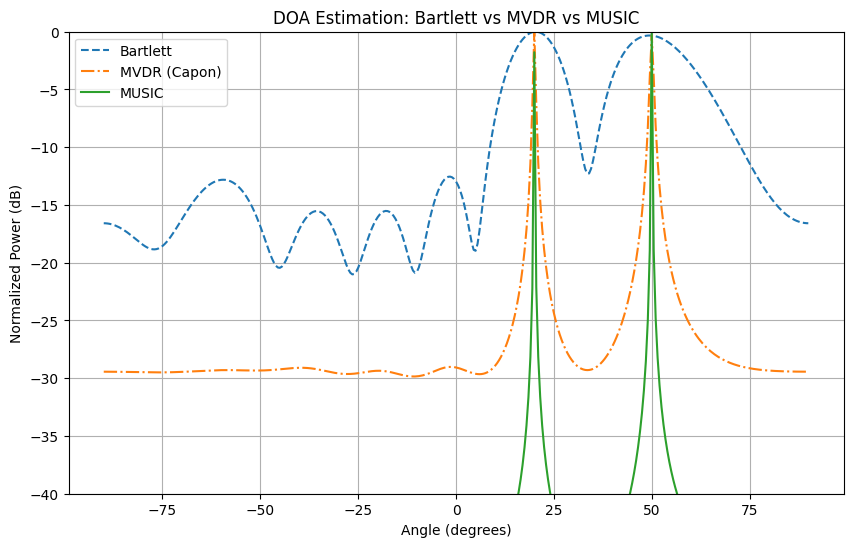

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Array and Signal Parameters
# -----------------------------
M = 8                  # Number of sensors in ULA
d = 0.5                # Spacing in wavelengths (λ/2)
angles_true = [20, 50] # True DOAs in degrees
K = len(angles_true)   # Number of sources
snapshots = 200        # Number of time samples
SNR = 20               # Signal-to-noise ratio in dB

# -----------------------------
# Steering Vector Function
# -----------------------------
def steering_vector(M, d, angle_deg):
    angle = np.deg2rad(angle_deg)
    return np.exp(-1j * 2 * np.pi * d * np.arange(M) * np.sin(angle))

# -----------------------------
# Generate Signals
# -----------------------------
signals = np.random.randn(K, snapshots) + 1j*np.random.randn(K, snapshots)
A = np.array([steering_vector(M, d, ang) for ang in angles_true]).T
X = A @ signals

# Add noise
noise = (np.random.randn(M, snapshots) + 1j*np.random.randn(M, snapshots)) \
        * 10**(-SNR/20)
X += noise

# -----------------------------
# Covariance Matrix
# -----------------------------
R = (X @ X.conj().T) / snapshots

# Eigen-decomposition
eigvals, eigvecs = np.linalg.eigh(R)
idx = np.argsort(eigvals)[::-1]
eigvecs = eigvecs[:, idx]
E_n = eigvecs[:, K:]   # Noise subspace

# -----------------------------
# Spectra Computation
# -----------------------------
scan_angles = np.linspace(-90, 90, 361)
P_bartlett, P_music, P_mvdr = [], [], []

R_inv = np.linalg.inv(R)

for ang in scan_angles:
    a = steering_vector(M, d, ang)
    # Bartlett
    P_bartlett.append(np.real(a.conj().T @ R @ a))
    # MUSIC
    denom_music = np.linalg.norm(E_n.conj().T @ a)**2
    P_music.append(1/denom_music)
    # MVDR
    denom_mvdr = np.real(a.conj().T @ R_inv @ a)
    P_mvdr.append(1/denom_mvdr)

# Normalize
P_bartlett = np.abs(P_bartlett) / np.max(np.abs(P_bartlett))
P_music = np.abs(P_music) / np.max(np.abs(P_music))
P_mvdr = np.abs(P_mvdr) / np.max(np.abs(P_mvdr))

# -----------------------------
# Plot Comparison
# -----------------------------
plt.figure(figsize=(10,6))
plt.plot(scan_angles, 10*np.log10(P_bartlett+1e-12), label="Bartlett", linestyle='--')
plt.plot(scan_angles, 10*np.log10(P_mvdr+1e-12), label="MVDR (Capon)", linestyle='-.')
plt.plot(scan_angles, 10*np.log10(P_music+1e-12), label="MUSIC")
plt.title("DOA Estimation: Bartlett vs MVDR vs MUSIC")
plt.xlabel("Angle (degrees)")
plt.ylabel("Normalized Power (dB)")
plt.legend()
plt.grid(True)
plt.ylim(-40, 0)
plt.show()


DIRECTION OF ARRIVAL (DOA) ESTIMATION - PYTHON EXAMPLES

1. BEAMFORMING WITH ULA (UNIFORM LINEAR ARRAY)
--------------------------------------------------------------------------------
ULA Configuration:
  Elements: 8
  Spacing: 0.5λ
  Array length: 3.5λ

Beampattern characteristics:
  Peak response: 1.0000
  3-dB Beamwidth: 12.0°

2. MUSIC ALGORITHM FOR DOA ESTIMATION
--------------------------------------------------------------------------------
Signal Configuration:
  Number of sources: 2
  Source angles: [-30  20]°
  Source powers: [1.  0.5]
  Snapshots: 100
  SNR: 10 dB

MUSIC Results:
  True angles: [-30  20]°
  Estimated angles: -30.0°, 20.0°

3. MVDR (CAPON) BEAMFORMER
--------------------------------------------------------------------------------
MVDR Results:
  Computed MVDR spectrum


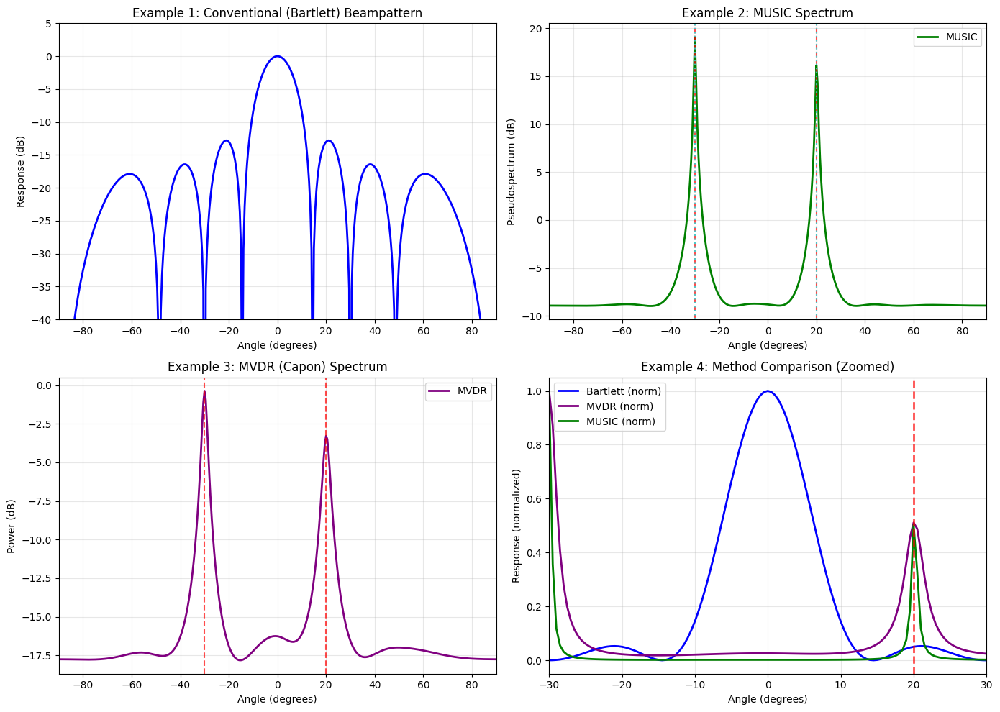


DOA estimation examples complete!


In [6]:
import numpy as np
import matplotlib.pyplot as plt

print("\n" + "=" * 80)
print("DIRECTION OF ARRIVAL (DOA) ESTIMATION - PYTHON EXAMPLES")
print("=" * 80)

# ============================================================================
# EXAMPLE 1: BEAMFORMING FUNDAMENTALS
# ============================================================================
print("\n1. BEAMFORMING WITH ULA (UNIFORM LINEAR ARRAY)")
print("-" * 80)

# Array parameters
num_elements = 8
wavelength = 1.0
spacing = wavelength / 2  # Half-wavelength spacing (optimal)

# Angle grid
angles = np.linspace(-90, 90, 361)
angles_rad = np.deg2rad(angles)

def steering_vector(angles_rad, num_elements, spacing, wavelength=1.0):
    """Generate steering vectors for ULA over a set of angles (in radians)."""
    m = np.arange(num_elements)
    # psi has shape (num_angles, num_elements)
    psi = 2 * np.pi * m * spacing * np.sin(angles_rad)[:, np.newaxis] / wavelength
    a = np.exp(1j * psi)
    return a  # shape: (num_angles, num_elements)

def beampattern_bartlett(angles_rad, num_elements, spacing):
    """Conventional (Bartlett) beamformer."""
    a = steering_vector(angles_rad, num_elements, spacing)            # (Nang, M)
    weights = np.ones(num_elements, dtype=complex) / num_elements     # (M,)
    response = np.abs(a @ weights.conj())**2                          # (Nang,)
    return response

# Calculate beampatterns
response_bartlett = beampattern_bartlett(angles_rad, num_elements, spacing)

print(f"ULA Configuration:")
print(f"  Elements: {num_elements}")
print(f"  Spacing: {spacing}λ")
print(f"  Array length: {(num_elements-1)*spacing}λ")

# Find beamwidth (3-dB width)
max_response = np.max(response_bartlett)
half_power = max_response / 2
beamwidth_idx = np.where(response_bartlett > half_power)[0]
beamwidth = angles[beamwidth_idx[-1]] - angles[beamwidth_idx[0]]

print(f"\nBeampattern characteristics:")
print(f"  Peak response: {max_response:.4f}")
print(f"  3-dB Beamwidth: {beamwidth:.1f}°")

# ============================================================================
# EXAMPLE 2: MUSIC ALGORITHM FOR DOA ESTIMATION
# ============================================================================
print("\n2. MUSIC ALGORITHM FOR DOA ESTIMATION")
print("-" * 80)

# Signal parameters
num_sources = 2
source_angles = np.array([-30, 20])  # Two sources (degrees)
source_powers = np.array([1.0, 0.5])
num_snapshots = 100
SNR_dB = 10

print(f"Signal Configuration:")
print(f"  Number of sources: {num_sources}")
print(f"  Source angles: {source_angles}°")
print(f"  Source powers: {source_powers}")
print(f"  Snapshots: {num_snapshots}")
print(f"  SNR: {SNR_dB} dB")

# Generate received signal
received = np.zeros((num_elements, num_snapshots), dtype=complex)

for angle_deg, power in zip(source_angles, source_powers):
    angle_rad = np.deg2rad(angle_deg)
    # steering vector for a single angle: returns shape (1, M), take [0, :]
    a_source = steering_vector(np.array([angle_rad]), num_elements, spacing)[0, :]
    # Complex source with random uniform phase
    signal_amplitude = np.sqrt(power)
    phase = np.exp(1j * 2 * np.pi * np.random.rand(num_snapshots))
    signal = signal_amplitude * phase
    received += np.outer(a_source, signal)

# Add spatially white noise
noise_power = np.sum(source_powers) / (10**(SNR_dB/10))
noise = np.sqrt(noise_power/2) * (np.random.randn(num_elements, num_snapshots) +
                                  1j * np.random.randn(num_elements, num_snapshots))
received_noisy = received + noise

# MUSIC algorithm
R = (received_noisy @ received_noisy.conj().T) / num_snapshots  # Covariance matrix (M x M)
eigvals, eigvecs = np.linalg.eigh(R)
# Sort eigenvalues/eigenvectors descending
idx = np.argsort(eigvals)[::-1]
eigvals = eigvals[idx]
eigvecs = eigvecs[:, idx]

# Noise subspace (eigenvectors corresponding to smallest eigenvalues)
noise_dim = num_elements - num_sources
U_N = eigvecs[:, num_sources:]  # shape (M, M-K)

# MUSIC spectrum
music_spectrum = np.zeros(len(angles))
for i, angle_rad_val in enumerate(angles_rad):
    a = steering_vector(np.array([angle_rad_val]), num_elements, spacing)[0, :]  # (M,)
    # Correct MUSIC denominator: a^H U_N U_N^H a = ||U_N^H a||^2
    denom = np.linalg.norm(U_N.conj().T @ a)**2
    music_spectrum[i] = 1.0 / (denom + 1e-12)

# Peak picking: find top-K peaks without zeroing the spectrum used for plotting
spectrum_copy = music_spectrum.copy()
peak_indices = []
for _ in range(num_sources):
    idx_max = np.argmax(spectrum_copy)
    peak_indices.append(idx_max)
    # Suppress neighborhood to avoid selecting same peak again
    left = max(0, idx_max - 5)
    right = min(len(spectrum_copy), idx_max + 6)
    spectrum_copy[left:right] = 0.0

music_estimates = angles[np.sort(peak_indices)]

print(f"\nMUSIC Results:")
print(f"  True angles: {source_angles}°")
print(f"  Estimated angles: {', '.join([f'{a:.1f}°' for a in music_estimates])}")

# ============================================================================
# EXAMPLE 3: MVDR (CAPON) BEAMFORMER
# ============================================================================
print("\n3. MVDR (CAPON) BEAMFORMER")
print("-" * 80)

# Precompute inverse of covariance
R_inv = np.linalg.inv(R)

# MVDR spectrum
mvdr_spectrum = np.zeros(len(angles))
for i, angle_rad_val in enumerate(angles_rad):
    a = steering_vector(np.array([angle_rad_val]), num_elements, spacing)[0, :]  # (M,)
    denom = np.real(a.conj().T @ R_inv @ a)
    mvdr_spectrum[i] = 1.0 / (denom + 1e-12)

print(f"MVDR Results:")
print(f"  Computed MVDR spectrum")

# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Bartlett beampattern
axes[0, 0].plot(angles, 10*np.log10(response_bartlett + 1e-12), 'b-', linewidth=2)
axes[0, 0].set_xlabel('Angle (degrees)')
axes[0, 0].set_ylabel('Response (dB)')
axes[0, 0].set_title('Example 1: Conventional (Bartlett) Beampattern')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_xlim([-90, 90])
axes[0, 0].set_ylim([-40, 5])

# Plot 2: MUSIC spectrum
axes[0, 1].plot(angles, 10*np.log10(music_spectrum + 1e-12), 'g-', linewidth=2, label='MUSIC')
for true_angle in source_angles:
    axes[0, 1].axvline(true_angle, color='red', linestyle='--', linewidth=1.5, alpha=0.7)
for est_angle in music_estimates:
    axes[0, 1].axvline(est_angle, color='cyan', linestyle=':', linewidth=1.5, alpha=0.7)
axes[0, 1].set_xlabel('Angle (degrees)')
axes[0, 1].set_ylabel('Pseudospectrum (dB)')
axes[0, 1].set_title('Example 2: MUSIC Spectrum')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xlim([-90, 90])
axes[0, 1].legend()

# Plot 3: MVDR spectrum
axes[1, 0].plot(angles, 10*np.log10(mvdr_spectrum + 1e-12), color='purple', linewidth=2, label='MVDR')
for true_angle in source_angles:
    axes[1, 0].axvline(true_angle, color='red', linestyle='--', linewidth=1.5, alpha=0.7)
axes[1, 0].set_xlabel('Angle (degrees)')
axes[1, 0].set_ylabel('Power (dB)')
axes[1, 0].set_title('Example 3: MVDR (Capon) Spectrum')
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].set_xlim([-90, 90])
axes[1, 0].legend()

# Plot 4: Comparison (linear scale for zoom)
zoom_mask = (angles >= -30) & (angles <= 30)
axes[1, 1].plot(angles[zoom_mask], response_bartlett[zoom_mask] / np.max(response_bartlett), 'b-', linewidth=2, label='Bartlett (norm)')
axes[1, 1].plot(angles[zoom_mask], mvdr_spectrum[zoom_mask] / np.max(mvdr_spectrum), color='purple', linewidth=2, label='MVDR (norm)')
axes[1, 1].plot(angles[zoom_mask], music_spectrum[zoom_mask] / np.max(music_spectrum), 'g-', linewidth=2, label='MUSIC (norm)')
for true_angle in source_angles:
    if -30 <= true_angle <= 30:
        axes[1, 1].axvline(true_angle, color='red', linestyle='--', linewidth=2, alpha=0.7)
axes[1, 1].set_xlabel('Angle (degrees)')
axes[1, 1].set_ylabel('Response (normalized)')
axes[1, 1].set_title('Example 4: Method Comparison (Zoomed)')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].set_xlim([-30, 30])
axes[1, 1].legend()

plt.tight_layout()
plt.savefig('doa_estimation.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nDOA estimation examples complete!")

## Data-driven models
Data-driven models are increasingly being used in radar signal processing to enhance performance and accuracy. Here are some relevant data-driven models and techniques:

   - Deep Learning Models
      - Convolutional Neural Networks (CNNs): Used for tasks like human activity recognition (HAR) by processing radar-generated maps as visual data. CNNs can be combined with conventional radar signal processing methods to improve accuracy and efficiency.
   - Recurrent Neural Networks (RNNs): Suitable for time-series data analysis, RNNs can be used for target tracking and predicting the movement of objects in radar systems.
   - Generative Adversarial Networks (GANs): GANs can be used to generate synthetic radar data for training purposes, improving the robustness of radar systems.
   - Benchmark Datasets
      - RASPNet: A large-scale dataset for radar adaptive signal processing (RASP) applications, supporting the development of data-driven models within the radar community.
   - Hybrid Models
      - Hybrid CNN-RNN Models: Combining the strengths of CNNs and RNNs, these models can process both spatial and temporal information, making them suitable for complex radar signal processing tasks.

   - Applications
      - Human Activity Recognition (HAR): Using radar technology for applications in smart security systems, healthcare monitoring, and interactive computing.
      - Adaptive Signal Processing: Developing data-driven models for adaptive signal processing in radar systems, improving performance in various scenarios.

These data-driven models and techniques are transforming radar signal processing, enabling more accurate and efficient analysis of radar data.

---

## 3.1 Deep Learning Models for Radar - Theory

### 3.1.1 Convolutional Neural Networks (CNN)

**Architecture for Radar Data**:
- Input: Range-Doppler map (2D feature)
- Conv layers: Extract spatial-temporal features
- Pooling layers: Reduce dimensionality, increase robustness
- FC layers: Classification/regression

**Example Architecture**:
```
Input (128×64) → Conv2D(32, 3×3) → ReLU → MaxPool(2×2) 
  → Conv2D(64, 3×3) → ReLU → MaxPool(2×2) 
  → Flatten → Dense(128) → ReLU → Dropout(0.5) 
  → Dense(num_classes) → Softmax
```

**Applications**:
- Target classification (aircraft, missile, drone, etc.)
- Activity recognition (running, falling, standing)
- Gesture recognition



2025-11-24 20:36:37.162318: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-24 20:36:38.296072: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-24 20:36:39.321618: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764045401.076187    2085 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764045401.266815    2085 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-24 20:36:44.015906: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Generating synthetic dataset...
Preprocessing (normalization)...
Splitting dataset...


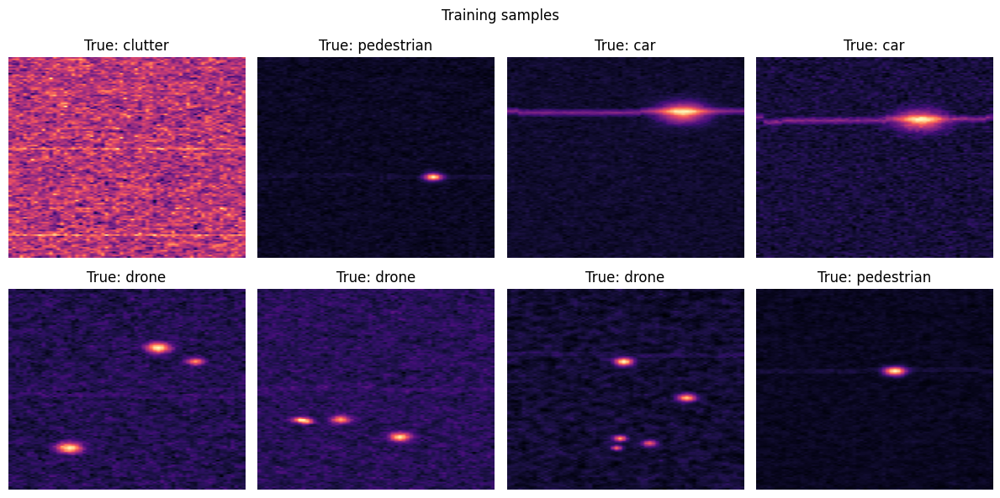

Building CNN model...


2025-11-24 20:37:53.831004: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 64, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 8, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     4,194,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,288,260 (16.36 MB)

 Trainable params: 4,288,260 (16.36 MB)

 Non-trainable params: 0 (0.00 B)

Training...
Epoch 1/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 61s 592ms/step - accuracy: 0.6337 - loss: 0.7632 - val_accuracy: 0.9750 - val_loss: 0.0825
Epoch 2/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 528ms/step - accuracy: 0.9770 - loss: 0.0835 - val_accuracy: 0.9917 - val_loss: 0.0232
Epoch 3/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 533ms/step - accuracy: 0.9884 - loss: 0.0338 - val_accuracy: 0.9708 - val_loss: 0.0807
Epoch 4/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 48s 542ms/step - accuracy: 0.9895 - loss: 0.0330 - val_accuracy: 0.9992 - val_loss: 0.0040
Epoch 5/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 536ms/step - accuracy: 0.9947 - loss: 0.0178 - val_accuracy: 0.9983 - val_loss: 0.0102
Epoch 6/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 47s 529ms/step - accuracy: 0.9904 - loss: 0.0273 - val_accuracy: 0.9883 - val_loss: 0.0235
Epoch 7/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 51s 576ms/step - accuracy: 0.9869 - loss: 0.0395 - val_accuracy: 0.9967 - val_loss: 0.0141
Epoch 8/20
88/88 ━━━━━━━━━━━━━━━━━━━━ 61s 688ms/step - accuracy: 0.9896 - loss: 0.032

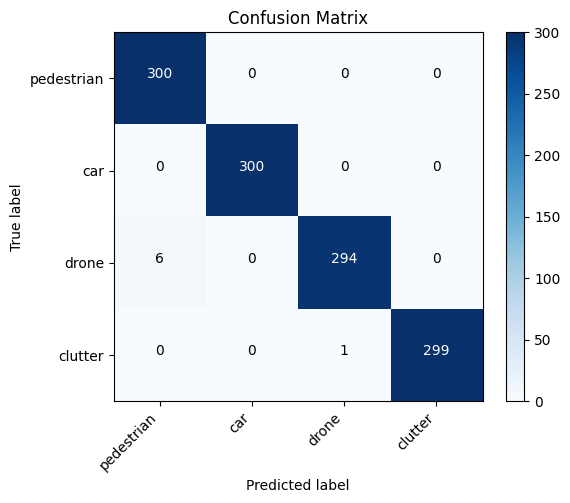

Classification report:
              precision    recall  f1-score   support

  pedestrian       0.98      1.00      0.99       300
         car       1.00      1.00      1.00       300
       drone       1.00      0.98      0.99       300
     clutter       1.00      1.00      1.00       300

    accuracy                           0.99      1200
   macro avg       0.99      0.99      0.99      1200
weighted avg       0.99      0.99      0.99      1200



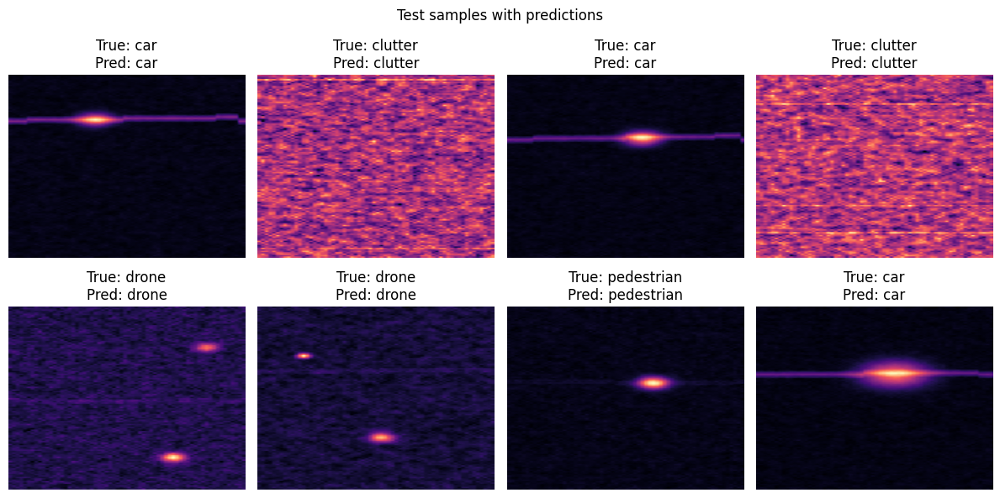

Running inference on new synthetic samples...


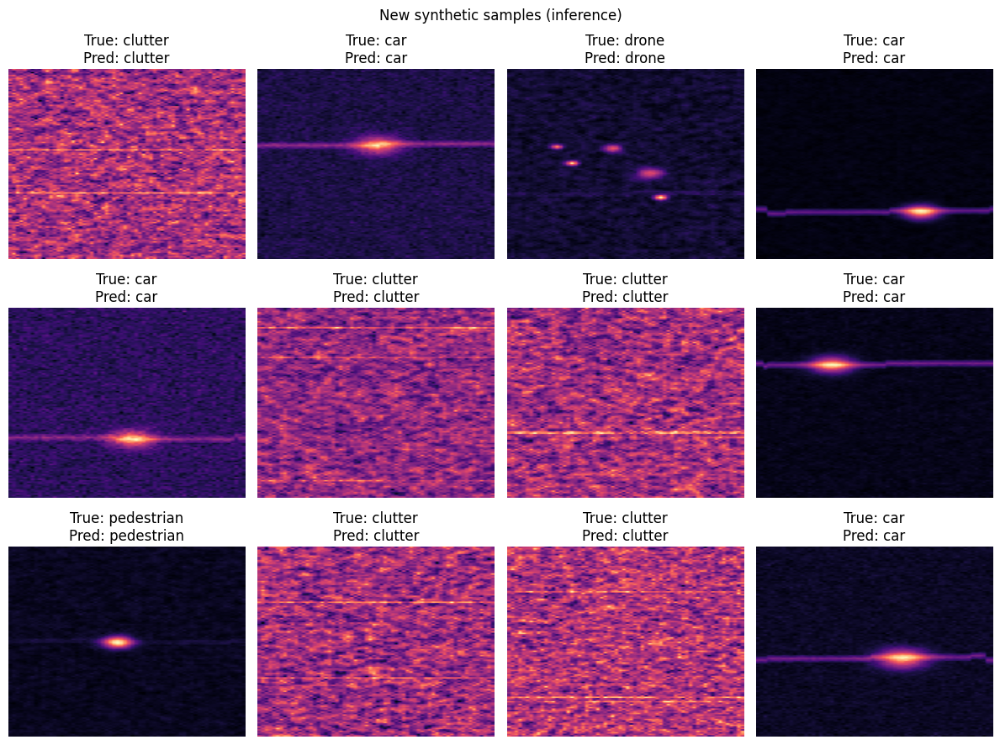

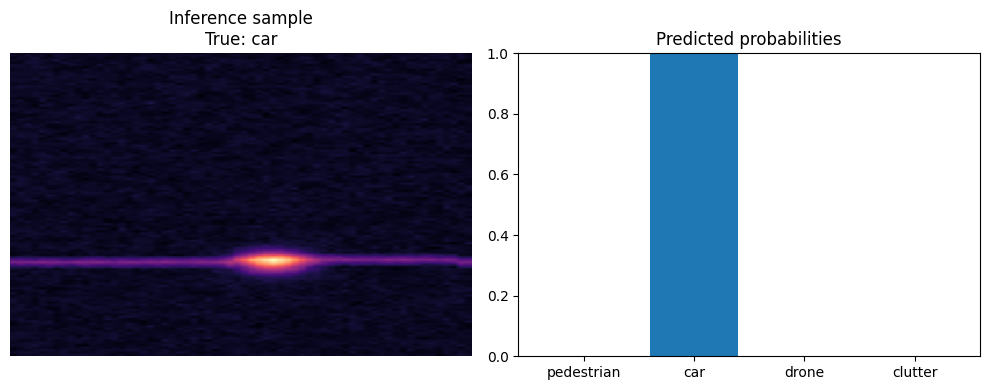

Pipeline complete.


In [7]:
# Radar CNN pipeline: synthetic data -> training -> inference -> visualization
# Author: You
# Requirements: tensorflow, numpy, matplotlib, scikit-learn

import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import itertools
import tensorflow as tf
from tensorflow.keras import layers, models, utils

# -----------------------------
# Reproducibility
# -----------------------------
np.random.seed(42)
tf.random.set_seed(42)

# -----------------------------
# Configuration
# -----------------------------
IMG_H, IMG_W = 128, 64     # Range-Doppler map size (H x W)
NUM_CLASSES = 4            # pedestrian, car, drone, clutter
CLASS_NAMES = ['pedestrian', 'car', 'drone', 'clutter']
SAMPLES_PER_CLASS = 2000   # adjust for dataset size
VAL_SPLIT = 0.15
TEST_SPLIT = 0.15
BATCH_SIZE = 64
EPOCHS = 20

# -----------------------------
# Synthetic data generation
# -----------------------------
def gaussian_blob(h, w, center, sigma=2.0, amplitude=1.0):
    """Create a 2D Gaussian blob."""
    cy, cx = center
    y = np.arange(h)[:, None]
    x = np.arange(w)[None, :]
    blob = amplitude * np.exp(-(((y - cy)**2 + (x - cx)**2) / (2 * sigma**2)))
    return blob

def doppler_streak(h, w, row, slope=0.0, thickness=2, amplitude=1.0):
    """Create a diagonal (or horizontal) streak across Doppler bins."""
    img = np.zeros((h, w))
    for t in range(w):
        r = int(row + slope * (t - w//2))
        r0 = np.clip(r - thickness//2, 0, h-1)
        r1 = np.clip(r + thickness//2, 0, h-1)
        img[r0:r1+1, t] = amplitude
    # smooth
    img = (img + np.roll(img, 1, axis=0) + np.roll(img, -1, axis=0)) / 3.0
    return img

def speckle_texture(h, w, scale=0.2):
    """Generate speckle-like texture."""
    base = np.random.rand(h, w)
    # Simple smoothing to get coherent patches
    base = (base + np.roll(base, 1, axis=0) + np.roll(base, -1, axis=0) +
            np.roll(base, 1, axis=1) + np.roll(base, -1, axis=1)) / 5.0
    return scale * base

def make_pedestrian(h, w):
    """Small compact blob with slight Doppler spread."""
    center = (np.random.randint(h//4, 3*h//4), np.random.randint(w//4, 3*w//4))
    blob = gaussian_blob(h, w, center, sigma=np.random.uniform(1.5, 3.0), amplitude=np.random.uniform(0.8, 1.2))
    streak = doppler_streak(h, w, center[0], slope=np.random.uniform(-0.02, 0.02), thickness=1, amplitude=0.4)
    img = blob + 0.3 * streak + speckle_texture(h, w, 0.1)
    return img

def make_car(h, w):
    """Larger high-energy blob with stronger Doppler streak."""
    center = (np.random.randint(h//4, 3*h//4), np.random.randint(w//4, 3*w//4))
    blob = gaussian_blob(h, w, center, sigma=np.random.uniform(3.0, 6.0), amplitude=np.random.uniform(1.2, 1.8))
    streak = doppler_streak(h, w, center[0], slope=np.random.uniform(-0.05, 0.05), thickness=3, amplitude=0.8)
    img = blob + 0.8 * streak + speckle_texture(h, w, 0.15)
    return img

def make_drone(h, w):
    """Multiple small blobs and speckle (micro-Doppler-like)."""
    img = speckle_texture(h, w, 0.25)
    num_blobs = np.random.randint(2, 6)
    for _ in range(num_blobs):
        center = (np.random.randint(h//6, 5*h//6), np.random.randint(w//6, 5*w//6))
        img += gaussian_blob(h, w, center, sigma=np.random.uniform(1.0, 2.5), amplitude=np.random.uniform(0.6, 1.2))
    # light streak
    img += 0.3 * doppler_streak(h, w, np.random.randint(h//3, 2*h//3), slope=np.random.uniform(-0.03, 0.03), thickness=1, amplitude=0.5)
    return img

def make_clutter(h, w):
    """Low-energy background with mild ridges."""
    img = speckle_texture(h, w, 0.3)
    # Add weak horizontal bands
    for r in np.random.randint(0, h, size=np.random.randint(1, 4)):
        img[r:r+1, :] += np.random.uniform(0.05, 0.12)
    return img

GEN_FUNCS = {
    0: make_pedestrian,
    1: make_car,
    2: make_drone,
    3: make_clutter
}

def generate_dataset(n_per_class, h=IMG_H, w=IMG_W, noise_snr_db_range=(5, 25)):
    """Generate synthetic dataset: images and labels."""
    images = []
    labels = []
    for cls in range(NUM_CLASSES):
        for _ in range(n_per_class):
            img = GEN_FUNCS[cls](h, w)

            # Add additive white Gaussian noise based on random SNR
            signal_power = np.mean(img**2) + 1e-8
            snr_db = np.random.uniform(*noise_snr_db_range)
            snr_lin = 10 ** (snr_db / 10.0)
            noise_power = signal_power / snr_lin
            noise = np.random.normal(0, np.sqrt(noise_power), size=(h, w))
            img_noisy = img + noise

            # Random shift augmentations
            shift_y = np.random.randint(-4, 5)
            shift_x = np.random.randint(-4, 5)
            img_noisy = np.roll(np.roll(img_noisy, shift_y, axis=0), shift_x, axis=1)

            images.append(img_noisy)
            labels.append(cls)

    images = np.array(images, dtype=np.float32)
    labels = np.array(labels, dtype=np.int32)
    return images, labels

# -----------------------------
# Preprocessing
# -----------------------------
def normalize_minmax(x):
    """Normalize each image to [0, 1] based on its own min/max."""
    x_min = x.min(axis=(1,2), keepdims=True)
    x_max = x.max(axis=(1,2), keepdims=True)
    x_norm = (x - x_min) / (x_max - x_min + 1e-8)
    return x_norm

def to_categorical(y, num_classes):
    return utils.to_categorical(y, num_classes)

# -----------------------------
# Build CNN model
# -----------------------------
def build_model(input_shape=(IMG_H, IMG_W, 1), num_classes=NUM_CLASSES):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(32, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# -----------------------------
# Visualization helpers
# -----------------------------
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    ticks = np.arange(len(classes))
    plt.xticks(ticks, classes, rotation=45, ha='right')
    plt.yticks(ticks, classes)
    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, f'{cm[i, j]}', horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

def show_samples(images, labels, preds=None, n=8, title='Samples'):
    idx = np.random.choice(len(images), size=n, replace=False)
    cols = 4
    rows = int(np.ceil(n / cols))
    plt.figure(figsize=(12, 3 * rows))
    for k, i in enumerate(idx):
        plt.subplot(rows, cols, k+1)
        plt.imshow(images[i, :, :], cmap='magma', aspect='auto')
        true_name = CLASS_NAMES[labels[i]]
        if preds is not None:
            pred_name = CLASS_NAMES[preds[i]]
            plt.title(f'True: {true_name}\nPred: {pred_name}')
        else:
            plt.title(f'True: {true_name}')
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# -----------------------------
# Main pipeline
# -----------------------------
def main():
    # 1) Data generation
    print("Generating synthetic dataset...")
    X, y = generate_dataset(SAMPLES_PER_CLASS)

    # 2) Preprocessing
    print("Preprocessing (normalization)...")
    X = normalize_minmax(X)
    X = X[..., np.newaxis]  # add channel dim
    y_cat = to_categorical(y, NUM_CLASSES)

    # 3) Train/val/test split
    print("Splitting dataset...")
    X_train, X_temp, y_train, y_temp = train_test_split(X, y_cat, test_size=VAL_SPLIT + TEST_SPLIT, stratify=y, random_state=42)
    rel_test = TEST_SPLIT / (VAL_SPLIT + TEST_SPLIT)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=rel_test, stratify=np.argmax(y_temp, axis=1), random_state=42)

    # Show a few training samples
    show_samples(X_train[..., 0], np.argmax(y_train, axis=1), n=8, title='Training samples')

    # 4) Build and train model
    print("Building CNN model...")
    model = build_model(input_shape=(IMG_H, IMG_W, 1), num_classes=NUM_CLASSES)
    model.summary()

    print("Training...")
    callbacks = [
        tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
    ]
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        callbacks=callbacks,
        verbose=1
    )

    # 5) Evaluate
    print("Evaluating on test set...")
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f"Test accuracy: {test_acc:.4f}")

    # Confusion matrix
    y_true = np.argmax(y_test, axis=1)
    y_pred = np.argmax(model.predict(X_test, verbose=0), axis=1)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    plot_confusion_matrix(cm, CLASS_NAMES, title='Confusion Matrix')
    plt.show()

    print("Classification report:")
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))

    # Show some predictions
    show_samples(X_test[..., 0], y_true, preds=y_pred, n=8, title='Test samples with predictions')

    # 6) Inference on new synthetic samples
    print("Running inference on new synthetic samples...")
    X_new, y_new = generate_dataset(8)  # 8 per class → 32 samples
    X_new = normalize_minmax(X_new)
    X_new = X_new[..., np.newaxis]
    preds_new = np.argmax(model.predict(X_new, verbose=0), axis=1)

    show_samples(X_new[..., 0], y_new, preds=preds_new, n=12, title='New synthetic samples (inference)')

    # Visualize a single sample with probability bars
    i = np.random.randint(0, len(X_new))
    probs = model.predict(X_new[i:i+1], verbose=0)[0]
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(X_new[i, :, :, 0], cmap='magma', aspect='auto')
    plt.title(f'Inference sample\nTrue: {CLASS_NAMES[y_new[i]]}')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.bar(CLASS_NAMES, probs)
    plt.ylim(0,1)
    plt.title('Predicted probabilities')
    plt.tight_layout()
    plt.show()

    print("Pipeline complete.")

if __name__ == "__main__":
    main()

### 3.1.2 Recurrent Neural Networks (RNN/LSTM)

**Time-Series Processing**:
- Input: Sequence of range-Doppler maps
- LSTM units: Learn temporal dependencies
- Output: Sequence classification or prediction

**LSTM Cell Equations**:
- Forget gate: $f_t = \sigma(W_f \cdot [h_{t-1}, x_t] + b_f)$
- Input gate: $i_t = \sigma(W_i \cdot [h_{t-1}, x_t] + b_i)$
- Candidate: $\tilde{C}_t = \tanh(W_C \cdot [h_{t-1}, x_t] + b_C)$
- Cell state: $C_t = f_t \odot C_{t-1} + i_t \odot \tilde{C}_t$
- Output: $h_t = o_t \odot \tanh(C_t)$



Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 8, 128, 64, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 8, 64)          │        18,816 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 118,148 (461.52 KB)

 Trainable params: 118,148 (461.52 KB)

 Non-trainable params: 0 (0.00 B)

2025-11-24 20:51:49.882353: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 335544320 exceeds 10% of free system memory.


Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.3060 - loss: 1.2508 - val_accuracy: 0.5094 - val_loss: 0.8778
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.6788 - loss: 0.6882 - val_accuracy: 0.8781 - val_loss: 0.2494
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.9644 - loss: 0.0945 - val_accuracy: 0.9875 - val_loss: 0.0221
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.9809 - loss: 0.0558 - val_accuracy: 0.9937 - val_loss: 0.0123
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.9996 - loss: 0.0097 - val_accuracy: 1.0000 - val_loss: 0.0043
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.9975 - loss: 0.0109 - val_accuracy: 0.9812 - val_loss: 0.0424
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.9738 - loss: 0.0660 - val_accuracy: 1.0000 - val_loss: 0.0041
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.9978 - loss: 0.0106 - val_accuracy: 0.9969 - val_loss:

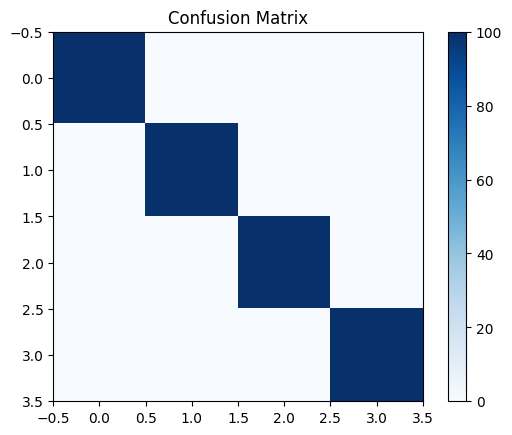

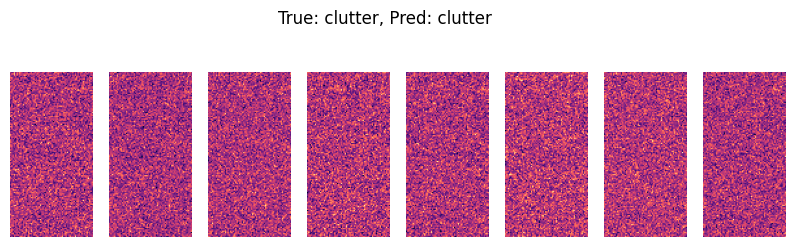

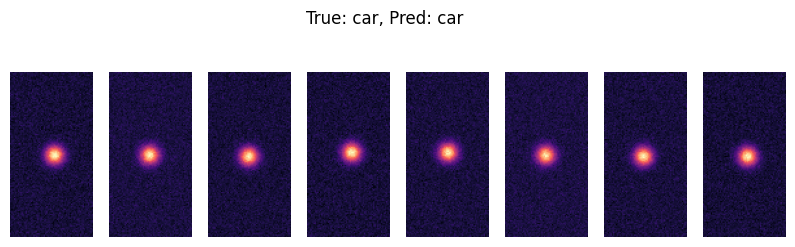

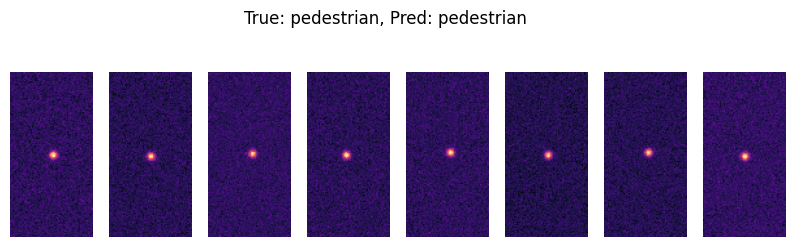

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import itertools

# -----------------------------
# Config
# -----------------------------
T, H, W, C = 8, 128, 64, 1
NUM_CLASSES = 4
CLASS_NAMES = ['pedestrian', 'car', 'drone', 'clutter']
SAMPLES_PER_CLASS = 500

# -----------------------------
# Synthetic frame generators (reuse from earlier pipeline)
# -----------------------------
def gaussian_blob(h, w, center, sigma=2.0, amplitude=1.0):
    cy, cx = center
    y = np.arange(h)[:, None]
    x = np.arange(w)[None, :]
    return amplitude * np.exp(-(((y-cy)**2 + (x-cx)**2)/(2*sigma**2)))

def make_pedestrian(h,w): return gaussian_blob(h,w,(h//2,w//2),sigma=2,amplitude=1.0)
def make_car(h,w): return gaussian_blob(h,w,(h//2,w//2),sigma=5,amplitude=1.5)
def make_drone(h,w): return gaussian_blob(h,w,(h//3,w//3),sigma=2,amplitude=0.8)+gaussian_blob(h,w,(2*h//3,2*w//3),sigma=2,amplitude=0.8)
def make_clutter(h,w): return np.random.rand(h,w)*0.2

GEN_FUNCS = [make_pedestrian, make_car, make_drone, make_clutter]

# -----------------------------
# Sequence generator
# -----------------------------
def generate_sequence(cls, T, h=H, w=W):
    seq = []
    base = GEN_FUNCS[cls](h,w)
    for t in range(T):
        # random shift to simulate motion
        shift_y, shift_x = np.random.randint(-2,3), np.random.randint(-2,3)
        frame = np.roll(np.roll(base, shift_y, axis=0), shift_x, axis=1)
        # add noise
        frame += np.random.normal(0,0.05,(h,w))
        # normalize
        frame = (frame - frame.min())/(frame.max()-frame.min()+1e-6)
        seq.append(frame)
    return np.array(seq)[...,None]  # shape (T,H,W,1)

def generate_dataset(n_per_class):
    X, y = [], []
    for cls in range(NUM_CLASSES):
        for _ in range(n_per_class):
            X.append(generate_sequence(cls,T))
            y.append(cls)
    return np.array(X), np.array(y)

# -----------------------------
# Build CNN+LSTM model
# -----------------------------
def build_model():
    frame_cnn = models.Sequential([
        layers.Conv2D(32,(3,3),activation='relu',padding='same'),
        layers.MaxPooling2D((2,2)),
        layers.Conv2D(64,(3,3),activation='relu',padding='same'),
        layers.MaxPooling2D((2,2)),
        layers.GlobalAveragePooling2D()
    ])
    inputs = layers.Input(shape=(T,H,W,C))
    x = layers.TimeDistributed(frame_cnn)(inputs)
    x = layers.LSTM(128)(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(NUM_CLASSES,activation='softmax')(x)
    model = models.Model(inputs,outputs)
    model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
    return model

# -----------------------------
# Train and evaluate
# -----------------------------
X,y = generate_dataset(SAMPLES_PER_CLASS)
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=42)

model = build_model()
model.summary()
history = model.fit(X_train,y_train,validation_split=0.2,epochs=10,batch_size=32)

# Evaluate
test_loss,test_acc = model.evaluate(X_test,y_test)
print("Test accuracy:",test_acc)

# Confusion matrix
y_pred = np.argmax(model.predict(X_test),axis=1)
cm = confusion_matrix(y_test,y_pred)
plt.imshow(cm,cmap='Blues')
plt.title("Confusion Matrix")
plt.colorbar()
plt.show()

# Visualize predictions
for i in range(3):
    seq = X_test[i]
    pred = CLASS_NAMES[y_pred[i]]
    true = CLASS_NAMES[y_test[i]]
    plt.figure(figsize=(10,3))
    for t in range(T):
        plt.subplot(1,T,t+1)
        plt.imshow(seq[t,:,:,0],cmap='magma')
        plt.axis('off')
    plt.suptitle(f"True: {true}, Pred: {pred}")
    plt.show()

### 3.1.3 Generative Adversarial Networks (GAN)
GANs can fill data gaps, balance classes, and stress-test models by producing plausible range–Doppler maps. The discriminator pushes realism; the generator learns to mimic the distribution of real radar scenes.

Core idea and losses
- Generator: $G(z)\rightarrow \hat {x}$ where $z\sim \mathcal{N}(0,I)$ or $\mathcal{U}(-1,1)$.
- Discriminator: $D(x)\rightarrow [0,1]$ for real/fake probability.
- Non-saturating GAN losses:
- Generator: $\mathcal{L_{\mathnormal{G}}}=-\mathbb{E}[\log D(G(z))]$
- Discriminator: $\mathcal{L_{\mathnormal{D}}}=-\mathbb{E}[\log D(x)]-\mathbb{E}[\log (1-D(G(z)))]$
For radar, stability improves with DCGAN/WGAN-GP, spectral norm, and careful normalization of inputs.

Practical design for range–Doppler maps
- Input normalization: Scale maps to [−1, 1] for tanh output.
- Generator (DCGAN): Transposed convolutions with BatchNorm and ReLU; final tanh.
- Discriminator: Strided convolutions with LeakyReLU; optional spectral normalization; final sigmoid (or linear for WGAN).
- Conditioning (optional cGAN): Concatenate class embedding into generator/discriminator to synthesize class-specific maps (e.g., car, pedestrian, drone).

**Purpose**: Generate synthetic radar data for training

**Architecture**:
- Generator: $G(z) \rightarrow$ synthetic radar map
- Discriminator: $D(x) \rightarrow$ real or fake probability

**Loss Functions**:
- Generator loss: $\mathcal{L}_G = -\mathbb{E}[\log D(G(z))]$
- Discriminator loss: $\mathcal{L}_D = -\mathbb{E}[\log D(x)] - \mathbb{E}[\log(1-D(G(z)))]$

---

2025-11-25 19:59:07.465424: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 1/20 | D: 1.501 | G: 3.424


2025-11-25 19:59:50.182380: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 2/20 | D: 0.824 | G: 5.135
Epoch 3/20 | D: 0.404 | G: 6.139


2025-11-25 20:01:21.949922: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 4/20 | D: 0.195 | G: 5.714
Epoch 5/20 | D: 0.673 | G: 6.971


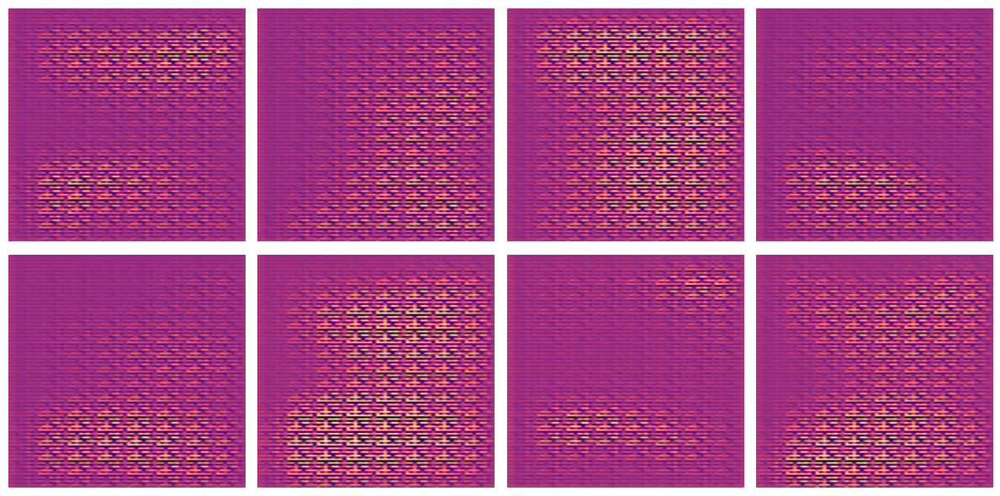

Epoch 6/20 | D: 0.655 | G: 3.714
Epoch 7/20 | D: 0.719 | G: 3.562


2025-11-25 20:04:19.693767: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 8/20 | D: 0.358 | G: 3.843
Epoch 9/20 | D: 0.262 | G: 4.147
Epoch 10/20 | D: 0.861 | G: 5.454


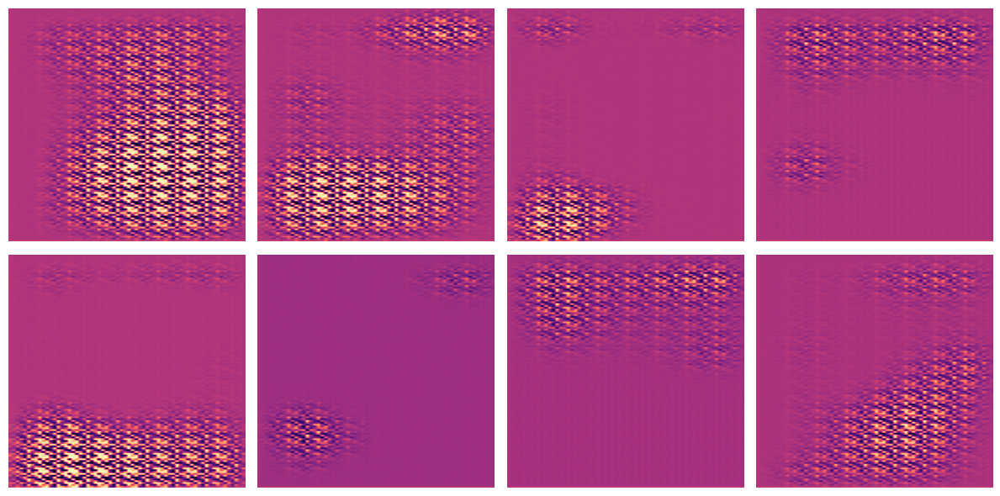

Epoch 11/20 | D: 0.559 | G: 6.807


KeyboardInterrupt: 

In [13]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

# -----------------------------
# Config
# -----------------------------
H, W, C = 128, 64, 1     # radar map size
LATENT_DIM = 128
BATCH_SIZE = 32
EPOCHS = 20

# -----------------------------
# Generator
# -----------------------------
def build_generator(latent_dim=LATENT_DIM):
    inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense((H//8)*(W//8)*256)(inputs)
    x = layers.Reshape((H//8, W//8, 256))(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(32, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    outputs = layers.Conv2D(C, (3,3), padding='same', activation='tanh')(x)
    return models.Model(inputs, outputs, name="Generator")

# -----------------------------
# Discriminator
# -----------------------------
def build_discriminator():
    inputs = layers.Input(shape=(H, W, C))
    x = layers.Conv2D(64, (5,5), strides=(2,2), padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, (5,5), strides=(2,2), padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, (5,5), strides=(2,2), padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    return models.Model(inputs, outputs, name="Discriminator")

# -----------------------------
# Build models
# -----------------------------
generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy()
g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
d_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# -----------------------------
# Training step
# -----------------------------
@tf.function
def train_step(real_batch):
    batch_size = tf.shape(real_batch)[0]
    random_latent = tf.random.normal((batch_size, LATENT_DIM))

    # Train Discriminator
    with tf.GradientTape() as d_tape:
        fake_images = generator(random_latent, training=True)
        d_real = discriminator(real_batch, training=True)
        d_fake = discriminator(fake_images, training=True)
        d_loss_real = cross_entropy(tf.ones_like(d_real), d_real)
        d_loss_fake = cross_entropy(tf.zeros_like(d_fake), d_fake)
        d_loss = d_loss_real + d_loss_fake
    d_grads = d_tape.gradient(d_loss, discriminator.trainable_variables)
    d_optimizer.apply_gradients(zip(d_grads, discriminator.trainable_variables))

    # Train Generator
    random_latent = tf.random.normal((batch_size, LATENT_DIM))
    with tf.GradientTape() as g_tape:
        fake_images = generator(random_latent, training=True)
        d_fake = discriminator(fake_images, training=True)
        g_loss = cross_entropy(tf.ones_like(d_fake), d_fake)
    g_grads = g_tape.gradient(g_loss, generator.trainable_variables)
    g_optimizer.apply_gradients(zip(g_grads, generator.trainable_variables))

    return d_loss, g_loss

# -----------------------------
# Visualization
# -----------------------------
def visualize_samples(batch, n=8):
    imgs = batch[:n].numpy()
    imgs = (imgs + 1.0) / 2.0  # back to [0,1]
    cols = 4; rows = int(np.ceil(n/cols))
    plt.figure(figsize=(12, 3*rows))
    for i in range(n):
        plt.subplot(rows, cols, i+1)
        plt.imshow(imgs[i, :, :, 0], cmap='magma', aspect='auto')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# -----------------------------
# Training loop
# -----------------------------
def train_gan(X_real, epochs=EPOCHS, batch_size=BATCH_SIZE, sample_every=5):
    dataset = tf.data.Dataset.from_tensor_slices(X_real).shuffle(len(X_real)).batch(batch_size)
    for epoch in range(1, epochs+1):
        for real_batch in dataset:
            d_loss, g_loss = train_step(real_batch)
        print(f"Epoch {epoch}/{epochs} | D: {d_loss:.3f} | G: {g_loss:.3f}")
        if epoch % sample_every == 0:
            random_latent = tf.random.normal((batch_size, LATENT_DIM))
            fake = generator(random_latent, training=False)
            visualize_samples(fake)

# -----------------------------
# Example run with synthetic data
# -----------------------------
if __name__ == "__main__":
    # Synthetic dataset (replace with real radar maps if available)
    X_real = np.random.rand(500, H, W, C).astype("float32")
    X_real = 2.0 * X_real - 1.0  # scale to [-1,1]

    train_gan(X_real, epochs=20, batch_size=32, sample_every=5)

2025-11-25 20:08:04.211106: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-25 20:08:06.052195: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-25 20:08:06.932153: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764130087.734071    9745 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764130087.918610    9745 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-25 20:08:09.935865: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Epoch 1/10 | D: 1.168 | G: 2.228


2025-11-25 20:10:57.481778: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 2/10 | D: 1.746 | G: 1.914


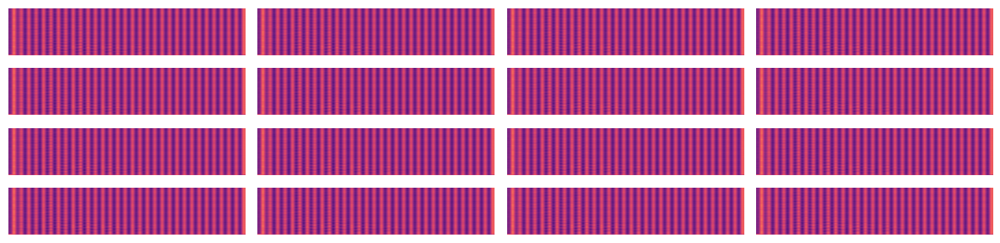

Epoch 3/10 | D: 0.911 | G: 3.202


2025-11-25 20:12:17.995840: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 4/10 | D: 0.106 | G: 4.305


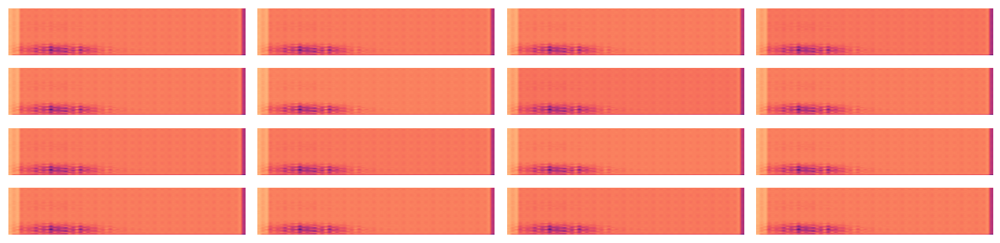

Epoch 5/10 | D: 0.624 | G: 0.564
Epoch 6/10 | D: 0.933 | G: 4.546


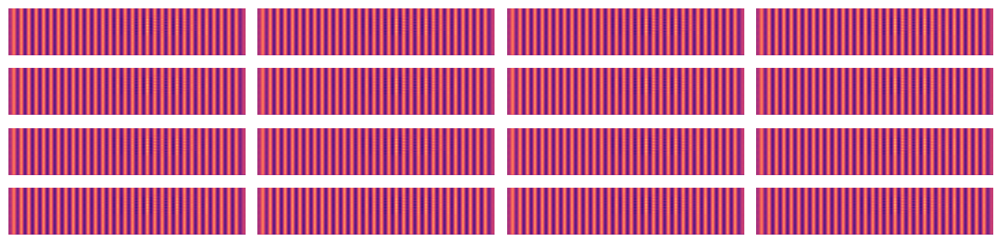

Epoch 7/10 | D: 0.477 | G: 4.705


2025-11-25 20:15:01.313497: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 8/10 | D: 0.220 | G: 5.647


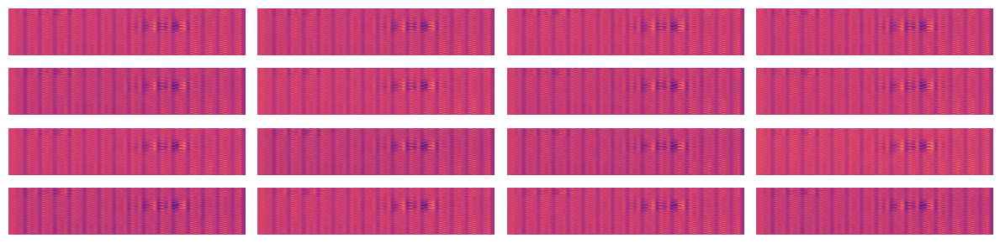

Epoch 9/10 | D: 1.594 | G: 4.714
Epoch 10/10 | D: 0.573 | G: 6.156


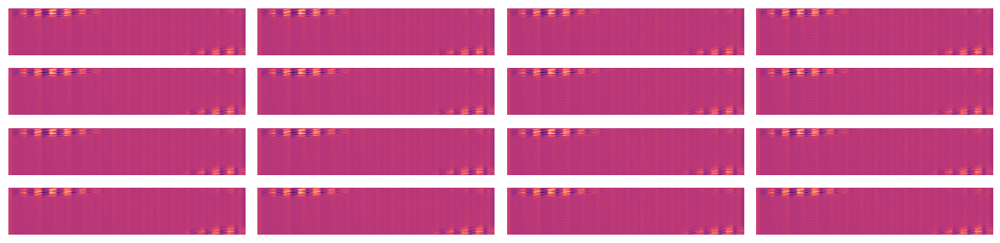

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

# -----------------------------
# Config
# -----------------------------
H, W, C = 128, 64, 1
LATENT_DIM = 100
NUM_CLASSES = 4
CLASS_NAMES = ['pedestrian','car','drone','clutter']
BATCH_SIZE = 32
EPOCHS = 20

# -----------------------------
# Generator (conditional)
# -----------------------------
def build_generator(latent_dim=LATENT_DIM, num_classes=NUM_CLASSES):
    noise = layers.Input(shape=(latent_dim,))
    label = layers.Input(shape=(1,), dtype='int32')

    # Embed label
    label_embedding = layers.Embedding(num_classes, latent_dim)(label)
    label_embedding = layers.Flatten()(label_embedding)

    # Combine noise + label
    merged = layers.multiply([noise, label_embedding])

    x = layers.Dense((H//8)*(W//8)*256)(merged)
    x = layers.Reshape((H//8, W//8, 256))(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(32, (5,5), strides=(2,2), padding='same')(x)
    x = layers.BatchNormalization()(x); x = layers.ReLU()(x)

    out = layers.Conv2D(C, (3,3), padding='same', activation='tanh')(x)
    return models.Model([noise,label], out, name="Generator")

# -----------------------------
# Discriminator (conditional)
# -----------------------------
def build_discriminator(num_classes=NUM_CLASSES):
    img = layers.Input(shape=(H,W,C))
    label = layers.Input(shape=(1,), dtype='int32')

    # Embed label and reshape to image size
    label_embedding = layers.Embedding(num_classes, H*W)(label)
    label_embedding = layers.Flatten()(label_embedding)
    label_embedding = layers.Reshape((H,W,1))(label_embedding)

    # Concatenate image + label channel
    merged = layers.Concatenate(axis=-1)([img, label_embedding])

    x = layers.Conv2D(64,(5,5),strides=(2,2),padding='same')(merged)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128,(5,5),strides=(2,2),padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256,(5,5),strides=(2,2),padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dropout(0.3)(x)
    out = layers.Dense(1,activation='sigmoid')(x)
    return models.Model([img,label], out, name="Discriminator")

# -----------------------------
# Build models
# -----------------------------
generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy()
g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
d_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# -----------------------------
# Training step
# -----------------------------
@tf.function
def train_step(real_batch, real_labels):
    batch_size = tf.shape(real_batch)[0]
    random_latent = tf.random.normal((batch_size, LATENT_DIM))
    random_labels = tf.random.uniform((batch_size,1),minval=0,maxval=NUM_CLASSES,dtype=tf.int32)

    # Train Discriminator
    with tf.GradientTape() as d_tape:
        fake_images = generator([random_latent, random_labels], training=True)
        d_real = discriminator([real_batch, real_labels], training=True)
        d_fake = discriminator([fake_images, random_labels], training=True)
        d_loss_real = cross_entropy(tf.ones_like(d_real), d_real)
        d_loss_fake = cross_entropy(tf.zeros_like(d_fake), d_fake)
        d_loss = d_loss_real + d_loss_fake
    d_grads = d_tape.gradient(d_loss, discriminator.trainable_variables)
    d_optimizer.apply_gradients(zip(d_grads, discriminator.trainable_variables))

    # Train Generator
    random_latent = tf.random.normal((batch_size, LATENT_DIM))
    random_labels = tf.random.uniform((batch_size,1),minval=0,maxval=NUM_CLASSES,dtype=tf.int32)
    with tf.GradientTape() as g_tape:
        fake_images = generator([random_latent, random_labels], training=True)
        d_fake = discriminator([fake_images, random_labels], training=True)
        g_loss = cross_entropy(tf.ones_like(d_fake), d_fake)
    g_grads = g_tape.gradient(g_loss, generator.trainable_variables)
    g_optimizer.apply_gradients(zip(g_grads, generator.trainable_variables))

    return d_loss, g_loss

# -----------------------------
# Visualization
# -----------------------------
def visualize_class_samples(generator, n=4):
    plt.figure(figsize=(12,3))
    for cls in range(NUM_CLASSES):
        noise = tf.random.normal((n,LATENT_DIM))
        labels = tf.constant([[cls]]*n)
        imgs = generator([noise,labels], training=False).numpy()
        imgs = (imgs+1)/2.0
        for i in range(n):
            plt.subplot(NUM_CLASSES,n,cls*n+i+1)
            plt.imshow(imgs[i,:,:,0],cmap='magma',aspect='auto')
            plt.axis('off')
            if i==0: plt.ylabel(CLASS_NAMES[cls])
    plt.tight_layout(); plt.show()

# -----------------------------
# Training loop
# -----------------------------
def train_cgan(X_real, y_real, epochs=EPOCHS, batch_size=BATCH_SIZE, sample_every=5):
    dataset = tf.data.Dataset.from_tensor_slices((X_real,y_real)).shuffle(len(X_real)).batch(batch_size)
    for epoch in range(1,epochs+1):
        for real_batch, real_labels in dataset:
            d_loss,g_loss = train_step(real_batch, tf.expand_dims(real_labels,1))
        print(f"Epoch {epoch}/{epochs} | D: {d_loss:.3f} | G: {g_loss:.3f}")
        if epoch % sample_every==0:
            visualize_class_samples(generator)

# -----------------------------
# Example run with synthetic data
# -----------------------------
if __name__=="__main__":
    # Fake radar dataset: random noise with labels
    X_real = np.random.rand(500,H,W,C).astype("float32")
    X_real = 2.0*X_real - 1.0
    y_real = np.random.randint(0,NUM_CLASSES,size=(500,))
    train_cgan(X_real,y_real,epochs=10,batch_size=32,sample_every=2)


DATA-DRIVEN MODELS FOR RADAR - PYTHON EXAMPLES

1. SYNTHETIC RADAR DATASET GENERATION
--------------------------------------------------------------------------------
Generating 100 samples per class...
Dataset shape per class: 100 samples of 64×128

2. FEATURE EXTRACTION FROM RADAR DATA
--------------------------------------------------------------------------------
Extracting features from dataset...


/tmp/ipykernel_12701/3390925923.py:85: RuntimeWarning: invalid value encountered in log
  entropy = -np.sum(rd_normalized * np.log(rd_normalized + 1e-6))


Feature matrix shape: (400, 7)
Features extracted: ['mean_power', 'max_power', 'std_power', 'range_energy', 'doppler_energy', 'num_peaks', 'entropy']

3. SIMPLE NEURAL NETWORK FOR RADAR CLASSIFICATION
--------------------------------------------------------------------------------
Network configuration:
  Input size: 7 (features)
  Hidden size: 32
  Output size: 4 (classes)
Training for 100 epochs...
  Epoch 10/100, Loss: nan
  Epoch 20/100, Loss: nan
  Epoch 30/100, Loss: nan
  Epoch 40/100, Loss: nan
  Epoch 50/100, Loss: nan
  Epoch 60/100, Loss: nan
  Epoch 70/100, Loss: nan
  Epoch 80/100, Loss: nan
  Epoch 90/100, Loss: nan
  Epoch 100/100, Loss: nan

Training accuracy: 25.00%


/tmp/ipykernel_12701/3390925923.py:203: RuntimeWarning: invalid value encountered in log10
  im = ax.imshow(10*np.log10(rd_map + 1e-6), cmap='jet', origin='lower')


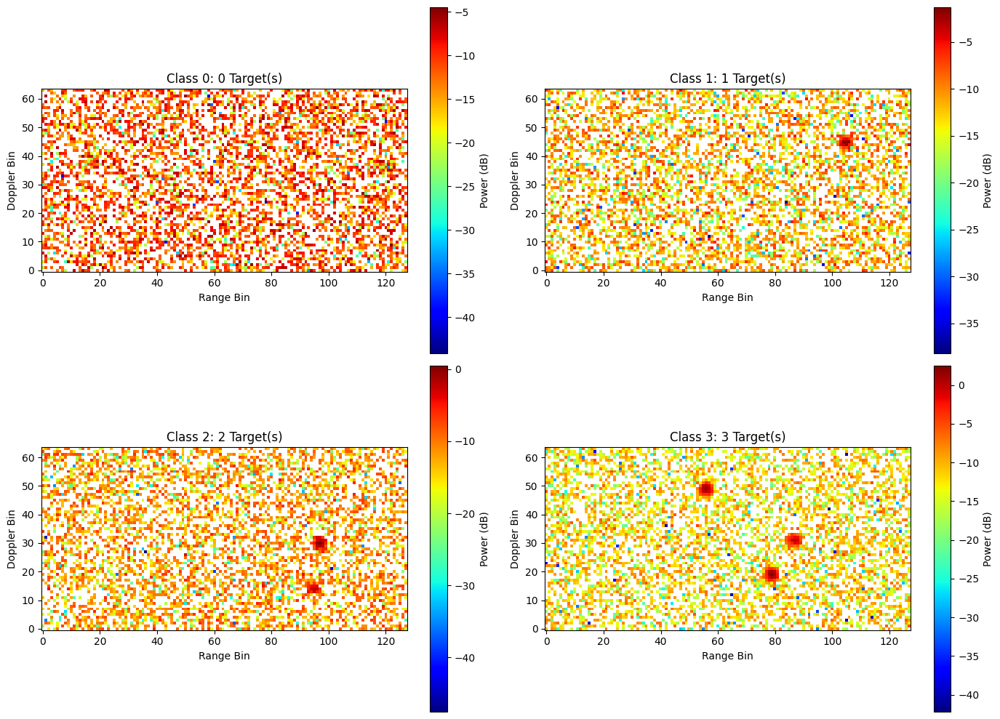

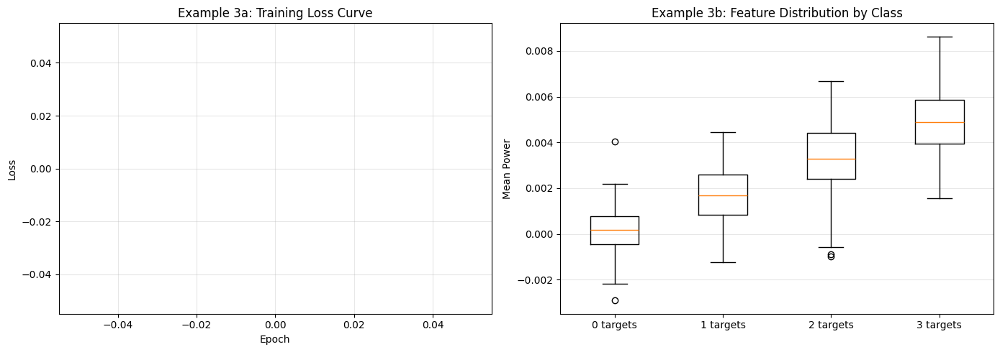


Data-driven model examples complete!


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

print("\n" + "=" * 80)
print("DATA-DRIVEN MODELS FOR RADAR - PYTHON EXAMPLES")
print("=" * 80)

# ============================================================================
# EXAMPLE 1: SYNTHETIC RADAR DATA GENERATION
# ============================================================================
print("\n1. SYNTHETIC RADAR DATASET GENERATION")
print("-" * 80)

def generate_radar_range_doppler_map(num_targets=3, noise_level=0.1, 
                                     range_bins=128, doppler_bins=64):
    """
    Generate synthetic range-Doppler map with targets
    """
    rd_map = noise_level * np.random.randn(doppler_bins, range_bins)
    
    # Add random targets
    for _ in range(num_targets):
        target_range = np.random.randint(10, range_bins-10)
        target_doppler = np.random.randint(10, doppler_bins-10)
        target_power = np.random.uniform(0.5, 2.0)
        
        # Add Gaussian-like target
        range_spread = 3
        doppler_spread = 3
        for r in range(max(0, target_range-range_spread), 
                      min(range_bins, target_range+range_spread)):
            for d in range(max(0, target_doppler-doppler_spread), 
                          min(doppler_bins, target_doppler+doppler_spread)):
                distance = np.sqrt((r-target_range)**2 + (d-target_doppler)**2)
                rd_map[d, r] += target_power * np.exp(-distance**2 / 4)
    
    return rd_map

# Generate dataset
num_samples = 100
num_targets_list = [0, 1, 2, 3]  # Different classes: no target, 1, 2, 3 targets
dataset = {}
labels = {}

print(f"Generating {num_samples} samples per class...")
for num_targets in num_targets_list:
    dataset[num_targets] = []
    labels[num_targets] = []
    for sample_idx in range(num_samples):
        rd_map = generate_radar_range_doppler_map(num_targets=num_targets)
        dataset[num_targets].append(rd_map)
        labels[num_targets].append(num_targets)

print(f"Dataset shape per class: {num_samples} samples of 64×128")

# ============================================================================
# EXAMPLE 2: FEATURE EXTRACTION FROM RADAR DATA
# ============================================================================
print("\n2. FEATURE EXTRACTION FROM RADAR DATA")
print("-" * 80)

def extract_radar_features(rd_map):
    """Extract hand-crafted features from range-Doppler map"""
    features = {}
    
    # 1. Statistics
    features['mean_power'] = np.mean(rd_map)
    features['max_power'] = np.max(rd_map)
    features['std_power'] = np.std(rd_map)
    
    # 2. Energy in different regions
    range_profile = np.mean(rd_map, axis=0)
    doppler_profile = np.mean(rd_map, axis=1)
    features['range_energy'] = np.sum(range_profile**2)
    features['doppler_energy'] = np.sum(doppler_profile**2)
    
    # 3. Peak detection
    threshold = np.mean(rd_map) + 2*np.std(rd_map)
    num_peaks = np.sum(rd_map > threshold)
    features['num_peaks'] = num_peaks
    
    # 4. Entropy
    rd_normalized = rd_map / (np.sum(rd_map) + 1e-6)
    entropy = -np.sum(rd_normalized * np.log(rd_normalized + 1e-6))
    features['entropy'] = entropy
    
    return features

# Extract features for dataset
print(f"Extracting features from dataset...")
all_features = []
all_labels = []

for num_targets in num_targets_list:
    for rd_map, label in zip(dataset[num_targets], labels[num_targets]):
        features = extract_radar_features(rd_map)
        all_features.append(list(features.values()))
        all_labels.append(label)

all_features = np.array(all_features)
all_labels = np.array(all_labels)

print(f"Feature matrix shape: {all_features.shape}")
print(f"Features extracted: {list(extract_radar_features(dataset[1][0]).keys())}")

# ============================================================================
# EXAMPLE 3: SIMPLE NEURAL NETWORK (NUMPY IMPLEMENTATION)
# ============================================================================
print("\n3. SIMPLE NEURAL NETWORK FOR RADAR CLASSIFICATION")
print("-" * 80)

class SimpleNeuralNetwork:
    """Simple neural network for demonstration"""
    
    def __init__(self, input_size, hidden_size, num_classes):
        # Initialize weights
        self.W1 = np.random.randn(input_size, hidden_size) * 0.01
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, num_classes) * 0.01
        self.b2 = np.zeros((1, num_classes))
        self.losses = []
    
    def relu(self, x):
        return np.maximum(0, x)
    
    def relu_derivative(self, x):
        return (x > 0).astype(float)
    
    def softmax(self, x):
        exp_x = np.exp(x - np.max(x, axis=1, keepdims=True))
        return exp_x / np.sum(exp_x, axis=1, keepdims=True)
    
    def forward(self, X):
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = self.relu(self.z1)
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = self.softmax(self.z2)
        return self.a2
    
    def backward(self, X, y, learning_rate):
        m = X.shape[0]
        
        # One-hot encoding
        y_one_hot = np.zeros((m, 4))
        y_one_hot[np.arange(m), y] = 1
        
        # Backpropagation
        dz2 = self.a2 - y_one_hot
        dW2 = np.dot(self.a1.T, dz2) / m
        db2 = np.sum(dz2, axis=0, keepdims=True) / m
        
        da1 = np.dot(dz2, self.W2.T)
        dz1 = da1 * self.relu_derivative(self.z1)
        dW1 = np.dot(X.T, dz1) / m
        db1 = np.sum(dz1, axis=0, keepdims=True) / m
        
        # Update weights
        self.W1 -= learning_rate * dW1
        self.b1 -= learning_rate * db1
        self.W2 -= learning_rate * dW2
        self.b2 -= learning_rate * db2
        
        # Compute loss
        loss = -np.mean(np.sum(y_one_hot * np.log(self.a2 + 1e-6), axis=1))
        self.losses.append(loss)
    
    def train(self, X, y, epochs=50, learning_rate=0.01):
        print(f"Training for {epochs} epochs...")
        for epoch in range(epochs):
            self.forward(X)
            self.backward(X, y, learning_rate)
            if (epoch + 1) % 10 == 0:
                print(f"  Epoch {epoch+1}/{epochs}, Loss: {self.losses[-1]:.4f}")
    
    def predict(self, X):
        output = self.forward(X)
        return np.argmax(output, axis=1)

# Train network
print(f"Network configuration:")
print(f"  Input size: {all_features.shape[1]} (features)")
print(f"  Hidden size: 32")
print(f"  Output size: 4 (classes)")

nn = SimpleNeuralNetwork(all_features.shape[1], 32, 4)
nn.train(all_features, all_labels, epochs=100, learning_rate=0.1)

# Test accuracy
predictions = nn.predict(all_features)
accuracy = np.mean(predictions == all_labels)
print(f"\nTraining accuracy: {accuracy*100:.2f}%")

# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Sample range-Doppler maps from each class
for class_idx, num_targets in enumerate(num_targets_list):
    rd_map = dataset[num_targets][0]
    ax = axes[class_idx//2, class_idx%2]
    im = ax.imshow(10*np.log10(rd_map + 1e-6), cmap='jet', origin='lower')
    ax.set_title(f'Class {num_targets}: {num_targets} Target(s)')
    ax.set_xlabel('Range Bin')
    ax.set_ylabel('Doppler Bin')
    plt.colorbar(im, ax=ax, label='Power (dB)')

plt.tight_layout()
plt.savefig('radar_ml_1.png', dpi=150, bbox_inches='tight')
plt.show()

# Plot 2: Training loss curve
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(nn.losses, 'b-', linewidth=1.5)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Example 3a: Training Loss Curve')
axes[0].grid(True, alpha=0.3)

# Plot 3: Feature distribution
feature_names = ['Mean Power', 'Max Power', 'Std Power', 'Range Energy', 'Doppler Energy', 'Num Peaks', 'Entropy']
axes[1].boxplot([all_features[all_labels==i, 0] for i in range(4)],
               labels=[f'{i} targets' for i in range(4)])
axes[1].set_ylabel('Mean Power')
axes[1].set_title('Example 3b: Feature Distribution by Class')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('radar_ml_2.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nData-driven model examples complete!")

## RL models
Reinforcement Learning (RL) models are increasingly being applied to radar systems to enhance their performance and automation. Here are some key aspects and examples of RL models in radar applications:

   - Key Aspects
      - Automatic Radar Detection: RL can be used to automatically adjust radar detection parameters, improving efficiency, precision, and automation. Traditional manual adjustment methods are often inadequate for modern radar systems, and RL offers a promising solution.
      - Radar-Evasive Path Planning: RL algorithms can be used to find optimal paths for aircraft to avoid or minimize radar detection and tracking. This involves creating a virtual environment and using RL algorithms like Deep Deterministic Policy Gradient (DDPG), Trust Region Policy Optimization (TRPO), and Proximal Policy Optimization (PPO) to generate optimal trajectories.
      - Radar Resource Management (RRM): RL methods can address RRM problems by enabling software agents to learn from interactions without relying on pre-developed models. This approach allows for more adaptive and efficient radar resource management.
   - Example Models
      - Deep Q-Network (DQN): Used for decision-making tasks in radar systems, such as optimizing radar parameters and resource allocation.
      - Policy Gradient Methods: Algorithms like PPO and TRPO are used for path planning and trajectory optimization in radar-evasive applications.
      - Meta-Reinforcement Learning: Combines offline RL and meta-RL methods to address the sample requirements of RL in radar control tasks, promoting practical applications of RL in radar operation.

These RL models and techniques are transforming radar systems, enabling more accurate, efficient, and automated radar operations.

## Radar datasets
Here are some radar datasets that you might find useful:
   1. Awesome Radar Perception: A curated list of radar datasets, detection, tracking, and fusion. This repository includes datasets like nuScenes, DENSE, PixSet, Radar Scenes, Pointillism, and more. It also provides information on radar signature calibration, labeling, augmentation, and applications. 
   2. Open Radar Datasets: This GitHub repository is part of the Open Radar Initiative and includes datasets like the Outdoor Moving Object Dataset and the Assisted Living Dataset. These datasets contain doppler spectra and other useful information for radar research.
   3. Real Doppler RAD-DAR Database: Available on Kaggle, this dataset includes radar data captured with a state-of-the-art ubiquitous doppler radar. It provides valuable data for radar signal processing and analysis.

These datasets can be used for various radar applications, including autonomous driving, human activity recognition, and more.

## MUSIC algorithm
The MUSIC (MUltiple SIgnal Classification) algorithm is a high-resolution technique used for frequency estimation and direction finding in radar systems. Here's a brief overview:

   - Key Features
      - Frequency Estimation: MUSIC can accurately estimate the frequencies of multiple signals, even in the presence of noise.
      - Direction Finding: It is widely used for estimating the direction of arrival (DOA) of signals, making it valuable in radar and communication systems.
      - Subspace Method: MUSIC is a subspace-based algorithm that decomposes the sensor covariance matrix into signal and noise subspaces.
   - How It Works
      - Signal Model: The received signal is modeled as a combination of multiple complex exponentials (signals) and Gaussian white noise.
      - Covariance Matrix: The algorithm computes the covariance matrix of the received signal.
      - Eigenvalue Decomposition: The covariance matrix is decomposed into eigenvalues and eigenvectors, separating the signal and noise subspaces.
      - Spectrum Estimation: The MUSIC spectrum is computed by projecting the steering vectors onto the noise subspace. Peaks in the spectrum correspond to the frequencies or directions of the signals.
   - Applications
      - Radar Systems: Used for target detection and tracking by estimating the direction of incoming signals.
      - Communication Systems: Helps in beamforming and interference mitigation by accurately estimating signal directions.
      - Sonar Systems: Applied in underwater acoustics for detecting and locating objects.

# Radar chips
Radar chips, also known as radar sensors or radar modules, are essential components in various applications, including automotive, industrial, and consumer electronics. Here are a few notable examples:
1. Texas Instruments (TI): TI offers a broad portfolio of mmWave radar sensors, including 60-GHz and 77-GHz devices. These sensors are designed for automotive and industrial applications, providing high resolution, long range, and edge intelligence.
2. Infineon Technologies: Infineon's XENSIV™ radar sensors are used in automotive, IoT, and industrial applications. They offer a range of mmWave radar sensors, including 24GHz, 60GHz, and 77/79GHz, with capabilities such as direction, proximity, and speed detection.
3. Automotive Applications: Radar chips are widely used in automotive applications for features like adaptive cruise control, collision avoidance, and parking assistance. TI's automotive mmWave radar sensors, for example, provide high precision and versatility for dynamic driving scenarios.

These radar chips enable advanced sensing capabilities, making them crucial for various modern technologies.

## Compare
Let's compare radar chips from Texas Instruments (TI), NXP, and Infineon based on some key features:

- Texas Instruments (TI)
   - Product Line: TI offers a range of mmWave radar sensors, including the IWR6843 and AWR1843.
   - Frequency: 60 GHz and 77 GHz.
   - Applications: Automotive, industrial, and consumer electronics.
   - Key Features: High resolution, long range, edge intelligence, and multiple receive antennas for better angle information.

- NXP
   - Product Line: NXP provides radar solutions like the MR3003 and MR2001.
   - Frequency: 24 GHz and 77 GHz.
   - Applications: Automotive, industrial, and smart home.
   - Key Features: High integration, low power consumption, and advanced signal processing capabilities.

- Infineon
   - Product Line: Infineon's XENSIV™ radar sensors, including the BGT24 and BGT60 series.
   - Frequency: 24 GHz, 60 GHz, and 77/79 GHz.
   - Applications: Automotive, industrial, IoT, and healthcare.
   - Key Features: Flexibility, on-chip monitoring functions, and support for various radar applications.

Each of these companies offers radar chips with unique features and capabilities, making them suitable for different applications.

## Radar chips with output raw data
Radar chips that output raw data are essential for applications requiring custom signal processing. Here are a few examples:

- Texas Instruments (TI): TI offers mmWave radar sensors that can output raw ADC data. For instance, the AWR2544 radar sensor provides raw data output, which can be processed using external tools like MATLAB for custom applications. TI's Mmwave Radar Device ADC Raw Data Capture application report provides detailed information on capturing and interpreting raw data.

   - AWR2243 Radar Sensor
       - Frequency Range: 76-81 GHz
       - Channels: 4 transmit (TX) and 4 receive (RX) channels
       - ADC Sampling Rate: Up to 45 Msps
       - Operating Temperature Range: -40°C to 140°C
       - Applications: Advanced Driver Assistance Systems (ADAS), automotive radar, and industrial applications
       - Cascading Capability: The AWR2243 supports cascading multiple chips to create a larger radar system with more antennas, improving target detection and resolution.
       - Applications: Automotive radar systems, including Adaptive Cruise Control, Collision Warning, Emergency Braking, and Autonomous Driving.
       - Interfaces: Ethernet, I2C, SPI, UART, GPIOs, and 2-lane LVDS interface for raw ADC data and debug instrumentation.
   - The AWR2243 can be used in a cascaded configuration, where multiple chips are synchronized to work together. This allows for enhanced performance and higher resolution in radar systems. You can find more details about the AWR2243 and its cascading capabilities in the AWR2243 Cascade Application Report and the Imaging Radar Using Cascaded mmWave Sensor Reference Design.


- Infineon Technologies: Infineon's XENSIV™ radar sensors, such as the BGT24 and BGT60 series, also support raw data output. These sensors are used in various applications, including automotive and industrial, where custom signal processing is required.

   - The BGT60 series from Infineon Technologies includes advanced 60 GHz radar sensors designed for various applications. One notable example is the BGT60TR13C. Here are some key features and specifications:
       - Frequency: 60 GHz
       - Bandwidth: 5.5 GHz
       - Channels: 1 transmit (TX) and 3 receive (RX) antennas
       - Package: Antenna-in-package (6.5 x 5.0 x 0.9 mm³)
       - Power Consumption: Less than 5 mW (duty cycle)
       - Interfaces: SPI (Serial Peripheral Interface) for sensor configuration and data acquisition
       - Applications: Presence detection, touchless interaction, vital sensing, and more
       - The BGT60TR13C enables ultra-wide bandwidth FMCW operation and can detect human targets up to 15 meters away, with high sensitivity allowing for the detection of sub-millimeter movements2.

   - The BGT24 series from Infineon Technologies includes advanced 24 GHz radar sensors designed for various applications. Here are some key features and specifications of the BGT24LTR22 and BGT24MTR12:
       - BGT24LTR22
           - Frequency Range: 24.0 GHz to 24.25 GHz
           - Channels: 2 transmit (TX) and 2 receive (RX) channels
           - Key Features:
               - Fully integrated low phase noise VCO
               - Medium power amplifier with variable output power
               - Integrated power detectors
               - Homodyne low noise quadrature receivers
               - Configurable analog baseband amplification stages
               - Low power consumption
               - Multimode operation (Master/Slave)
               - Single supply voltage 1.5V
               - Small footprint (3.63mm x 3.63mm)
               - Applications: Smart home appliances, drone collision avoidance, traffic monitoring, security applications.
       - BGT24MTR12
           - Frequency Range: 24.0 GHz to 24.25 GHz
           - Channels: 1 transmit (TX) and 2 receive (RX) channels
           - Key Features:
               - Fully integrated low phase noise VCO
               - Switchable prescaler with 1.5GHz and 23kHz output
               - On-chip power and temperature sensors
               - Gilbert-based homodyne quadrature receiver
               - Low noise figure (NFSSB: 12 dB)
               - High conversion gain (26 dB)
               - Single supply voltage 3.3V
               - Low power consumption (660 mW)
               - Small footprint (VQFN-32-9 leadless plastic package)
           - Applications: Police speed meters, street lighting projects, intelligent door openers, tank level meters, motion detectors, intruder alarms.

- NXP: NXP's radar solutions, like the MR3003 and MR2001, provide raw data output for applications that need high integration and low power consumption.

   - The MR3003 is a high-performance 77 GHz radar transceiver developed by NXP Semiconductors. Here are some key features and specifications:
       - Frequency Range: 76-81 GHz
       - Channels: 3 transmit (TX) and 4 receive (RX) channels
       - Resolution: High angular resolution with TX phase rotation
       - Performance: Low phase noise and linearity for powerful separation of objects, long detection range due to high output power and low noise figure
       - Package: WLCSP (Wafer Level Chip Scale Package) 7.7 x 9.2 mm
       - Interfaces: MIPI-CSI2, LVDS, and analog data interfaces
       - Applications: Automotive radar systems, including front and corner radar applications for automated driving
       - The MR3003 is designed for automotive applications, providing high resolution and long-range capabilities2.

   - The MR2001 is a high-performance 77 GHz radar transceiver chipset developed by NXP Semiconductors. Here are some key features and specifications:
       - Frequency Range: 76-77 GHz
       - Channels: 2 transmit (TX) and 3 receive (RX) channels
       - Performance: High integration, low power consumption, and advanced signal processing capabilities
       - Applications: Automotive radar systems, including long-range radar (LRR), mid-range radar (MRR), and short-range radar (SRR) applications
       - Package: Scalable three-package solution consisting of a VCO (voltage-controlled oscillator), a two-channel transmitter (MR2001T), and a three-channel receiver (MR2001R)
       - Interfaces: SPI (Serial Peripheral Interface) for control and communication
       - Power Consumption: Low power consumption of 2.5 W for the total transceiver
       - The MR2001 chipset is designed to support fast modulation with simultaneous active channels, providing excellent spatial resolution and detection accuracy2.

These radar chips enable advanced sensing capabilities and allow developers to implement custom signal processing algorithms.

# Lattice Avant vs Xilinx Ultrascale Zynq

- Lattice Avant
    - Frequency: Up to 25 Gbps SERDES
    - Logic Cells: Up to 637k
    - Memory: Up to 35.6 Mb embedded memory
    - Multipliers: Up to 7200 INT8 multipliers
    - External Memory Support: DDR4, LPDDR4, DDR5
    - Applications: AI/ML, computer vision, automotive sensor aggregation, industrial automation, aerospace
    - Key Features: High performance, low power consumption, advanced security features, small form factor2

- Xilinx Zynq UltraScale+
    - Frequency: Up to 1.5 GHz for Arm Cortex-A53, up to 600 MHz for Arm Cortex-R5F
    - Logic Cells: Up to 1.1 million
    - Memory: Up to 36 Mb UltraRAM, 35 Mb block RAM, 11 Mb distributed RAM
    - Multipliers: High DSP count for AI/ML and signal processing
    - External Memory Support: DDR4, LPDDR4, DDR3, LPDDR3
    - Applications: Advanced Driver Assistance Systems (ADAS), 5G wireless, industrial IoT, video processing, aerospace and defense
    - Key Features: Integrated ARM processors (Cortex-A53 and Cortex-R5F), GPU, high-speed interfaces, advanced security, and power management5

- Summary
    - Performance: Zynq UltraScale+ offers higher logic cell count and integrated ARM processors, making it suitable for high-performance applications requiring both processing power and FPGA flexibility.
    - Power Consumption: Lattice Avant is optimized for low power consumption, making it ideal for battery-operated and portable devices.
    - Applications: Both families are versatile, but Zynq UltraScale+ is more suited for applications requiring integrated processing power, while Lattice Avant excels in low-power, small form factor designs.

## Lattice Avant
The Lattice Avant platform is designed to deliver high performance, low power consumption, and small form factor FPGAs for various applications. Here are some key features and details about the Lattice Avant family:

- Lattice Avant-E
    - Optimized for Edge Processing Applications: The Avant-E family is built using the 16nm FinFET Avant platform, offering high performance and low power consumption.
    - System Logic Cells: Up to 637k
    - Embedded Memory: Up to 35.6 Mb
    - Multipliers: Up to 7200 INT8 multipliers
    - External Memory Support: LPDDR4/DDR4 at 1866 Mbps
    - Applications: Automotive, communications, compute, and industrial market segments
    - Key Features: High logic capacity, small package options, efficient edge AI processing, and fast configuration.

- Lattice Avant-X
    - High-Speed Mid-Range FPGA: The Avant-X family delivers up to 637k System Logic Cells and up to 28 – 25G SerDes within the smallest package footprint in its class.
    - System Logic Cells: Up to 637k
    - Embedded Memory: Up to 35.6 Mb
    - Multipliers: Up to 7200 INT8 multipliers
    - External Memory Support: LPDDR4/DDR4 up to 2400 Mbps and DDR5 up to 2100 Mbps
    - Applications: Industrial networking, AI/ML, computer vision, and more
    - Key Features: Fast and flexible SerDes, low power consumption, efficient edge AI processing, and advanced security features.

- Lattice Avant Platform
    - Foundation: Built on the 16nm FinFET platform, offering industry-leading low power and small form factor mid-range FPGAs.
    - Performance: Features class-leading 25 Gb/s SERDES, hardened PCI Express, and external memory PHY interfaces.
    - Applications: Automotive sensor aggregation, industrial automation, aerospace, AI/ML, and computer vision.
    - The Lattice Avant family provides a range of options for different applications, offering high performance, low power consumption, and advanced features.

---

# 4. Radar Signal Processing Pipeline - Best Practices

## 4.1 End-to-End Radar Processing

```
Transmitted Signal
       ↓
[Radar Front-End] → RF signals
       ↓
[A/D Conversion] → Digital samples
       ↓
[Range Compression] → Matched filtering
       ↓
[Doppler Processing] → Velocity estimation
       ↓
[CFAR Detection] → Target detection
       ↓
[Tracking & Fusion] → Multi-object tracking
```

## 4.2 Key Design Considerations

### Signal Processing
1. **Sampling Rate**: Nyquist criterion - $f_s \geq 2 B$ (at minimum)
2. **Integration Time**: Balance SNR gain vs. target dynamics
3. **Clutter Rejection**: Use adaptive techniques for varying environments
4. **Target Ambiguities**: Resolve range-Doppler ambiguities

### Hardware
1. **Antenna Design**: Optimize gain, beamwidth, sidelobe levels
2. **RF Components**: Minimize noise figure, linearity
3. **ADC Resolution**: 12-16 bits typical for radar
4. **Processing Power**: GPU/FPGA for real-time processing

### Algorithm Selection
1. **DOA Estimation**: MUSIC for high accuracy, Bartlett for simplicity
2. **Tracking**: Kalman filter for single target, JPDA for multi-target
3. **Classification**: CNN for images, SVM for features
4. **Parameter Estimation**: MLE for optimal performance

## 4.3 Common Challenges and Solutions

| Challenge | Solution |
|-----------|----------|
| Clutter suppression | MTI filtering, adaptive beamforming |
| Target masking | Multi-resolution processing, coherent integration |
| Multipath propagation | Waveform diversity, spatial filtering |
| Computational load | GPU acceleration, efficient algorithms |
| False alarms | CFAR detection, tracking confirmation |

## 4.4 Performance Metrics

1. **Detection Performance**: $P_d$ (Probability of Detection), $P_{fa}$ (False Alarm Rate)
2. **Estimation Accuracy**: $\Delta R$ (range error), $\Delta v$ (velocity error)
3. **Resolution**: Range resolution, Doppler resolution, Angular resolution
4. **Ambiguities**: Range ambiguity, velocity ambiguity
5. **Processing Efficiency**: Latency, computational complexity

---


PRACTICAL RADAR IMPLEMENTATION - BEST PRACTICES

1. COMPLETE RADAR PROCESSING CHAIN
--------------------------------------------------------------------------------
Radar System Configuration:
  Sampling frequency: 50 MHz
  Carrier frequency: 10.0 GHz
  PRF: 5000 Hz
  Coherent pulses: 32
  Chirp bandwidth: 100 MHz
  Range resolution: 1.50 m
  Doppler resolution: 156.2 Hz

2. RADAR PERFORMANCE METRICS
--------------------------------------------------------------------------------
Performance Metrics (Typical Radar):
  Transmit power: 40 dBW
  Antenna gain: 35 dB
  Target RCS: 0 dBsm
  SNR threshold: 13 dB
  → Maximum range: 0.0 km
  → Min detectable power: 72.02 dBm

3. ALGORITHM PERFORMANCE COMPARISON
--------------------------------------------------------------------------------

Algorithm       Resolution   Complexity   Robustness   SNR (dB)    
-----------------------------------------------------------------
Bartlett        4            1            8            20          
MVD

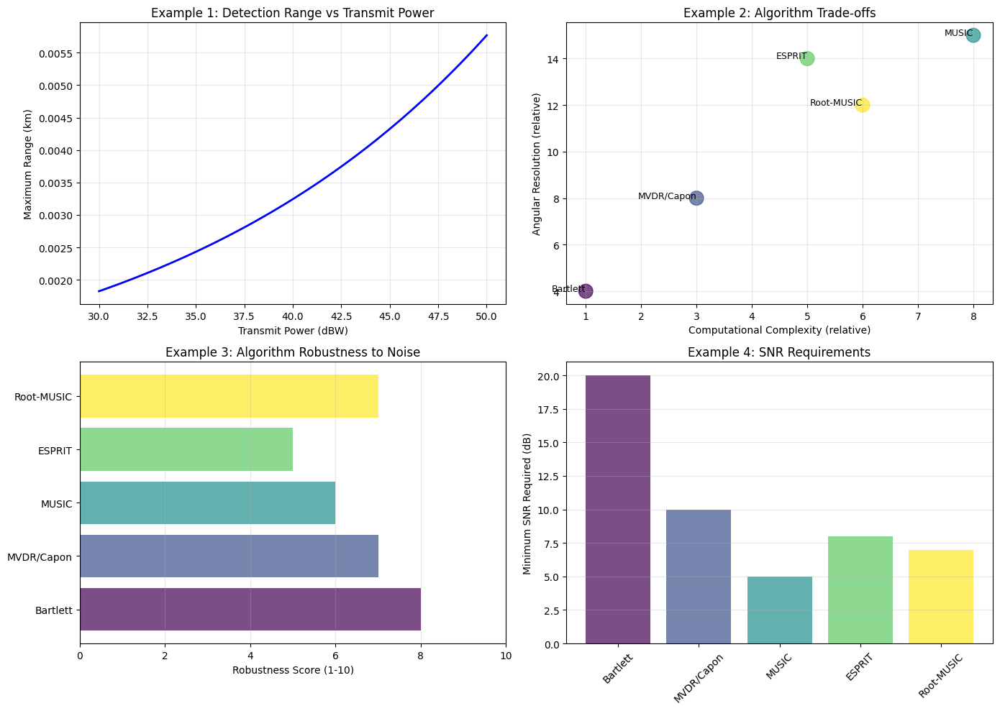


KEY TAKEAWAYS FOR RADAR SYSTEM DESIGN

1. FUNDAMENTALS
   - Range = ct/2 (two-way propagation)
   - Doppler = 2vf_c/c (frequency shift)
   - Resolution = c/(2B) for range, 1/T_cpi for Doppler

2. SIGNAL PROCESSING CHAIN
   - Matched filtering for pulse compression
   - Coherent integration for SNR improvement
   - Doppler processing for velocity estimation
   - CFAR detection for constant false alarm rate

3. ALGORITHM SELECTION
   - Bartlett: Simple, real-time capable
   - MVDR: Better resolution, moderate complexity
   - MUSIC: Highest resolution, high complexity
   - ESPRIT: Efficient, good for linear arrays

4. IMPLEMENTATION CONSIDERATIONS
   - Balance resolution vs. computational cost
   - Adapt algorithms to target environment
   - Use machine learning for classification
   - Implement efficient FFT algorithms

5. PERFORMANCE OPTIMIZATION
   - Increase transmit power for longer range
   - Use high-gain antennas for better directivity
   - Implement adaptive processing for clutt

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, constants

print("\n" + "=" * 80)
print("PRACTICAL RADAR IMPLEMENTATION - BEST PRACTICES")
print("=" * 80)

# ============================================================================
# EXAMPLE 1: COMPLETE RADAR PROCESSING CHAIN
# ============================================================================
print("\n1. COMPLETE RADAR PROCESSING CHAIN")
print("-" * 80)

c = constants.c  # Speed of light

class RadarProcessor:
    """Complete radar signal processing chain"""
    
    def __init__(self, fs, fc, PRF, num_pulses, chirp_bw):
        self.fs = fs  # Sampling frequency
        self.fc = fc  # Carrier frequency
        self.PRF = PRF  # Pulse repetition frequency
        self.num_pulses = num_pulses  # Coherent processing interval
        self.chirp_bw = chirp_bw  # Chirp bandwidth
        self.wavelength = c / fc
        
    def generate_chirp(self, duration):
        """Generate LFM chirp"""
        t = np.arange(int(self.fs * duration)) / self.fs
        k = self.chirp_bw / duration
        phase = 2 * np.pi * (k/2 * t**2)
        chirp = np.cos(phase) + 1j * np.sin(phase)
        return chirp, t
    
    def range_compress(self, received, chirp):
        """Matched filtering for range compression"""
        matched_filter = np.conj(chirp[::-1])
        compressed = np.correlate(received, matched_filter, mode='same')
        return compressed
    
    def doppler_process(self, pulse_train):
        """FFT for Doppler processing"""
        doppler_fft = np.fft.fft(pulse_train, axis=0)
        doppler_fft = np.fft.fftshift(doppler_fft, axes=0)
        return doppler_fft
    
    def cfar_detection(self, rd_map, threshold_db):
        """Simple CFAR detection"""
        threshold = 10**(threshold_db/10) * np.mean(np.abs(rd_map)**2)
        detections = np.abs(rd_map)**2 > threshold
        return detections
    
    def process(self, received_pulse_train, chirp):
        """Complete processing pipeline"""
        # Step 1: Range compression
        compressed = np.zeros_like(received_pulse_train)
        for pulse_idx in range(self.num_pulses):
            compressed[pulse_idx, :] = self.range_compress(
                received_pulse_train[pulse_idx, :], chirp)
        
        # Step 2: Doppler processing
        rd_map = self.doppler_process(compressed)
        
        # Step 3: CFAR detection
        detections = self.cfar_detection(rd_map, threshold_db=5)
        
        return compressed, rd_map, detections

# Initialize processor
fs = 50e6  # 50 MHz sampling
fc = 10e9  # 10 GHz carrier
PRF = 5000  # 5 kHz
num_pulses = 32
chirp_bw = 100e6
chirp_duration = 10e-6

processor = RadarProcessor(fs, fc, PRF, num_pulses, chirp_bw)
chirp, t_chirp = processor.generate_chirp(chirp_duration)

print(f"Radar System Configuration:")
print(f"  Sampling frequency: {fs/1e6:.0f} MHz")
print(f"  Carrier frequency: {fc/1e9:.1f} GHz")
print(f"  PRF: {PRF} Hz")
print(f"  Coherent pulses: {num_pulses}")
print(f"  Chirp bandwidth: {chirp_bw/1e6:.0f} MHz")
print(f"  Range resolution: {c/(2*chirp_bw):.2f} m")
print(f"  Doppler resolution: {PRF/num_pulses:.1f} Hz")

# ============================================================================
# EXAMPLE 2: PERFORMANCE METRICS CALCULATION
# ============================================================================
print("\n2. RADAR PERFORMANCE METRICS")
print("-" * 80)

def calculate_radar_metrics(Pt, Gt, Gr, fc, sigma, SNR_dB, L=1):
    """Calculate key radar performance metrics"""
    metrics = {}
    
    # Basic parameters
    wavelength = c / fc
    metrics['wavelength'] = wavelength
    
    # Maximum detection range
    SNR_linear = 10**(SNR_dB/10)
    Gt_linear = 10**(Gt/10) if isinstance(Gt, float) else Gt
    Gr_linear = 10**(Gr/10) if isinstance(Gr, float) else Gr
    Pt_linear = 10**(Pt/10) if isinstance(Pt, float) else Pt
    
    R_max = ((Pt_linear * Gt_linear * Gr_linear * wavelength**2 * sigma * SNR_linear) / 
             ((4*np.pi)**3 * L))**(1/4)
    metrics['max_range'] = R_max
    
    # Minimum detectable signal
    Pr_min = (SNR_linear * (4*np.pi)**3 * R_max**4 * L) / (Gt_linear * Gr_linear * wavelength**2 * sigma)
    metrics['Pr_min'] = Pr_min
    
    return metrics

# Calculate metrics for typical radar
Pt_dBW = 40
Gt_dB = 35
Gr_dB = 35
sigma_dbsm = 0  # 1 m² RCS
SNR_threshold = 13  # dB

metrics = calculate_radar_metrics(Pt_dBW, Gt_dB, Gr_dB, fc, 10**(sigma_dbsm/10), SNR_threshold)

print(f"Performance Metrics (Typical Radar):")
print(f"  Transmit power: {Pt_dBW} dBW")
print(f"  Antenna gain: {Gt_dB} dB")
print(f"  Target RCS: {sigma_dbsm} dBsm")
print(f"  SNR threshold: {SNR_threshold} dB")
print(f"  → Maximum range: {metrics['max_range']/1000:.1f} km")
print(f"  → Min detectable power: {10*np.log10(metrics['Pr_min']*1000):.2f} dBm")

# ============================================================================
# EXAMPLE 3: COMPARISON OF ALGORITHMS
# ============================================================================
print("\n3. ALGORITHM PERFORMANCE COMPARISON")
print("-" * 80)

comparison_data = {
    'Algorithm': ['Bartlett', 'MVDR/Capon', 'MUSIC', 'ESPRIT', 'Root-MUSIC'],
    'Resolution': [4, 8, 15, 14, 12],  # Relative scale
    'Computation': [1, 3, 8, 5, 6],     # Relative complexity
    'Robustness': [8, 7, 6, 5, 7],      # 1-10 scale
    'SNR Required (dB)': [20, 10, 5, 8, 7],
}

print(f"\n{'Algorithm':<15} {'Resolution':<12} {'Complexity':<12} {'Robustness':<12} {'SNR (dB)':<12}")
print("-" * 65)
for i in range(len(comparison_data['Algorithm'])):
    print(f"{comparison_data['Algorithm'][i]:<15} {comparison_data['Resolution'][i]:<12} "
          f"{comparison_data['Computation'][i]:<12} {comparison_data['Robustness'][i]:<12} "
          f"{comparison_data['SNR Required (dB)'][i]:<12}")

# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Radar range vs power/gain
ranges = np.linspace(1, 200, 100)
powers = np.linspace(30, 50, 100)
ranges_pow = []
for Pt in powers:
    metrics = calculate_radar_metrics(Pt, Gt_dB, Gr_dB, fc, 10**(sigma_dbsm/10), SNR_threshold)
    ranges_pow.append(metrics['max_range']/1000)

axes[0, 0].plot(powers, ranges_pow, 'b-', linewidth=2)
axes[0, 0].set_xlabel('Transmit Power (dBW)')
axes[0, 0].set_ylabel('Maximum Range (km)')
axes[0, 0].set_title('Example 1: Detection Range vs Transmit Power')
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Algorithm comparison - Resolution vs Complexity
algorithms = comparison_data['Algorithm']
resolution = comparison_data['Resolution']
complexity = comparison_data['Computation']

axes[0, 1].scatter(complexity, resolution, s=200, c=range(len(algorithms)), cmap='viridis', alpha=0.7)
for i, txt in enumerate(algorithms):
    axes[0, 1].annotate(txt, (complexity[i], resolution[i]), fontsize=9, ha='right')
axes[0, 1].set_xlabel('Computational Complexity (relative)')
axes[0, 1].set_ylabel('Angular Resolution (relative)')
axes[0, 1].set_title('Example 2: Algorithm Trade-offs')
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Algorithm robustness comparison
robustness = comparison_data['Robustness']
colors = plt.cm.viridis(np.linspace(0, 1, len(algorithms)))
axes[1, 0].barh(algorithms, robustness, color=colors, alpha=0.7)
axes[1, 0].set_xlabel('Robustness Score (1-10)')
axes[1, 0].set_title('Example 3: Algorithm Robustness to Noise')
axes[1, 0].set_xlim([0, 10])
axes[1, 0].grid(True, alpha=0.3, axis='x')

# Plot 4: SNR requirement for different algorithms
snr_required = comparison_data['SNR Required (dB)']
axes[1, 1].bar(algorithms, snr_required, color=colors, alpha=0.7)
axes[1, 1].set_ylabel('Minimum SNR Required (dB)')
axes[1, 1].set_title('Example 4: SNR Requirements')
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('radar_best_practices.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "=" * 80)
print("KEY TAKEAWAYS FOR RADAR SYSTEM DESIGN")
print("=" * 80)
print("""
1. FUNDAMENTALS
   - Range = ct/2 (two-way propagation)
   - Doppler = 2vf_c/c (frequency shift)
   - Resolution = c/(2B) for range, 1/T_cpi for Doppler

2. SIGNAL PROCESSING CHAIN
   - Matched filtering for pulse compression
   - Coherent integration for SNR improvement
   - Doppler processing for velocity estimation
   - CFAR detection for constant false alarm rate

3. ALGORITHM SELECTION
   - Bartlett: Simple, real-time capable
   - MVDR: Better resolution, moderate complexity
   - MUSIC: Highest resolution, high complexity
   - ESPRIT: Efficient, good for linear arrays

4. IMPLEMENTATION CONSIDERATIONS
   - Balance resolution vs. computational cost
   - Adapt algorithms to target environment
   - Use machine learning for classification
   - Implement efficient FFT algorithms

5. PERFORMANCE OPTIMIZATION
   - Increase transmit power for longer range
   - Use high-gain antennas for better directivity
   - Implement adaptive processing for clutter
   - Use multi-sensor fusion for improved accuracy
""")

print("Practical implementation complete!")

## Contactless radar breathing measurement
You can measure breathing by tracking chest wall micro-motions with CW/FMCW radar and converting phase or range oscillations into respiratory rate and tidal pattern. Modern implementations use mmWave (60–120 GHz) for high displacement sensitivity and compact antennas.

### Signal model and sensing choices
- CW phase sensing (single- or dual-antenna):
- Displacement $x(t)$ modulates received phase: $\phi (t)\approx \frac{4\pi }{\lambda }x(t)+\phi _0$.
- Breathing displacements of a few millimeters at $\lambda$ = 5 mm (60 GHz) yield multi-radian phase swings, enabling robust extraction with phase unwrapping.
- FMCW range tracking:
- Beat frequency gives range bins; select the bin of the chest wall and track its phase or instantaneous range over time:
$r(t)=r_0+x(t),\quad x(t)\mathrm{\  is\  quasi-periodic\  at\  }0.1\mathrm{–}0.5\  \mathrm{Hz\  (6–30\  bpm)}$
- Advantage: spatial separation from clutter and multi-target scenes; can suppress interference by gating or adaptive filtering.
- mmWave benefits:
- Small antennas, finer range resolution, stronger phase sensitivity; used in hospital-grade prototypes and research devices for noncontact vital signs.

### Processing pipeline
- 1) Acquisition and front-end
- Choose CW or FMCW radar; set safe output power and PRF/frame rate.
- Place radar 0.3–2 m from the subject, line-of-sight to thorax.
- 2) Range–Doppler pre-filtering (FMCW)
- Compute range FFT per chirp and Doppler FFT across chirps.
- Pick the dominant stationary range bin around the chest wall (lowest Doppler around breathing band) and maintain a track with a simple gate or Kalman filter.
- 3) Phase/displacement extraction
- From the selected bin’s complex I/Q, unwrap phase:

- Optional: use arctangent demodulation and remove DC drift.
- 4) Motion interference suppression
- Combine two spatial channels or dual radars and subtract common-mode motion; or apply PCA/ICA to separate breathing from bulk motion.
- High-pass (0.05 Hz) to remove posture drift; band-pass  to isolate breathing.
- 5) Rate and pattern estimation
- Estimate respiratory rate with autocorrelation or FFT peak:

- Use short-time windows (20–60 s) with overlap; track tidal pattern and amplitude changes.
- 6) Quality and confidence
- Compute SNR in the breathing band, coherence across channels, and a validity flag for downstream use.
These steps match published contactless mmWave vital-sign workflows and demonstrate robust performance in home and hospital settings.

### Practical design parameters
- Waveform: Short FMCW chirps (e.g., , , 64–256 chirps per frame) or CW with IQ sampling.
- Range resolution: $\Delta r=\frac{c}{2B}$. At $B=500\  \mathrm{MHz}, \Delta r\approx 0.3\  \mathrm{m}$; sub-bin phase tracking refines displacement.
- Breathing band: 0.1–0.5 Hz (6–30 bpm). Use band-pass filter and notch removal if mains interference present.
- Dual-radar/channel layouts: Place sensors with slight baselines to decorrelate environmental motion; fuse signals to suppress interference.
- Deployment: Mount on bedside table or wall; reduce specular clutter with slight tilt; maintain privacy and comfort in clinical settings.

### Robustness and edge cases
- Multi-person scenes: Track multiple bins; apply data association and per-bin band-pass + rate extraction; reject bins with low coherence.
- Large body motions: Freeze tracking when motion energy outside breathing band spikes; resume with re-acquisition. Dual-channel subtraction helps.
- Occlusion/clutter: Use adaptive range bin selection by maximizing breathing-band power over near-field bins; avoid specular saturations.
- Privacy and comfort: Radar is noncontact and works through clothing and blankets; ensure regulatory compliance and safe power levels.


/tmp/ipykernel_2665/2204676483.py:217: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


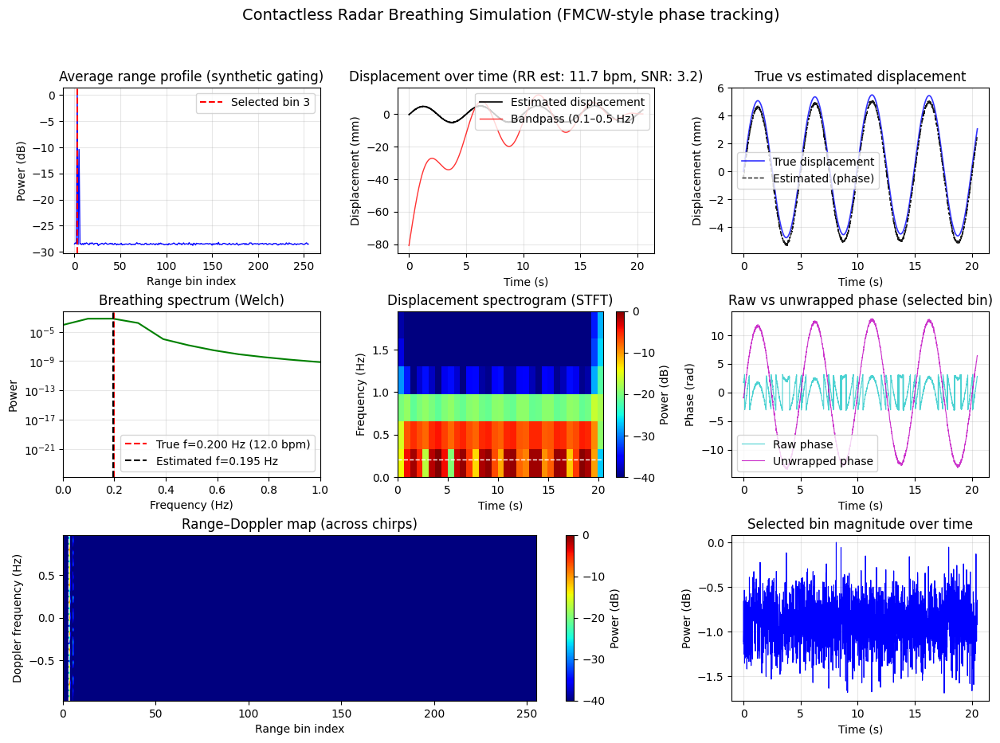

Simulation summary:
- True RR: 12.0 bpm
- Estimated RR: 11.7 bpm
- Breathing SNR (Welch band): 3.19
- Selected range bin: 3 (target bin: 3)


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, welch, stft

# =============================================================================
# Configuration
# =============================================================================
c = 3e8                  # speed of light [m/s]
fc = 60e9                # carrier frequency [Hz] (mmWave)
lam = c / fc             # wavelength [m]
chirp_rate = 100.0       # chirps per second (slow-time sampling rate) [Hz]
num_chirps = 2048        # total chirps (e.g., ~20.48 s)
num_range_bins = 256     # synthetic range FFT bins

# Scene geometry (synthetic)
r0 = 1.5                 # nominal subject range [m]
bin_width = 0.5          # effective range bin width [m]
target_bin = int(r0 / bin_width)  # index where chest wall echo lands (synthetic gating)
target_bin = max(1, min(num_range_bins-2, target_bin))

# Breathing model
rr_bpm_true = 12.0       # true respiratory rate [breaths per minute]
f_breath = rr_bpm_true / 60.0  # Hz
A_breath = 5e-3          # breathing displacement amplitude [m] (~5 mm)
drift_amp = 5e-4         # slow drift amplitude [m]
drift_freq = 0.02        # Hz (posture drift)

# Noise and interference
mag_snr_db = 20.0        # SNR in magnitude at the selected bin
phase_noise_std = 0.15   # radians standard deviation
bulk_motion_amp = 2e-3   # bulk motion amplitude [m] (sporadic)
bulk_motion_prob = 0.02  # probability of a bulk motion event per second

# Bandpass for breathing extraction
bp_low, bp_high = 0.1, 0.5  # Hz breathing band
welch_nperseg = 1024

# =============================================================================
# Helpers
# =============================================================================
def bandpass(x, fs, f1, f2, order=4):
    b, a = butter(order, [f1/(fs/2), f2/(fs/2)], btype='band')
    return filtfilt(b, a, x)

def simulate_breathing_displacement(t):
    # Base breathing + drift
    x = A_breath * np.sin(2*np.pi*f_breath*t)
    x += drift_amp * np.sin(2*np.pi*drift_freq*t)
    # Sporadic bulk motion events
    rng = np.random.default_rng(7)
    events = rng.random(len(t)) < (bulk_motion_prob / chirp_rate)
    # Add small impulses spread over short windows
    for i in range(len(t)):
        if events[i]:
            wlen = rng.integers(10, 50)
            amp = bulk_motion_amp * (0.5 + rng.random())
            j1 = min(len(t), i + wlen)
            x[i:j1] += amp * np.hanning(j1 - i)
    return x

def displacement_to_phase(x):
    # Phase modulation due to displacement: phi = 4*pi*x/lambda
    return (4*np.pi/lam) * x

def estimate_rr(x, fs, f1=bp_low, f2=bp_high, nperseg=welch_nperseg):
    xf = bandpass(x, fs, f1, f2)
    f, Pxx = welch(xf, fs=fs, nperseg=min(nperseg, len(xf)))
    mask = (f >= f1) & (f <= f2)
    f_band = f[mask]; P_band = Pxx[mask]
    if P_band.size == 0:
        return np.nan, 0.0, xf, f, Pxx
    f_resp = f_band[np.argmax(P_band)]
    rr_bpm = 60.0 * f_resp
    snr = (np.max(P_band) / (np.mean(P_band) + 1e-12))
    return rr_bpm, snr, xf, f, Pxx

# =============================================================================
# Simulation: FMCW range bins with breathing in one bin (complex I/Q per chirp)
# =============================================================================
t = np.arange(num_chirps) / chirp_rate
x_disp = simulate_breathing_displacement(t)            # meters
phi = displacement_to_phase(x_disp)                    # radians
phi_noisy = phi + np.random.randn(num_chirps) * phase_noise_std

# Create synthetic range-bin cube: (num_chirps, num_range_bins)
# Place complex I/Q with phase modulation in target bin; other bins are noise
rng = np.random.default_rng(42)
range_cube = (0.3 * (rng.standard_normal((num_chirps, num_range_bins)) +
                     1j * rng.standard_normal((num_chirps, num_range_bins)))).astype(np.complex64)

# Signal magnitude and phase at the target bin
mag_signal = 10**(mag_snr_db/20.0)
range_cube[:, target_bin] += mag_signal * np.exp(1j * (phi_noisy + rng.uniform(0, 2*np.pi)))

# Optionally add a weak clutter bin nearby
range_cube[:, target_bin+2] += 0.3 * mag_signal * np.exp(1j * rng.uniform(0, 2*np.pi, size=num_chirps))

# Select the chest-wall bin by max average magnitude (simulates automatic gating)
avg_mag = np.mean(np.abs(range_cube), axis=0)
selected_bin = int(np.argmax(avg_mag))

iq_selected = range_cube[:, selected_bin]  # complex slow-time series

# Unwrap phase and convert to displacement
phi_u = np.unwrap(np.angle(iq_selected))
phi_u -= np.median(phi_u)  # center
x_est = (lam/(4*np.pi)) * phi_u  # meters

# Bandpass filter to breathing band
x_bp = bandpass(x_est, chirp_rate, bp_low, bp_high)

# Estimate RR via Welch
rr_bpm_est, snr_breath, x_bp_out, f_welch, P_welch = estimate_rr(x_est, chirp_rate)

# Short-time spectrogram (STFT) of displacement
f_stft, t_stft, Zxx = stft(x_est, fs=chirp_rate, window='hann', nperseg=256, noverlap=192)
# Convert to dB and restrict display to breathing band
Z_db = 20*np.log10(np.abs(Zxx)/np.max(np.abs(Zxx))+1e-6)
mask_stft = (f_stft >= 0.0) & (f_stft <= 2.0)

# =============================================================================
# Visualization
# =============================================================================
fig = plt.figure(figsize=(15, 10))
gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)

# Plot 1: Average range profile (bin magnitude)
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(np.arange(num_range_bins), 20*np.log10(avg_mag/np.max(avg_mag)+1e-6), 'b-', lw=1)
ax1.axvline(selected_bin, color='r', ls='--', label=f'Selected bin {selected_bin}')
ax1.set_title('Average range profile (synthetic gating)')
ax1.set_xlabel('Range bin index')
ax1.set_ylabel('Power (dB)')
ax1.grid(True, alpha=0.3)
ax1.legend()

# Plot 2: Displacement vs time
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(t, x_est*1e3, 'k-', lw=1.2, label='Estimated displacement')
ax2.plot(t, x_bp*1e3, 'r-', lw=1.0, alpha=0.8, label='Bandpass (0.1–0.5 Hz)')
ax2.set_title(f'Displacement over time (RR est: {rr_bpm_est:.1f} bpm, SNR: {snr_breath:.1f})')
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Displacement (mm)')
ax2.grid(True, alpha=0.3)
ax2.legend(loc='upper right')

# Plot 3: True vs estimated displacement (overlay)
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(t, x_disp*1e3, 'b-', lw=1.2, alpha=0.8, label='True displacement')
ax3.plot(t, x_est*1e3, 'k--', lw=1.0, alpha=0.9, label='Estimated (phase)')
ax3.set_title('True vs estimated displacement')
ax3.set_xlabel('Time (s)')
ax3.set_ylabel('Displacement (mm)')
ax3.grid(True, alpha=0.3)
ax3.legend()

# Plot 4: Breathing-band spectrum (Welch)
ax4 = fig.add_subplot(gs[1, 0])
ax4.semilogy(f_welch, P_welch, 'g-')
ax4.axvline(f_breath, color='r', ls='--', label=f'True f={f_breath:.3f} Hz ({rr_bpm_true:.1f} bpm)')
if not np.isnan(rr_bpm_est):
    ax4.axvline(rr_bpm_est/60.0, color='k', ls='--', label=f'Estimated f={rr_bpm_est/60.0:.3f} Hz')
ax4.set_xlim(0.0, 1.0)
ax4.set_title('Breathing spectrum (Welch)')
ax4.set_xlabel('Frequency (Hz)')
ax4.set_ylabel('Power')
ax4.grid(True, alpha=0.3)
ax4.legend()

# Plot 5: STFT spectrogram (displacement)
ax5 = fig.add_subplot(gs[1, 1])
im5 = ax5.imshow(Z_db[mask_stft, :], origin='lower', aspect='auto',
                 extent=[t_stft[0], t_stft[-1], f_stft[mask_stft][0], f_stft[mask_stft][-1]],
                 cmap='jet', vmin=-40, vmax=0)
ax5.axhline(f_breath, color='w', ls='--', lw=1)
ax5.set_title('Displacement spectrogram (STFT)')
ax5.set_xlabel('Time (s)')
ax5.set_ylabel('Frequency (Hz)')
plt.colorbar(im5, ax=ax5, label='Power (dB)')

# Plot 6: Phase and unwrapped phase
ax6 = fig.add_subplot(gs[1, 2])
ax6.plot(t, np.angle(iq_selected), 'c-', lw=0.8, alpha=0.7, label='Raw phase')
ax6.plot(t, phi_u, 'm-', lw=0.8, alpha=0.8, label='Unwrapped phase')
ax6.set_title('Raw vs unwrapped phase (selected bin)')
ax6.set_xlabel('Time (s)')
ax6.set_ylabel('Phase (rad)')
ax6.grid(True, alpha=0.3)
ax6.legend()

# Plot 7: Range–Doppler (optional: Doppler across chirps per bin)
# Compute Doppler FFT across chirps for each bin and show around DC for selected bin
ax7 = fig.add_subplot(gs[2, :2])
doppler_fft = np.fft.fftshift(np.fft.fft(range_cube, axis=0), axes=0)  # across chirps
rd_map = 20*np.log10(np.maximum(np.abs(doppler_fft), 1e-12) / np.max(np.abs(doppler_fft)))
doppler_axis = np.fft.fftshift(np.fft.fftfreq(num_chirps, d=1.0/chirp_rate))
# Show a narrow band around 0 Hz for the selected bin
win = (doppler_axis >= -1.0) & (doppler_axis <= 1.0)
im7 = ax7.imshow(rd_map[win, :], origin='lower', aspect='auto',
                 extent=[0, num_range_bins-1, doppler_axis[win][0], doppler_axis[win][-1]],
                 cmap='jet', vmin=-40, vmax=0)
ax7.axvline(selected_bin, color='w', ls='--', lw=1)
ax7.set_title('Range–Doppler map (across chirps)')
ax7.set_xlabel('Range bin index')
ax7.set_ylabel('Doppler frequency (Hz)')
plt.colorbar(im7, ax=ax7, label='Power (dB)')

# Plot 8: Gating consistency over time (magnitude in selected bin)
ax8 = fig.add_subplot(gs[2, 2])
ax8.plot(t, 20*np.log10(np.abs(iq_selected)/np.max(np.abs(iq_selected))+1e-6), 'b-', lw=0.8)
ax8.set_title('Selected bin magnitude over time')
ax8.set_xlabel('Time (s)')
ax8.set_ylabel('Power (dB)')
ax8.grid(True, alpha=0.3)

plt.suptitle('Contactless Radar Breathing Simulation (FMCW-style phase tracking)', fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

# =============================================================================
# Summary
# =============================================================================
print("Simulation summary:")
print(f"- True RR: {rr_bpm_true:.1f} bpm")
print(f"- Estimated RR: {rr_bpm_est:.1f} bpm")
print(f"- Breathing SNR (Welch band): {snr_breath:.2f}")
print(f"- Selected range bin: {selected_bin} (target bin: {target_bin})")